In [1]:
import pandas as pd #the csv reading library
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns

from pylab import rcParams
from numpy import diff
from scipy import interpolate
import scipy.stats as stats

from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress
from scipy.signal import savgol_filter

import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols

import matplotlib.gridspec as gridspec
from IPython.display import display, Math

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression

import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols

import matplotlib.gridspec as gridspec
from IPython.display import display, Math
from sklearn.metrics import r2_score

from statistics import mean, median
from pylr2 import regress2

import seawater

from pylr2 import regress2

In [2]:

data_wc = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/data_wc.csv')

data_wc.loc[data_wc['pw_flux_doc'] > 25, 'pw_flux_doc'] = np.nan
data_wc['ratio_flux_2_stock'] = data_wc['pw_flux_doc'] / data_wc['doc_mol_per_m3_0_to_5cm']
data_wc['ratio_stock_2_flux'] = data_wc['doc_mol_per_m3_0_to_5cm'] / data_wc['pw_flux_doc']


n = 0.29
data_wc['Cox'] = data_wc['pw_flux_doc'] / 0.36
data_wc['Cox'] = data_wc['Cox'] ** (1/n)

data_wc['ratio_pw_flux_doc_2_cox'] = data_wc['pw_flux_doc'] / data_wc['Cox']

data_wc['ratio_doc_2_fet'] = data_wc['doc_mol_per_m3_0_to_5cm'] / data_wc['fet_mol_per_m3_0_to_25cm']
data_wc['ratio_oc_2_fet'] = data_wc['OC_mol_per_m3_0_to_5cm'] / data_wc['fet_mol_per_m3_0_to_5cm']


data_wc['group'] == "water_col"
data_wc['group']


# Define a function to assign group
def assign_group(df):
    max_depth_index = df['Depth'].idxmax()
    df.loc[df['Depth'] <= 5, 'group'] = 'Surface'
    df.loc[max_depth_index, 'group'] = 'BBL'
    return df

# Apply the function within groups
data_wc = data_wc.groupby(['Campaign', 'Location']).apply(assign_group).reset_index(drop=True)


data_wc['group'].unique()

data_wc['aou_ceq'] = data_wc['aou'] * .76 

data_wc_all = data_wc


df_note = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/Station_summary.csv',sep=',', index_col=0)
df_note['Date'] = pd.to_datetime(df_note['date'])
note_join = df_note['rgn']


data_wc_all['code'] = data_wc_all['Location'] + '_' + data_wc_all['Campaign']
data_wc_all.index = data_wc_all['code']
data_wc_all['rgn'] = note_join

data_wc_bbl = data_wc_all[data_wc_all['group'] == "BBL"]
data_wc_surf = data_wc_all[data_wc_all['group'] == "Surface"]
data_wc = data_wc_all[data_wc_all['group'] == "water_col"]
#data_wc = data_wc_all[data_wc_all['group'].isin(["water_col", "Surface"])]


data_wc_hsal = data_wc[data_wc['sal'] >= 33]
data_wc_lsal = data_wc[data_wc['sal'] <= 33]

data_bbl_hsal = data_wc_bbl[data_wc_bbl['sal'] >= 33]
data_bbl_lsal = data_wc_bbl[data_wc_bbl['sal'] <= 33]

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\770799537.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_wc = data_wc.groupby(['Campaign', 'Location']).apply(assign_group).reset_index(drop=True)


In [3]:
listy = data_wc_bbl[data_wc_bbl['pw_flux_doc'].notna()]

listy['bottom_layer_depth'] = 'X'

listy.loc['St.11_GOM2021', 'bottom_layer_depth'] = 175
listy.loc['St.14_GOM2021', 'bottom_layer_depth'] = 60
listy.loc['St.15_GOM2021', 'bottom_layer_depth'] = 50
listy.loc['St.16_GOM2021', 'bottom_layer_depth'] = 30
listy.loc['St.2_GOM2021', 'bottom_layer_depth'] = 10
listy.loc['St.7_GOM2021', 'bottom_layer_depth'] = 10
listy.loc['St.MK_GOM2021', 'bottom_layer_depth'] = 10
listy.loc['St.11_GOM21FA', 'bottom_layer_depth'] = 200
listy.loc['St.12_GOM21FA', 'bottom_layer_depth'] = 200
listy.loc['St.13_GOM21FA', 'bottom_layer_depth'] = 75
listy.loc['St.14_GOM21FA', 'bottom_layer_depth'] = 25
listy.loc['St.15_GOM21FA', 'bottom_layer_depth'] = 50
listy.loc['St.16_GOM21FA', 'bottom_layer_depth'] = 40
listy.loc['St.2_GOM21FA', 'bottom_layer_depth'] = 30
listy.loc['St.4_GOM21FA', 'bottom_layer_depth'] = 12
listy.loc['St.5B_GOM21FA', 'bottom_layer_depth'] = 8
listy.loc['St.7_GOM21FA', 'bottom_layer_depth'] = 15
listy.loc['St.9_GOM21FA', 'bottom_layer_depth'] = 40
listy.loc['St.MK_GOM21FA', 'bottom_layer_depth'] = 8
listy.loc['St.13_GOM22SP', 'bottom_layer_depth'] = 100
listy.loc['St.14_GOM22SP', 'bottom_layer_depth'] = 20
listy.loc['St.15_GOM22SP', 'bottom_layer_depth'] = 30
listy.loc['St.16_GOM22SP', 'bottom_layer_depth'] = 20
listy.loc['St.2_GOM22SP', 'bottom_layer_depth'] = 20
listy.loc['St.4_GOM22SP', 'bottom_layer_depth'] = 10
listy.loc['St.5B_GOM22SP', 'bottom_layer_depth'] = 8
listy.loc['St.7_GOM22SP', 'bottom_layer_depth'] = 20
listy.loc['St.9_GOM22SP', 'bottom_layer_depth'] = 20
listy.loc['St.MK_GOM22SP', 'bottom_layer_depth'] = 8
listy.loc['St.11_GOM22SU', 'bottom_layer_depth'] = 200
listy.loc['St.12_GOM22SU', 'bottom_layer_depth'] = 200
listy.loc['St.13_GOM22SU', 'bottom_layer_depth'] = 100
listy.loc['St.14_GOM22SU', 'bottom_layer_depth'] = 30
listy.loc['St.15_GOM22SU', 'bottom_layer_depth'] = 100
listy.loc['St.16_GOM22SU', 'bottom_layer_depth'] = 10
listy.loc['St.2_GOM22SU', 'bottom_layer_depth'] = 10
listy.loc['St.4_GOM22SU', 'bottom_layer_depth'] = 12
listy.loc['St.5B_GOM22SU', 'bottom_layer_depth'] = 8
listy.loc['St.7_GOM22SU', 'bottom_layer_depth'] = 10
listy.loc['St.9_GOM22SU', 'bottom_layer_depth'] = 20
listy.loc['St.MK_GOM22SU', 'bottom_layer_depth'] = 8


bottom_layer_depth = listy['bottom_layer_depth']
bottom_layer_depth

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3632903389.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listy['bottom_layer_depth'] = 'X'


code
St.11_GOM2021    175
St.14_GOM2021     60
St.15_GOM2021     50
St.16_GOM2021     30
St.2_GOM2021      10
St.7_GOM2021      10
St.MK_GOM2021     10
St.11_GOM21FA    200
St.12_GOM21FA    200
St.13_GOM21FA     75
St.14_GOM21FA     25
St.15_GOM21FA     50
St.16_GOM21FA     40
St.2_GOM21FA      30
St.4_GOM21FA      12
St.5B_GOM21FA      8
St.7_GOM21FA      15
St.9_GOM21FA      40
St.MK_GOM21FA      8
St.13_GOM22SP    100
St.14_GOM22SP     20
St.15_GOM22SP     30
St.16_GOM22SP     20
St.2_GOM22SP      20
St.4_GOM22SP      10
St.5B_GOM22SP      8
St.7_GOM22SP      20
St.9_GOM22SP      20
St.MK_GOM22SP      8
St.11_GOM22SU    200
St.12_GOM22SU    200
St.13_GOM22SU    100
St.14_GOM22SU     30
St.15_GOM22SU    100
St.16_GOM22SU     10
St.2_GOM22SU      10
St.4_GOM22SU      12
St.5B_GOM22SU      8
St.7_GOM22SU      10
St.9_GOM22SU      20
St.MK_GOM22SU      8
Name: bottom_layer_depth, dtype: object

In [4]:
def xyplotcolor(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    

In [5]:

def tls_regression(x, y):
    # Add a column of ones to x to represent the intercept
    X = np.column_stack((np.ones(len(x)), x))

    # Compute the SVD of X
    U, s, Vt = np.linalg.svd(X, full_matrices=False)

    # Compute the pseudo-inverse of X
    X_inv = np.dot(Vt.T / s, U.T)

    # Compute the TLS regression coefficients
    beta_tls = np.dot(X_inv, y)

    return beta_tls

# Assuming you have your data x_var and y_var
x_var = data_wc_hsal['aou_ceq']
y_var = data_wc_hsal['NPOC_uM']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls


from pylr2 import regress2
results = regress2(x_var, y_var, _method_type_2="reduced major axis")

results

print("Intercept (TLS):", results['intercept'])
print("Slope (TLS):", results['slope'])
print("R2 (TLS):", results['r']*results['r'])

Cal_slope = results['slope']

Intercept (TLS): 104.78897431681483
Slope (TLS): -0.5685705239909127
R2 (TLS): 0.32642277668959097


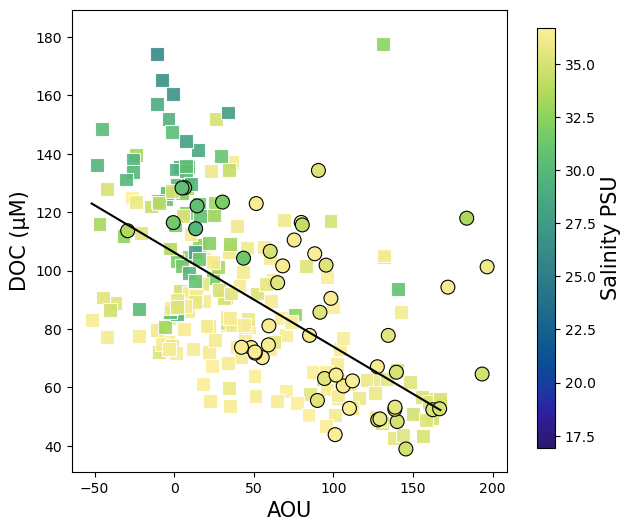

In [6]:
def xyplotcolor_2data(df, df2):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].min()
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    sub2 = df2.dropna(subset=[x_var, y_var])
    data2 = sub2[[x_var, y_var, z_var]]
    colors2 = data2[z_var].astype(float)
    X2 = data2[[x_var]]
    y2 = data2[y_var]
    
    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color,marker ="s", s=100, alpha = .9, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    
    sns.scatterplot(x=x_var, y=y_var, c=colors2, cmap=z_var_color, s=100, data=data2, edgecolor = 'black', ax=axes, legend=False, vmin=vmin, vmax=vmax)

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)
    axes.set_ylim(data_wc_all[y_var].min()*.8, data_wc_all[y_var].max()*.7)

    #axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
x_var = 'aou'
y_var = 'NPOC_uM'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM)'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline


titel = "BBL and Water Col "
save_name = 'aou_sal_wc_and_bbl_2'
xyplotcolor_2data(data_wc, data_wc_bbl)


## part 1 ##

Define Conservite mixing and subtract river contripution 

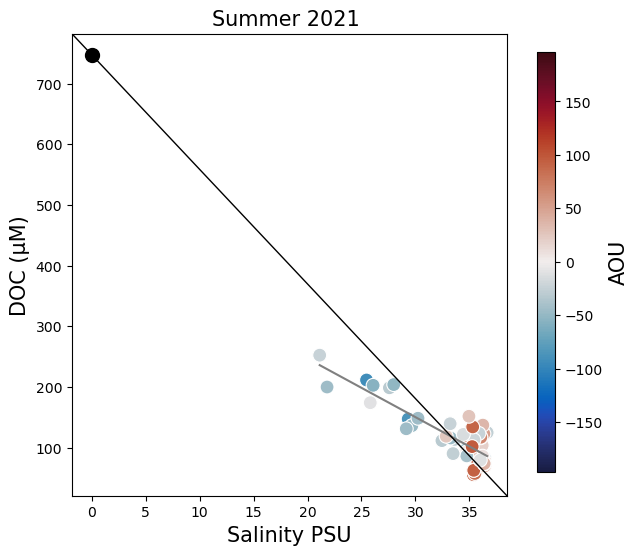

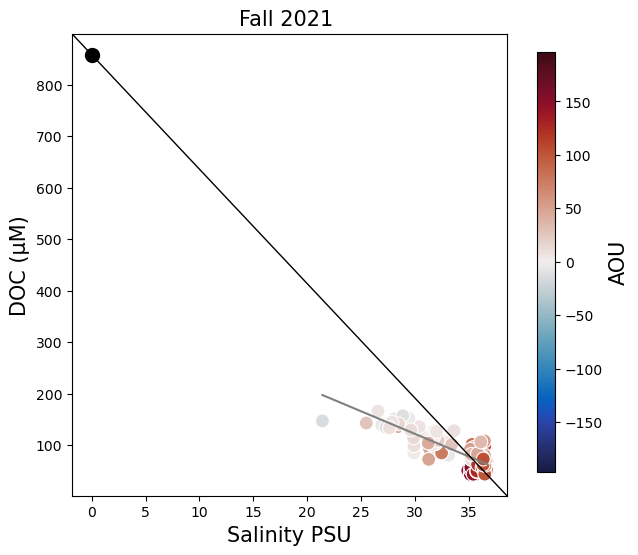

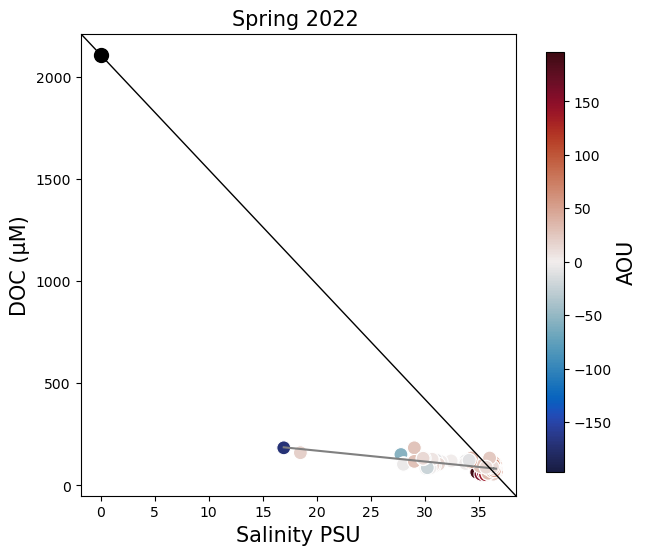

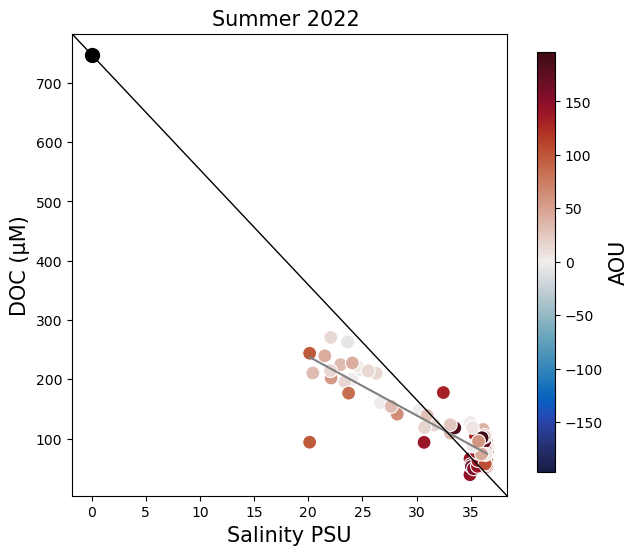

In [7]:
def xyplotcolor_line_ab(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_all[z_var].max()*-1
    vmax = data_wc_all[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False , vmin=vmin, vmax=vmax)
    axes.plot([0], [season_DOC*1000/12], marker='o', markersize=10, color="black")
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='grey')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline((0, season_DOC*1000/12), (data[x_var].max(), data[y_var].min()), linewidth=1, color='black')
    
    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance

titel = "Summer 2021 "
season_DOC = 8.97
save_name = 'DOC_SAL_AOU_river_pt_gom2021'
xyplotcolor_line_ab(data_wc_all[data_wc_all['Campaign'] == 'GOM2021'])

titel = "Fall 2021 "
season_DOC = 10.3
save_name = 'DOC_SAL_AOU_river_pt_GOM21FA'
xyplotcolor_line_ab(data_wc_all[data_wc_all['Campaign'] == 'GOM21FA'])

titel = "Spring 2022 "
season_DOC = 25.3
save_name = 'DOC_SAL_AOU_river_pt_GOM22SP'
xyplotcolor_line_ab(data_wc_all[data_wc_all['Campaign'] == 'GOM22SP'])

titel = "Summer 2022 "
season_DOC = 8.97
save_name = 'DOC_SAL_AOU_river_pt_GOM22SU'
xyplotcolor_line_ab(data_wc_all[data_wc_all['Campaign'] == 'GOM22SU'])

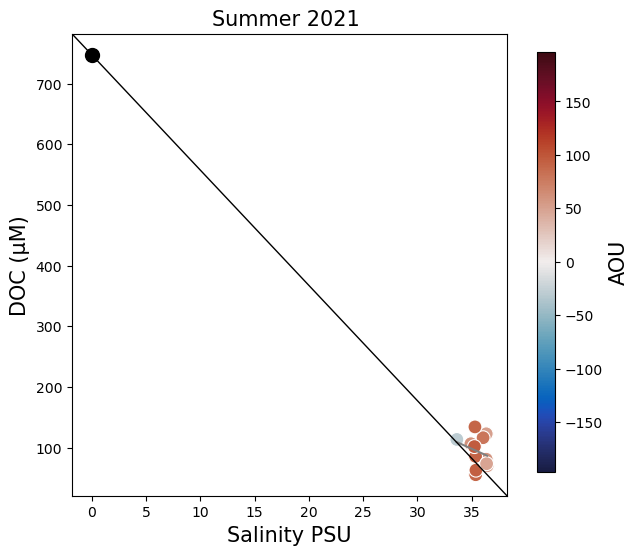

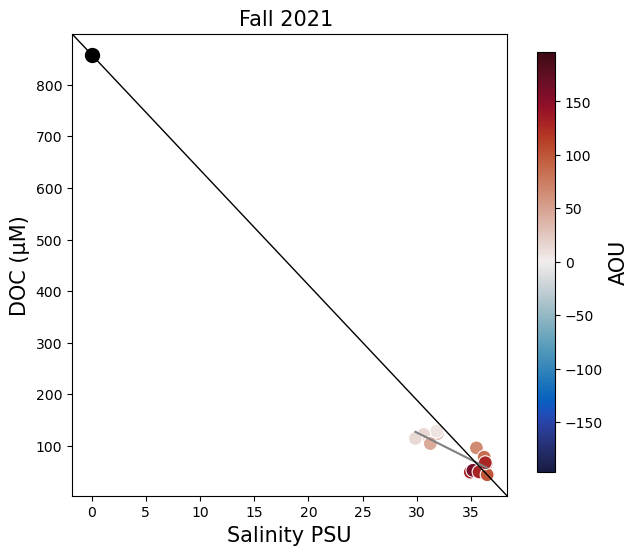

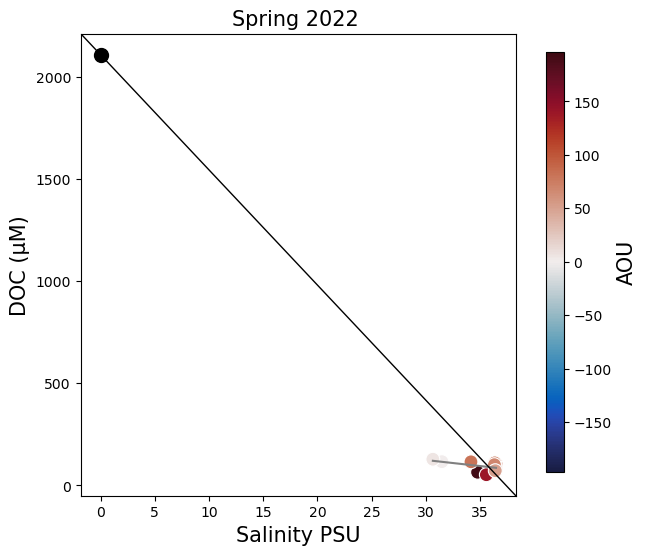

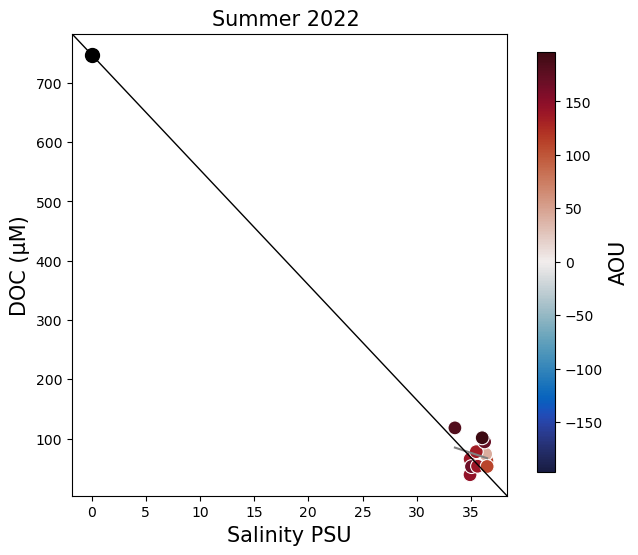

In [8]:
y_var = 'NPOC_uM'
x_var = 'sal' 

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)' 

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance

titel = "Summer 2021 "
season_DOC = 8.97
save_name = 'DOC_SAL_AOU_river_pt_gom2021_bbl'
xyplotcolor_line_ab(data_wc_bbl[data_wc_bbl['Campaign'] == 'GOM2021'])

titel = "Fall 2021 "
season_DOC = 10.3
save_name = 'DOC_SAL_AOU_river_pt_GOM21FA_bbl'
xyplotcolor_line_ab(data_wc_bbl[data_wc_bbl['Campaign'] == 'GOM21FA'])

titel = "Spring 2022 "
season_DOC = 25.3
save_name = 'DOC_SAL_AOU_river_pt_GOM22SP_bbl'
xyplotcolor_line_ab(data_wc_bbl[data_wc_bbl['Campaign'] == 'GOM22SP'])

titel = "Summer 2022 "
season_DOC = 8.97
save_name = 'DOC_SAL_AOU_river_pt_GOM22SU_bbl'
xyplotcolor_line_ab(data_wc_bbl[data_wc_bbl['Campaign'] == 'GOM22SU'])

salinity cuttoff: 25  PSU
not with surf data
not with river data
not with river data



Sal:DOC All Data
Intercept (TLS): 491.4427076986566
Slope (TLS): -11.582441439451957
R2 (TLS): 0.4844930721432657

Sal:DOC Summer 2021
Intercept (TLS): 527.8523060461165
Slope (TLS): -12.161669322562648
R2 (TLS): 0.42721174352044244
DOC exp at salintiy 30 163.00222636923706

Sal:DOC Fall 2021
Intercept (TLS): 480.7379206756806
Slope (TLS): -11.547418494334138
R2 (TLS): 0.6911347083611722
DOC exp at salintiy 30 134.3153658456564

Sal:DOC Spring 2022
Intercept (TLS): 420.387042791628
Slope (TLS): -9.56309985570033
R2 (TLS): 0.3476624442032016
DOC exp at salintiy 30 133.49404712061812

Sal:DOC Summer 2022
Intercept (TLS): 537.5956744012946
Slope (TLS): -12.781380320934177
R2 (TLS): 0.5176257364969656
DOC exp at salintiy 30 154.15426477326923



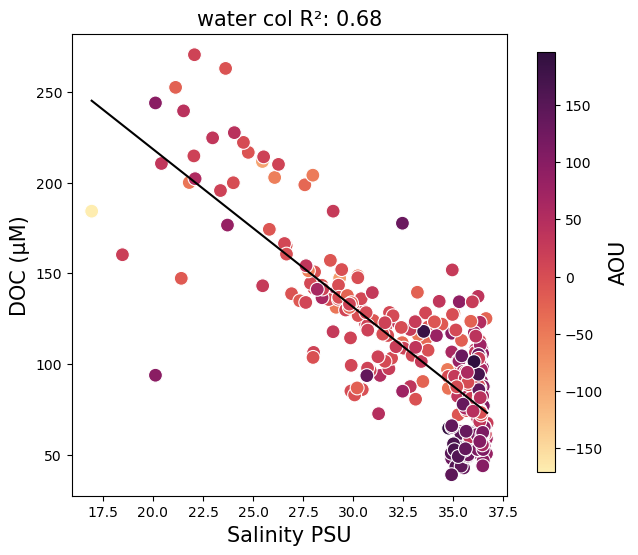

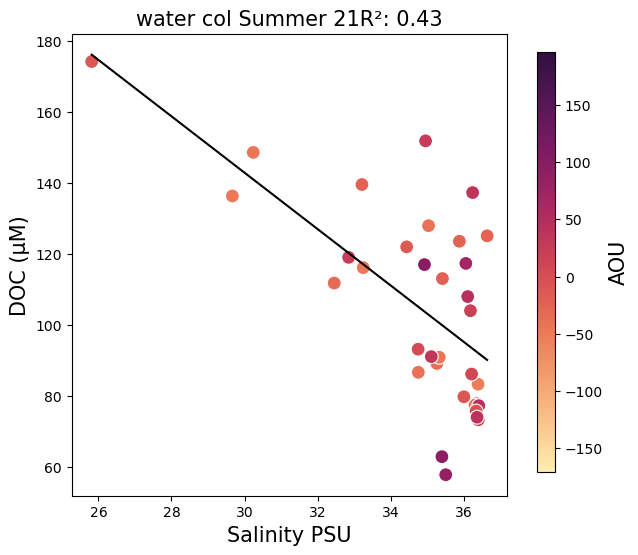

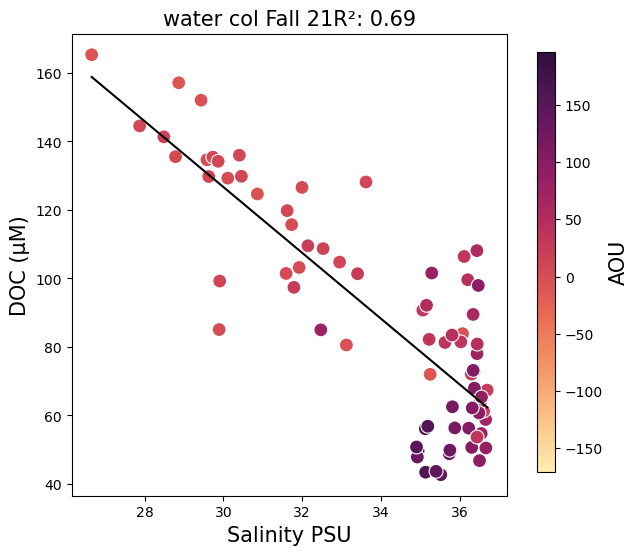

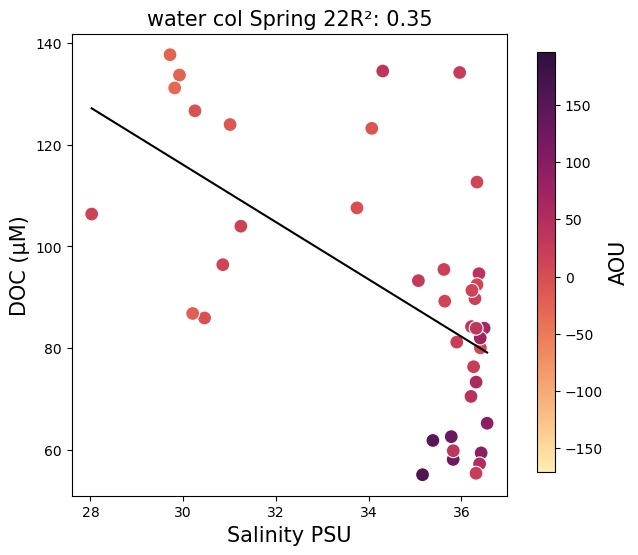

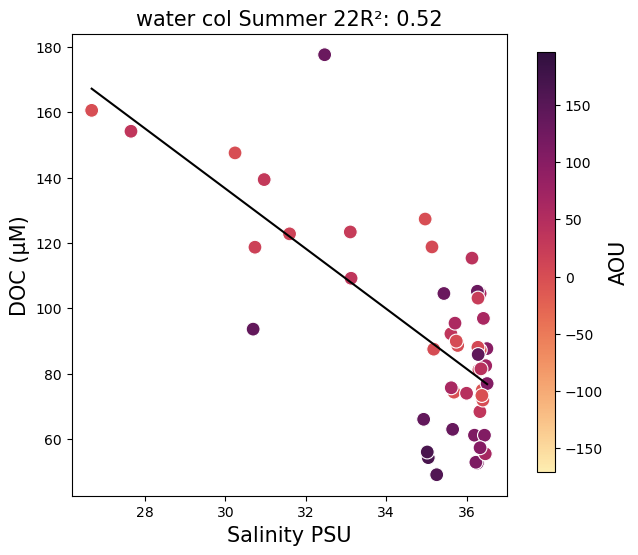

In [9]:
def tls_regression(x, y):
    # Add a column of ones to x to represent the intercept
    X = np.column_stack((np.ones(len(x)), x))

    # Compute the SVD of X
    U, s, Vt = np.linalg.svd(X, full_matrices=False)

    # Compute the pseudo-inverse of X
    X_inv = np.dot(Vt.T / s, U.T)

    # Compute the TLS regression coefficients
    beta_tls = np.dot(X_inv, y)

    return beta_tls

#decide a sal cutoff for the regression 
sal_cut_off = 25
print(f"salinity cuttoff: {sal_cut_off}  PSU")

#decide on river data added 
river_pt = 'no' 

#decide on surface water added 
surf_pts = 'no' 


# Get each season alone
GOM2021 = data_wc[data_wc['Campaign'] == 'GOM2021']
GOM21FA = data_wc[data_wc['Campaign'] == 'GOM21FA']
GOM22SP = data_wc[data_wc['Campaign'] == 'GOM22SP']
GOM22SU = data_wc[data_wc['Campaign'] == 'GOM22SU']

#use only data with low sal
GOM2021 = GOM2021[GOM2021['sal'] >= sal_cut_off]
GOM21FA = GOM21FA[GOM21FA['sal'] >= sal_cut_off]
GOM22SP = GOM22SP[GOM22SP['sal'] >= sal_cut_off]
GOM22SU = GOM22SU[GOM22SU['sal'] >= sal_cut_off]

if surf_pts == 'no': 
    GOM2021 = GOM2021[GOM2021['group'] != "Surface"]
    GOM21FA = GOM21FA[GOM21FA['group'] != "Surface"]
    GOM22SP = GOM22SP[GOM22SP['group'] != "Surface"]
    GOM22SU = GOM22SU[GOM22SU['group'] != "Surface"]
    print('not with surf data')
else: 
    print('with surf data')

DOC_sum21 = 8.97
DOC_fal21 = 10.3
DOC_spr22 = 25.3
DOC_sum22 = 8.97

# all data
x_var = data_wc['sal']
y_var = data_wc['NPOC_uM']

if river_pt == 'yes': 
    x_var.loc[len(x_var)] = 0
    y_var.loc[len(y_var)] = 10*1000/12
    print('with river data')
else: 
    print('not with river data')

beta_tls = tls_regression(x_var, y_var)
intercept_tls, slope_tls = beta_tls

results_ = regress2(x_var, y_var, _method_type_2="reduced major axis")

slope_ = results_['slope']
intercept_ = results_['intercept']
r_ = results_['r']

# SUMMER 2021
x_var = GOM2021['sal']
y_var = GOM2021['NPOC_uM']

if river_pt == 'yes': 
    x_var.loc[len(x_var)] = 0
    y_var.loc[len(y_var)] = DOC_sum21*1000/12
    print('with river data')
else: 
    print('not with river data')

beta_tls = tls_regression(x_var, y_var)
intercept_tls, slope_tls = beta_tls

results_sum_21 = regress2(x_var, y_var, _method_type_2="reduced major axis")

slope_sum21 = results_sum_21['slope']
intercept_sum21 = results_sum_21['intercept']
r_sum21 = results_sum_21['r']

# FALL 2021
x_var = GOM21FA['sal']
y_var = GOM21FA['NPOC_uM']

if river_pt == 'yes': 
    x_var.loc[len(x_var)] = 0
    y_var.loc[len(y_var)] = DOC_fal21*1000/12
else: 
    print('')

beta_tls = tls_regression(x_var, y_var)
intercept_tls, slope_tls = beta_tls

results_fal_21 = regress2(x_var, y_var, _method_type_2="reduced major axis")

slope_fal21 = results_fal_21['slope']
intercept_fal21 = results_fal_21['intercept']
r_fal21 = results_fal_21['r']

# SPRING 2021
x_var = GOM22SP['sal']
y_var = GOM22SP['NPOC_uM']

if river_pt == 'yes': 
    x_var.loc[len(x_var)] = 0
    y_var.loc[len(y_var)] = DOC_spr22*1000/12
else: 
    print('')

beta_tls = tls_regression(x_var, y_var)
intercept_tls, slope_tls = beta_tls

results_spr_22 = regress2(x_var, y_var, _method_type_2="reduced major axis")

slope_spr22 = results_spr_22['slope']
intercept_spr22 = results_spr_22['intercept']
r_spr22 = results_spr_22['r']

# SUMMER 2022
x_var = GOM22SU['sal']
y_var = GOM22SU['NPOC_uM']

if river_pt == 'yes': 
    x_var.loc[len(x_var)] = 0
    y_var.loc[len(y_var)] = DOC_sum22*1000/12
else: 
    print('')

beta_tls = tls_regression(x_var, y_var)
intercept_tls, slope_tls = beta_tls

results_sum_22 = regress2(x_var, y_var, _method_type_2="reduced major axis")

slope_sum22 = results_sum_22['slope']
intercept_sum22 = results_sum_22['intercept']
r_sum22 = results_sum_22['r']


print('Sal:DOC All Data')
print("Intercept (TLS):", results_['intercept'])
print("Slope (TLS):", results_['slope'])
print("R2 (TLS):", results_['r']*results_['r'])
print("")
print('Sal:DOC Summer 2021')
print("Intercept (TLS):", results_sum_21['intercept'])
print("Slope (TLS):", results_sum_21['slope'])
print("R2 (TLS):", results_sum_21['r']*results_sum_21['r'])
print("DOC exp at salintiy 30", results_sum_21['intercept'] + results_sum_21['slope'] * 30)
print("")
print('Sal:DOC Fall 2021')
print("Intercept (TLS):", results_fal_21['intercept'])
print("Slope (TLS):", results_fal_21['slope'])
print("R2 (TLS):", results_fal_21['r']*results_fal_21['r'])
print("DOC exp at salintiy 30", results_fal_21['intercept'] + results_fal_21['slope'] * 30)
print("")
print('Sal:DOC Spring 2022')
print("Intercept (TLS):", results_spr_22['intercept'])
print("Slope (TLS):", results_spr_22['slope'])
print("R2 (TLS):", results_spr_22['r']*results_spr_22['r'])
print("DOC exp at salintiy 30", results_spr_22['intercept'] + results_spr_22['slope'] * 30)
print("")
print('Sal:DOC Summer 2022')
print("Intercept (TLS):", results_sum_22['intercept'])
print("Slope (TLS):", results_sum_22['slope'])
print("R2 (TLS):", results_sum_22['r']*results_sum_22['r'])
print("DOC exp at salintiy 30", results_sum_22['intercept'] + results_sum_22['slope'] * 30)
print("")

x_var = 'sal'
y_var = 'NPOC_uM'

x_var_lab = 'Salinity PSU'
y_var_lab = 'DOC (µM)'

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.matter

titel = "water col "
save_name = 'DOC_corrected_for_salinity_test_all'
xyplotcolor(data_wc_all)


titel = "water col Summer 21"
save_name = 'DOC_corrected_for_salinity_test_all'
xyplotcolor(GOM2021)

titel = "water col Fall 21"
save_name = 'DOC_corrected_for_salinity_test_all'
xyplotcolor(GOM21FA)

titel = "water col Spring 22"
save_name = 'DOC_corrected_for_salinity_test_all'
xyplotcolor(GOM22SP)

titel = "water col Summer 22"
save_name = 'DOC_corrected_for_salinity_test_all'
xyplotcolor(GOM22SU)



C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3677182909.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['DOC_uM_sal_corrected'] = data_wc_bbl.apply(calculate_doc, axis=1)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3677182909.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc['DOC_uM_sal_corrected'] = data_wc.apply(calculate_doc, axis=1)


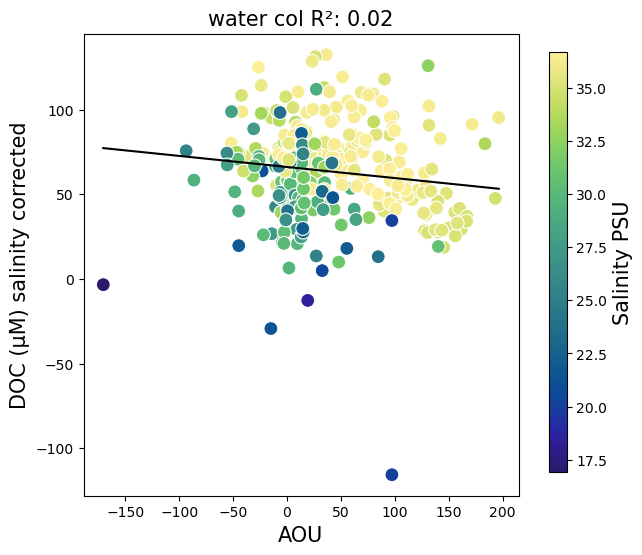

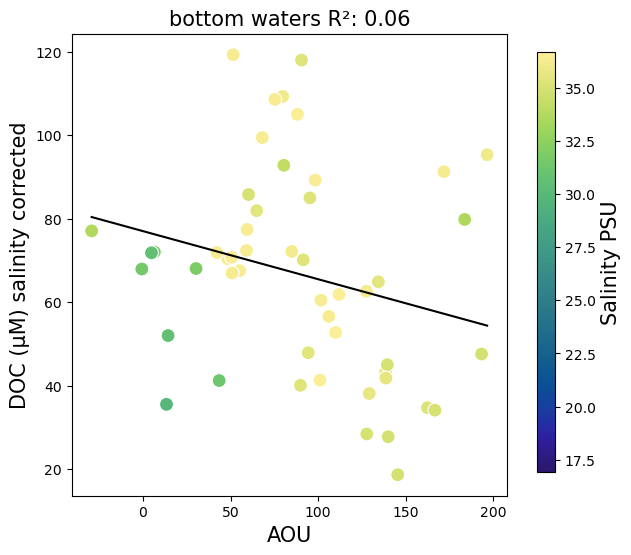

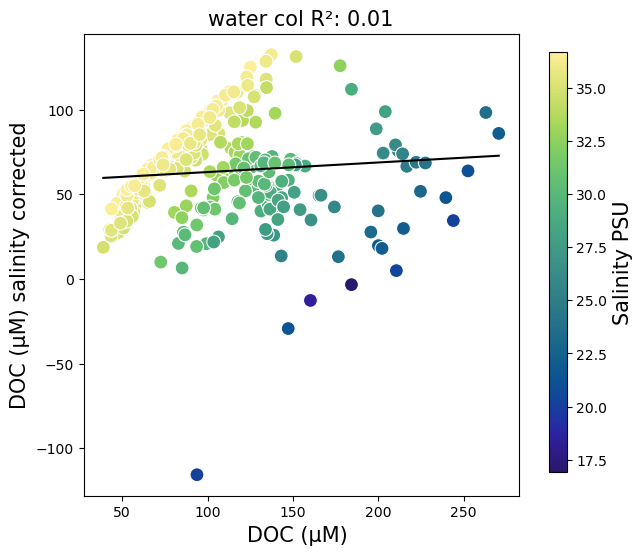

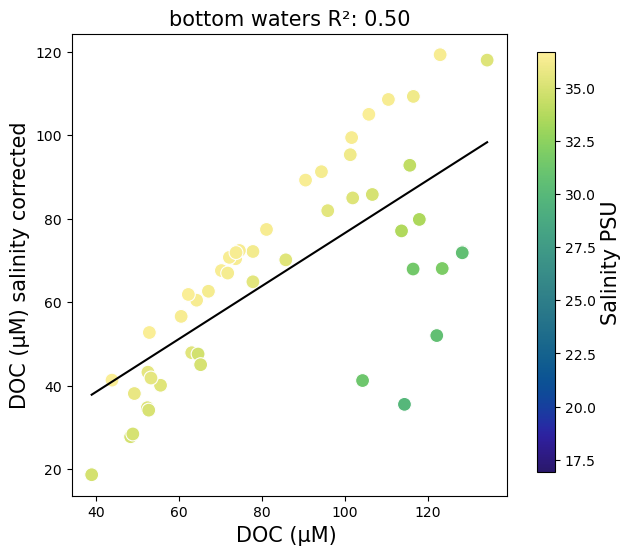

In [10]:


# Apply the calculation conditionally
def calculate_doc(row):
    #if row['rgn'] == 'Slope': 
    #    return row['NPOC_uM'] 
    if row['Campaign'] == 'GOM2021':
        return row['NPOC_uM'] + (slope_sum21 * (GOM2021['sal'].max() - row['sal']))
    elif row['Campaign'] == 'GOM21FA':
        return row['NPOC_uM'] + (slope_fal21 * (GOM21FA['sal'].max() - row['sal']))
    elif row['Campaign'] == 'GOM22SP':
        return row['NPOC_uM'] + (slope_spr22 * (GOM22SP['sal'].max() - row['sal']))
    elif row['Campaign'] == 'GOM22SU':
        return row['NPOC_uM'] + (slope_sum22 * (GOM22SU['sal'].max() - row['sal']))
    else:
        return row['NPOC_uM']

# Apply the function to calculate 'DOC_uM_sal_corrected'
data_wc_all['DOC_uM_sal_corrected'] = data_wc_all.apply(calculate_doc, axis=1)
data_wc_bbl['DOC_uM_sal_corrected'] = data_wc_bbl.apply(calculate_doc, axis=1)
data_wc['DOC_uM_sal_corrected'] = data_wc.apply(calculate_doc, axis=1)

x_var = 'aou'
y_var = 'DOC_uM_sal_corrected'

x_var_lab = 'AOU'
y_var_lab = 'DOC (µM) salinity corrected'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = "water col "
save_name = 'DOC_corrected_for_salinity_test1'
xyplotcolor(data_wc_all)

titel = "bottom waters "
save_name = 'DOC_corrected_for_salinity_test2'
xyplotcolor(data_wc_bbl)

x_var = 'NPOC_uM'
y_var = 'DOC_uM_sal_corrected'

x_var_lab = 'DOC (µM) '
y_var_lab = 'DOC (µM) salinity corrected'

z_var = 'sal'
z_var_lab = 'Salinity PSU'
z_var_color = cmo.haline

titel = "water col "
save_name = 'DOC_corrected_for_salinity_test3'
xyplotcolor(data_wc_all)

titel = "bottom waters "
save_name = 'DOC_corrected_for_salinity_test4'
xyplotcolor(data_wc_bbl)


## part 2 ##

LooK at DOC to AOU relationship in the water col to determin DOC consumption 

Water column DOC(salcorrected) to AOUceq 
Intercept (TLS): 93.92102266563987
Slope (TLS): -0.5387890790351823
R2 (TLS): 0.31654755316287664



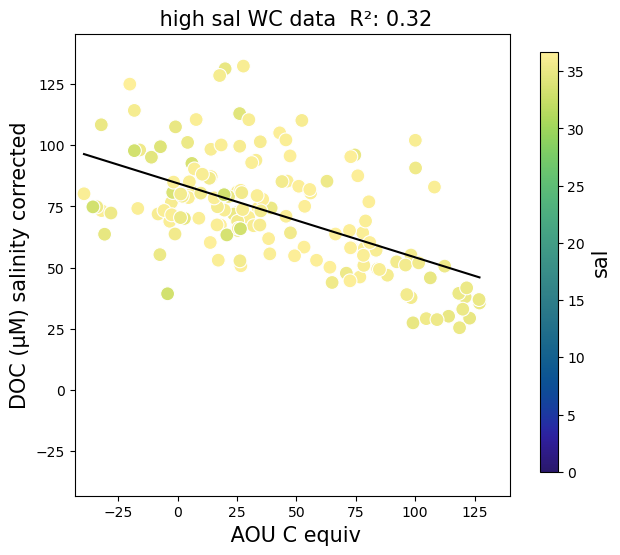

In [11]:
def tls_regression(x, y):
    # Add a column of ones to x to represent the intercept
    X = np.column_stack((np.ones(len(x)), x))

    # Compute the SVD of X
    U, s, Vt = np.linalg.svd(X, full_matrices=False)

    # Compute the pseudo-inverse of X
    X_inv = np.dot(Vt.T / s, U.T)

    # Compute the TLS regression coefficients
    beta_tls = np.dot(X_inv, y)

    return beta_tls

# Assuming you have your data x_var and y_var
data_wc_hsal = data_wc[data_wc['sal'] >= 33]
x_var = data_wc_hsal['aou_ceq']
y_var = data_wc_hsal['DOC_uM_sal_corrected']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls


from pylr2 import regress2
results = regress2(x_var, y_var, _method_type_2="reduced major axis")

results

print("Water column DOC(salcorrected) to AOUceq ")
print("Intercept (TLS):", results['intercept'])
print("Slope (TLS):", results['slope'])
print("R2 (TLS):", results['r']*results['r'])
print("")
Cal_slope = results['slope']


def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    axes.set_xlim(data[x_var].min()*1.1, data[x_var].max()*1.1)
    axes.set_ylim(data[x_var].min()*1.1, data[y_var].max()*1.1)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    #axes.axline(( 0,0), (150,150), linewidth=1, color='black')

    # Show the plot
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

x_var = 'aou_ceq'
y_var = 'DOC_uM_sal_corrected'

x_var_lab = ' AOU C equiv'
y_var_lab = 'DOC (µM) salinity corrected'

z_var = 'sal'
z_var_lab = 'sal'
z_var_color = cmo.haline

titel = " high sal WC data  "
#save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(data_wc_hsal)



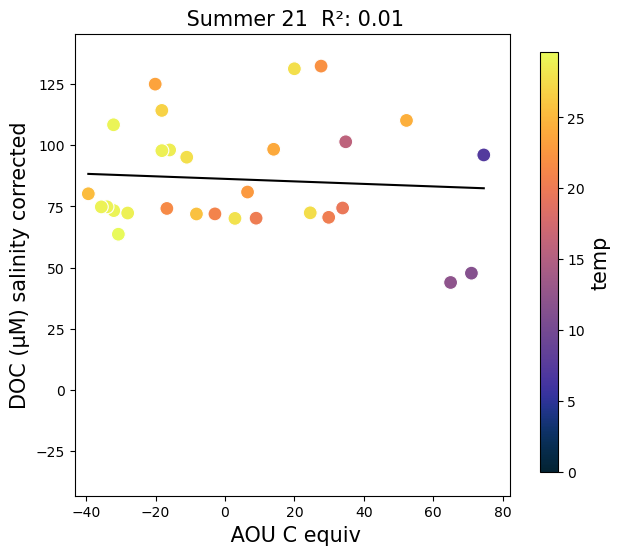

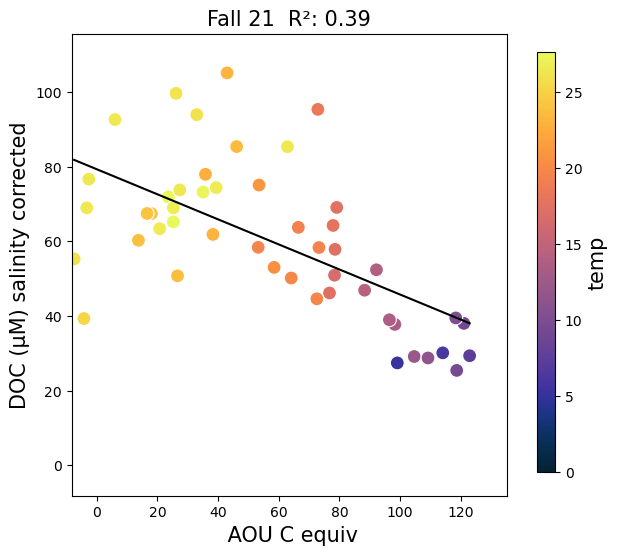

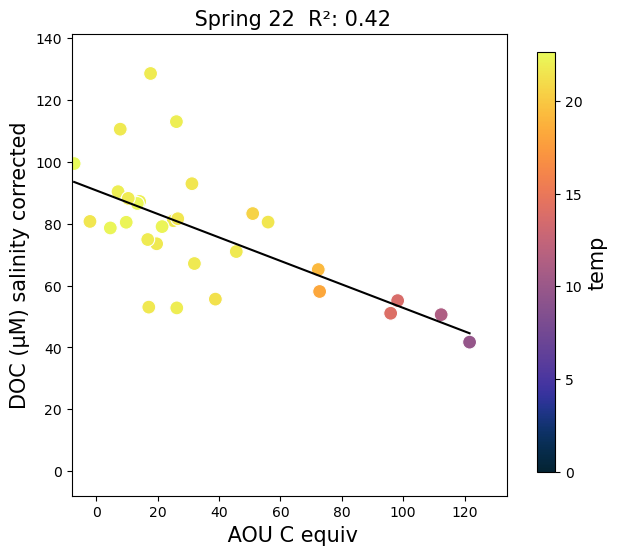

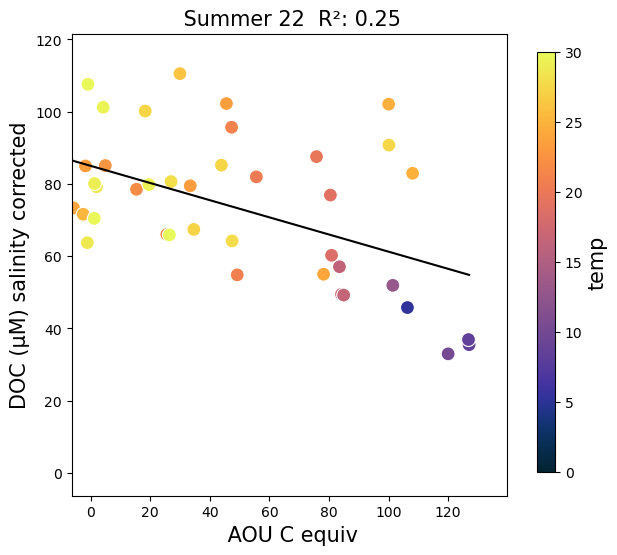

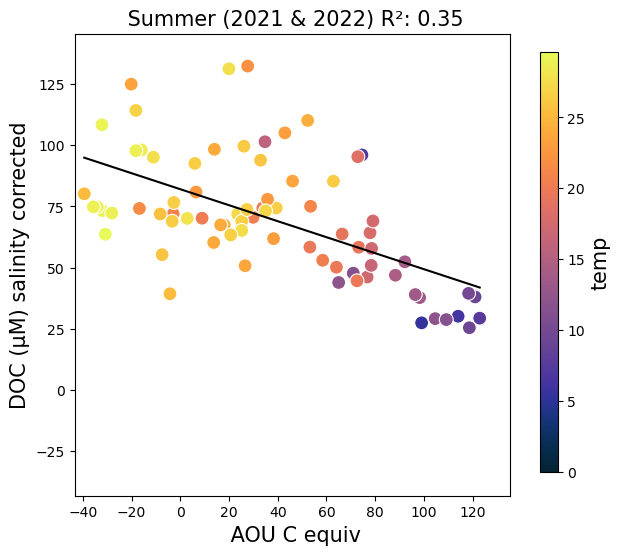

Water column Summer 21 DOC(salcorrected) to AOUceq 
Intercept (TLS): 88.92486097099734
Slope (TLS): -0.6730948803113107
R2 (TLS): 0.0058615811024658624

Water column Fall 21 DOC(salcorrected) to AOUceq 
Intercept (TLS): 90.9852423970368
Slope (TLS): -0.5410079479130242
R2 (TLS): 0.38548533730133366

Water column Spring DOC(salcorrected) to AOUceq 
Intercept (TLS): 98.2476170055207
Slope (TLS): -0.5873349860347984
R2 (TLS): 0.41795237977101984

Water column Summer 22 DOC(salcorrected) to AOUceq 
Intercept (TLS): 96.31085181510093
Slope (TLS): -0.47158933822679316
R2 (TLS): 0.25366430662036704

Water column Fall 21 and Summer DOC(salcorrected) to AOUceq 
Intercept (TLS): 90.57655600276144
Slope (TLS): -0.5565765590019448
R2 (TLS): 0.34582975081413153



In [12]:
GOM2021 = data_wc[data_wc['Campaign'] == 'GOM2021']
GOM21FA = data_wc[data_wc['Campaign'] == 'GOM21FA']
GOM22SP = data_wc[data_wc['Campaign'] == 'GOM22SP']
GOM22SU = data_wc[data_wc['Campaign'] == 'GOM22SU']
GOMSUMM = data_wc[data_wc['Campaign'].isin(['GOM21FA','GOM2021'])]


sal_cut_off_new = 33
temp_cutoff_new = 25

#use only data with low sal
GOM2021 = GOM2021[GOM2021['sal'] >= sal_cut_off_new]
GOM21FA = GOM21FA[GOM21FA['sal'] >= sal_cut_off_new]
GOM22SP = GOM22SP[GOM22SP['sal'] >= sal_cut_off_new]
GOM22SU = GOM22SU[GOM22SU['sal'] >= sal_cut_off_new]
GOMSUMM = GOMSUMM[GOMSUMM['sal'] >= sal_cut_off_new]


#GOM2021 = GOM2021[GOM2021['temp'] <= temp_cutoff_new]
#GOM21FA = GOM21FA[GOM21FA['temp'] <= temp_cutoff_new]
#GOM22SP = GOM22SP[GOM22SP['temp'] <= temp_cutoff_new]
#GOM22SU = GOM22SU[GOM22SU['temp'] <= temp_cutoff_new]

x_var = 'aou_ceq'
y_var = 'DOC_uM_sal_corrected'

x_var_lab = ' AOU C equiv'
y_var_lab = 'DOC (µM) salinity corrected'

z_var = 'temp'
z_var_lab = 'temp'
z_var_color = cmo.thermal

titel = " Summer 21  "
#save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(GOM2021)

titel = "Fall 21  "
#save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(GOM21FA)

titel = " Spring 22  "
#save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(GOM22SP)

titel = " Summer 22  "
#save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(GOM22SU)

titel = " Summer (2021 & 2022) "
#save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(GOMSUMM)

# GOM2021
x_var = GOM2021['aou_ceq']
y_var = GOM2021['DOC_uM_sal_corrected']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls

from pylr2 import regress2
results = regress2(x_var, y_var, _method_type_2="reduced major axis")

print("Water column Summer 21 DOC(salcorrected) to AOUceq ")
print("Intercept (TLS):", results['intercept'])
print("Slope (TLS):", results['slope'])
print("R2 (TLS):", results['r']*results['r'])
print("")
Cal_slope_21SU = results['slope']

# GOM21FA
x_var = GOM21FA['aou_ceq']
y_var = GOM21FA['DOC_uM_sal_corrected']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls

from pylr2 import regress2
results = regress2(x_var, y_var, _method_type_2="reduced major axis")

print("Water column Fall 21 DOC(salcorrected) to AOUceq ")
print("Intercept (TLS):", results['intercept'])
print("Slope (TLS):", results['slope'])
print("R2 (TLS):", results['r']*results['r'])
print("")
Cal_slope_21FA = results['slope']

# GOM22SP
x_var = GOM22SP['aou_ceq']
y_var = GOM22SP['DOC_uM_sal_corrected']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls

results = regress2(x_var, y_var, _method_type_2="reduced major axis")

print("Water column Spring DOC(salcorrected) to AOUceq ")
print("Intercept (TLS):", results['intercept'])
print("Slope (TLS):", results['slope'])
print("R2 (TLS):", results['r']*results['r'])
print("")
Cal_slope_22SP = results['slope']

# GOM22SU
x_var = GOM22SU['aou_ceq']
y_var = GOM22SU['DOC_uM_sal_corrected']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls

results = regress2(x_var, y_var, _method_type_2="reduced major axis")

print("Water column Summer 22 DOC(salcorrected) to AOUceq ")
print("Intercept (TLS):", results['intercept'])
print("Slope (TLS):", results['slope'])
print("R2 (TLS):", results['r']*results['r'])
print("")
Cal_slope_22SU = results['slope']

# GOM SUMMER
x_var = GOMSUMM['aou_ceq']
y_var = GOMSUMM['DOC_uM_sal_corrected']

# Perform TLS regression
beta_tls = tls_regression(x_var, y_var)

# Print coefficients
intercept_tls, slope_tls = beta_tls

results = regress2(x_var, y_var, _method_type_2="reduced major axis")

print("Water column Fall 21 and Summer DOC(salcorrected) to AOUceq ")
print("Intercept (TLS):", results['intercept'])
print("Slope (TLS):", results['slope'])
print("R2 (TLS):", results['r']*results['r'])
print("")
Cal_slope_SUMM = results['slope']

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2387731238.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['aou_ceq_doc_diff'] = data_wc_bbl.apply(calculate_doc_dif, axis=1)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2387731238.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc['aou_ceq_doc_diff'] = data_wc.apply(calculate_doc_dif, axis=1)


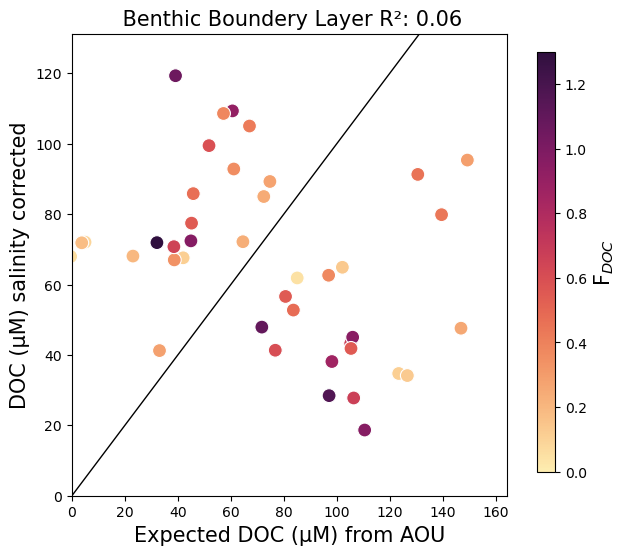

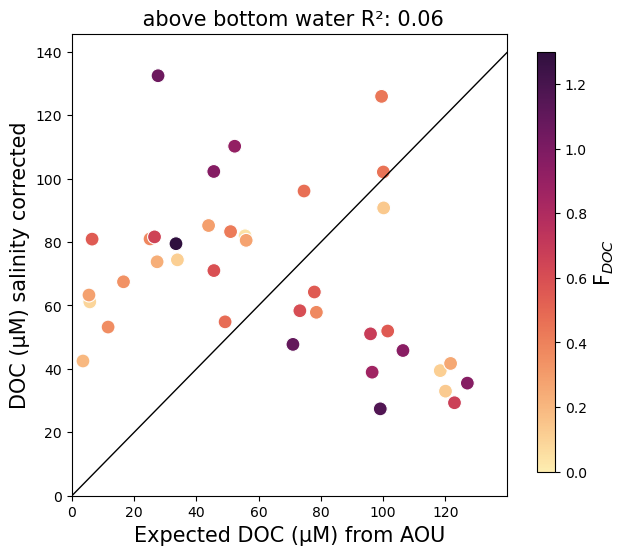

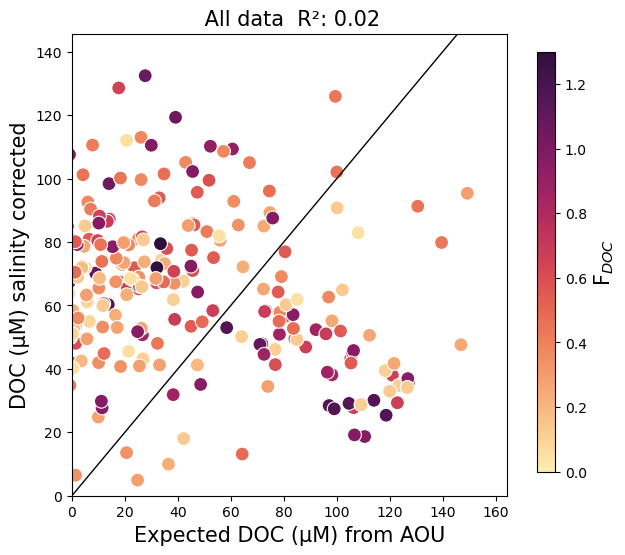

In [13]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel + f'R\u00B2: {score:.2f}', size = 15)

    axes.set_xlim(0, data[x_var].max()*1.1)
    axes.set_ylim(0, data[y_var].max()*1.1)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    axes.axline(( 0,0), (150,150), linewidth=1, color='black')

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


# Apply the calculation conditionally
def calculate_doc_dif(row):
    if row['Campaign'] == 'GOM2021':
        return row['DOC_uM_sal_corrected'] - (row['aou_ceq'] * ((Cal_slope*-1)))
    if row['Campaign'] == 'GOM21FA':
        return row['DOC_uM_sal_corrected'] - (row['aou_ceq'] * ((Cal_slope*-1)))
    elif row['Campaign'] == 'GOM22SP':
        return row['DOC_uM_sal_corrected'] - (row['aou_ceq'] * ((Cal_slope*-1)))
    elif row['Campaign'] == 'GOM22SU':
        return row['DOC_uM_sal_corrected'] - (row['aou_ceq'] * ((Cal_slope*-1)))
    else:
        return row['NPOC_uM']

# Apply the function to calculate 'DOC_uM_sal_corrected'
data_wc_all['aou_ceq_doc_diff'] = data_wc_all.apply(calculate_doc_dif, axis=1)
data_wc_bbl['aou_ceq_doc_diff'] = data_wc_bbl.apply(calculate_doc_dif, axis=1)
data_wc['aou_ceq_doc_diff'] = data_wc.apply(calculate_doc_dif, axis=1)

data_wc_deep = data_wc
data_wc_deep.index = data_wc_deep['percent_doc_resp']
idx_max = data_wc_deep.groupby('code.1')['Depth'].idxmax()
data_wc_deep = data_wc_deep.loc[idx_max]
data_wc_deep.index = data_wc_deep['code']

x_var = 'aou_ceq'
y_var = 'DOC_uM_sal_corrected'

x_var_lab = 'Expected DOC (µM) from AOU'
y_var_lab = 'DOC (µM) salinity corrected'

z_var = 'pw_flux_doc'
z_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " Benthic Boundery Layer "
save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_flux_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " above bottom water "
save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_flux_deepwaters'
xyplotcolor_flux_pred(data_wc_deep)

titel = " All data  "
save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(data_wc_all)



Intercept (TLS): 31.755493900134837
Slope (TLS): -10.354824927040212


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


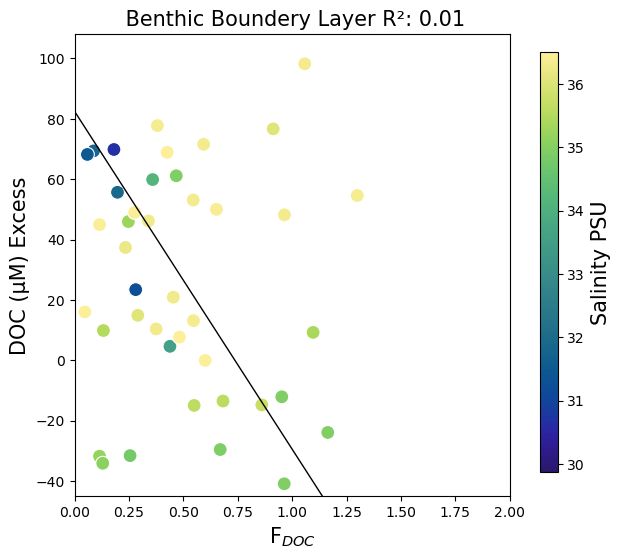

Intercept (TLS): 44.23094827020976
Slope (TLS): -14.71283584570778


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


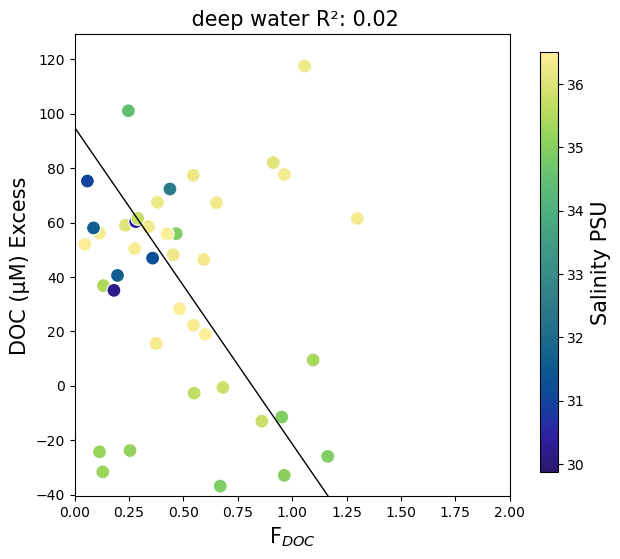

In [14]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data_wc_bbl[z_var].min()
    vmax = data_wc_bbl[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.1, data[y_var].max()*1.1)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()



y_var = 'aou_ceq_doc_diff'
z_var = 'sal'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = 'Salinity PSU'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.haline

titel = " Benthic Boundery Layer "
save_name = 'aou_ceq_doc_DOC_uM_sal_color_corrected_flux_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " deep water "
save_name = 'aou_ceq_doc_DOC_uM_sal_color_corrected_flux_deep_waters'
xyplotcolor_flux_pred(data_wc_deep)



Intercept (TLS): -19.407860402066685
Slope (TLS): 7.119833378053864


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


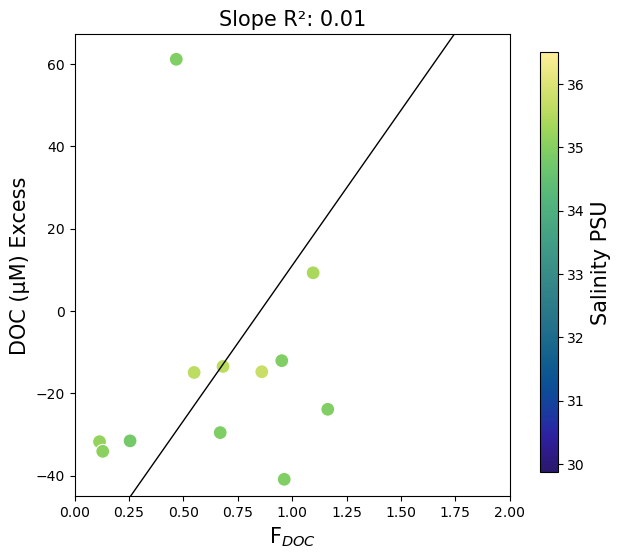

Intercept (TLS): 16.68441162458894
Slope (TLS): 48.437019984521385


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


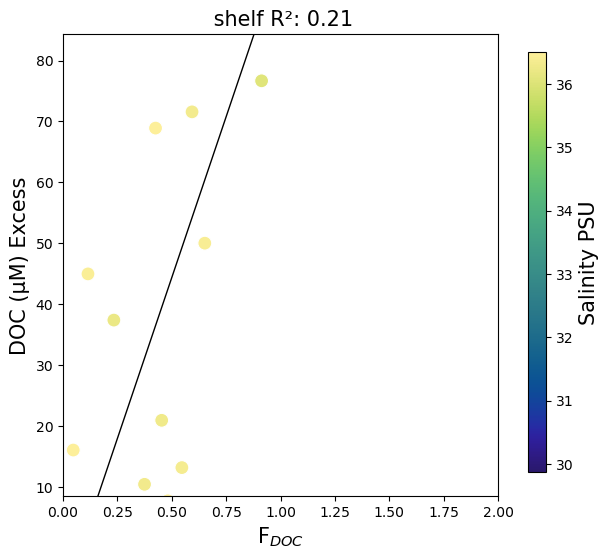

Intercept (TLS): 41.48001291349817
Slope (TLS): 17.430485032859032


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


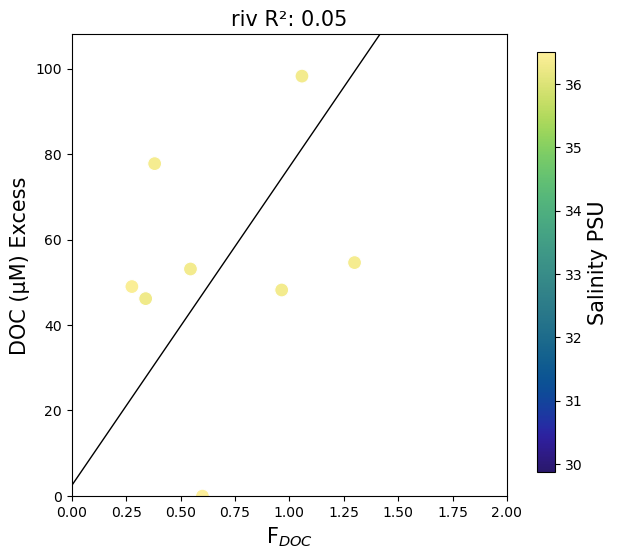

Intercept (TLS): 68.6691376363823
Slope (TLS): -116.69189603201167


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


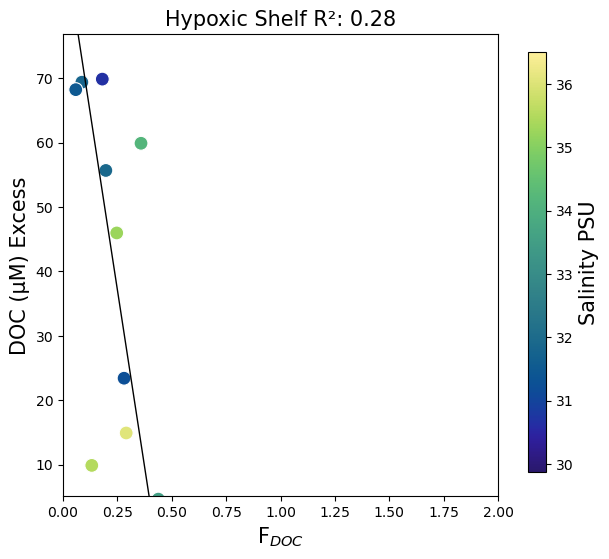

In [15]:

titel = "Slope "
save_name = 'aou_ceq_doc_DOC_uM_sal_color_corrected_flux_bbl_slope'
xyplotcolor_flux_pred( data_wc_bbl[data_wc_bbl['rgn'] == "Slope"])

titel = " shelf "
save_name = 'aou_ceq_doc_DOC_uM_sal_color_corrected_flux_DS'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['rgn'] == "Distal Shelf"])

titel = "riv "
save_name = 'aou_ceq_doc_DOC_uM_sal_color_corrected_flux_PS'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['rgn'] == "Proximal Shelf"])

titel = "Hypoxic Shelf "
save_name = 'aou_ceq_doc_DOC_uM_sal_color_corrected_flux_HS'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['rgn'] == "Hypoxic Shelf"])

In [16]:
data_wc_bbl.columns

# Calculate the maximum Depth for each group
max_depth_per_code = data_wc.groupby('code')['Depth'].transform('max')

# Compute the Depth_from_bot column
data_wc['Depth_from_bot'] =  100 - ( data_wc['Depth'] / max_depth_per_code * 100 ) 

data_wc['DOC_percent_ex'] = data_wc['aou_ceq_doc_diff'] / data_wc['NPOC_uM'] * 100
data_wc_bbl['DOC_percent_ex'] = data_wc_bbl['aou_ceq_doc_diff'] / data_wc_bbl['NPOC_uM'] * 100



C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3963880146.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc['Depth_from_bot'] =  100 - ( data_wc['Depth'] / max_depth_per_code * 100 )
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3963880146.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc['DOC_percent_ex'] = data_wc['aou_ceq_doc_diff'] / data_wc['NPOC_uM'] * 100
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3963880146.py:10: SettingWithCopyWarning: 
A value is trying to be set

In [17]:
data_wc_all.columns

Index(['code', 'code.2', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth',
       'Campaign', 'Location', 'Ts', 'density_kg_m3', 'density_kg_l',
       'ox_umol_kg', 'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'bc_flux_doc', 'ratio_stock_2_flux', 'aou_ceq', 'rgn',
       'DOC_uM_sal_corrected', 'aou_ceq_doc_diff'],
      dtype='object')

In [18]:
# Calculate the maximum Depth for each group
data_wc_all['code_1'] = data_wc_all['code']
max_depth_per_code = data_wc_all.groupby('code_1')['Depth'].transform('max')

# Compute the Depth_from_bot column
data_wc_all['Max_Depth'] =   max_depth_per_code  
data_wc_all['Depth_from_bot'] =  max_depth_per_code - data_wc_all['Depth'] 
data_wc_all['DOC_percent_ex'] = data_wc_all['aou_ceq_doc_diff'] / data_wc_all['NPOC_uM'] * 100


Intercept (TLS): 59.9542166319945
Slope (TLS): 0.270359125572175


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


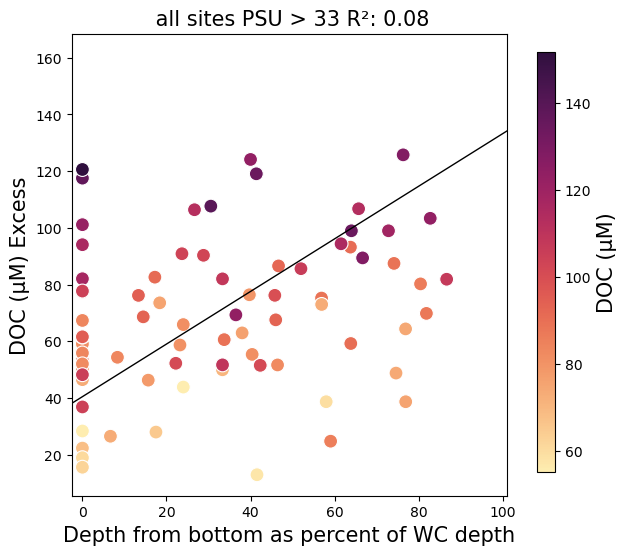

Intercept (TLS): 40.79973713169147
Slope (TLS): 0.22538996337911643


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


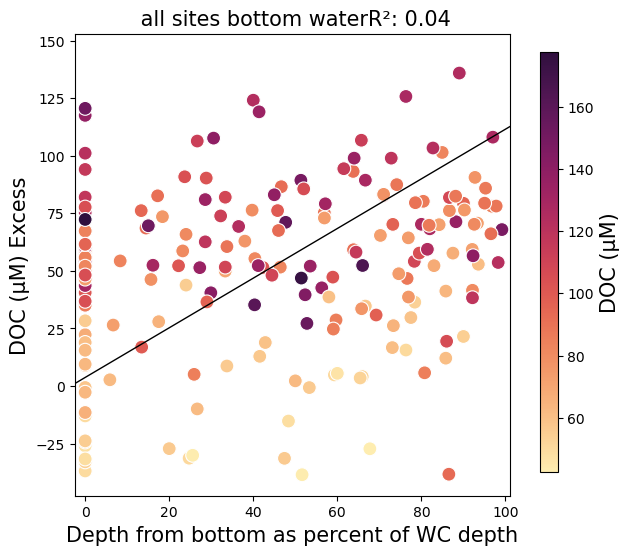

Intercept (TLS): 40.79973713169147
Slope (TLS): 0.22538996337911643


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


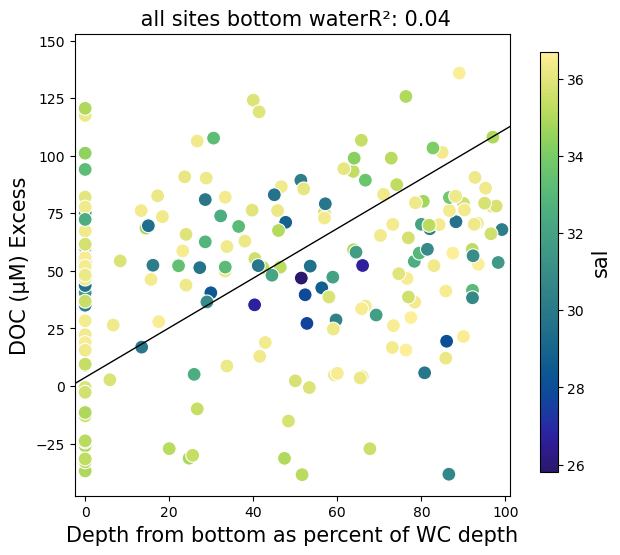

Intercept (TLS): 40.79973713169147
Slope (TLS): 0.22538996337911643


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


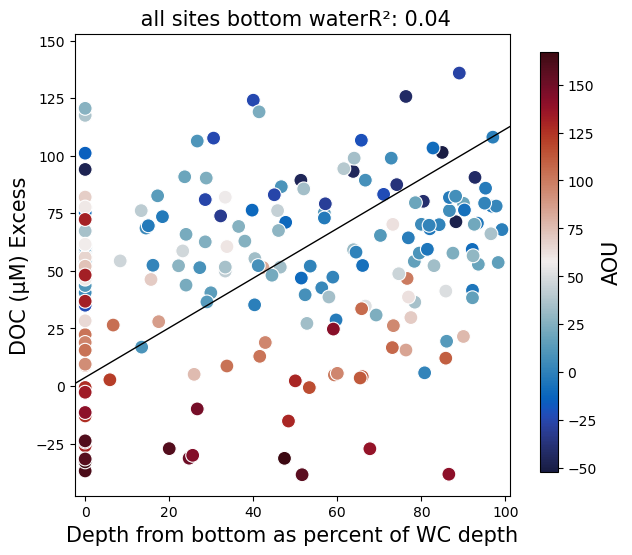

Intercept (TLS): 59.9542166319945
Slope (TLS): 0.270359125572175


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


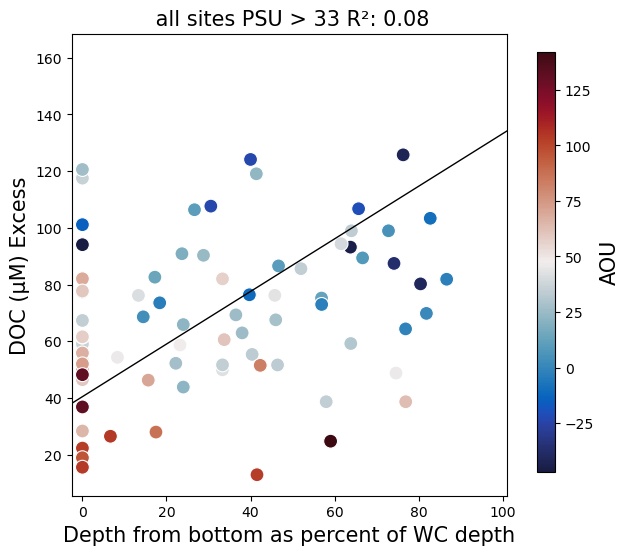

In [19]:


def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(-2.5, 101)
    #axes.set_ylim(data[y_var].min()*1.1, data[y_var].max()*1.1)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'aou_ceq_doc_diff'
z_var = 'NPOC_uM'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'DOC (µM)'

x_var = 'Depth_from_bot'
x_var_lab = 'Depth from bottom as percent of WC depth'
z_var_color = cmo.matter

titel = " all sites PSU > 33 "
save_name = 'aou_ceq_doc_DOC_depths_33_no_slpoe'
data_wc_33 = data_wc[data_wc['sal'] >= 33]
xyplotcolor_flux_pred(data_wc_33[data_wc_33['rgn'] != 'Slope'])

titel = " all sites bottom water"
save_name = 'aou_ceq_doc_DOC_depths'
xyplotcolor_flux_pred(data_wc)

y_var = 'aou_ceq_doc_diff'
z_var = 'sal'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'sal'

x_var = 'Depth_from_bot'
x_var_lab = 'Depth from bottom as percent of WC depth'
z_var_color = cmo.haline


titel = " all sites bottom water"
save_name = 'aou_ceq_doc_DOC_haline_33'
xyplotcolor_flux_pred(data_wc)

y_var = 'aou_ceq_doc_diff'
z_var = 'aou'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'AOU'

x_var = 'Depth_from_bot'
x_var_lab = 'Depth from bottom as percent of WC depth'
z_var_color = cmo.balance


titel = " all sites bottom water"
save_name = 'aou_sal_wc_and_bbl'
save_name = 'aou_ceq_doc_DOC_balance_33'

xyplotcolor_flux_pred(data_wc)

titel = " all sites PSU > 33 "
save_name = 'aou_ceq_doc_DOC_balance_33_no_slope'
data_wc_33 = data_wc[data_wc['sal'] >= 33]
xyplotcolor_flux_pred(data_wc_33[data_wc_33['rgn'] != 'Slope'])



Intercept (TLS): 55.88707608301037
Slope (TLS): 0.372977592922189


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


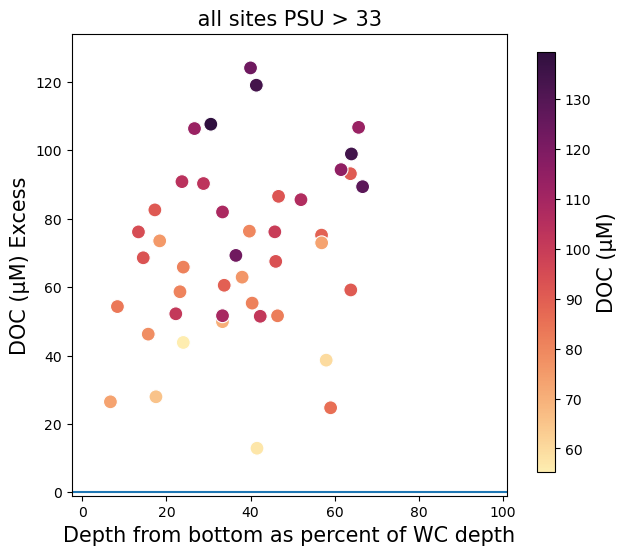

In [20]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(-2.5, 101)
    axes.set_ylim(-1, data[y_var].max() + 10)

    #axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.axhline(y = 0) 
    axes.set_title(titel, size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'aou_ceq_doc_diff'
z_var = 'NPOC_uM'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'DOC (µM)'

x_var = 'Depth_from_bot'
x_var_lab = 'Depth from bottom as percent of WC depth'
z_var_color = cmo.matter

titel = " all sites PSU > 33 "
save_name = 'aou_ceq_doc_DOC_balance_33_70_cutoff_depths'
data_wc_33 = data_wc[data_wc['sal'] >= 33]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] <= 70]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] != 0]
xyplotcolor_flux_pred(data_wc_33[data_wc_33['rgn'] != 'Slope'])



In [21]:
data_wc_bbl

,code,code.2,Press,ox,temp,sal,NPOC_uM,Depth,Campaign,Location,...,ratio_pw_flux_doc_2_cox,ratio_doc_2_fet,ratio_oc_2_fet,bc_flux_doc,ratio_stock_2_flux,aou_ceq,rgn,DOC_uM_sal_corrected,aou_ceq_doc_diff,DOC_percent_ex
code,,,,,,,,,,,,,,,,,,,,,
St.11_GOM2021,St.11_GOM2021,St.11_GOM2021,946.000,250.6848,5.1116,34.9340,106.625000,946.0,GOM2021,St.11,...,0.190211,39.698806,NaN,NaN,1.975973,45.822655,Slope,85.829762,61.141015,57.342101
St.13_GOM2021,St.13_GOM2021,St.13_GOM2021,321.519,178.8448,11.2036,35.3737,55.552083,322.0,GOM2021,St.13,...,NaN,NaN,NaN,NaN,NaN,68.338110,Slope,40.104331,3.284504,5.912476
St.14_GOM2021,St.14_GOM2021,St.14_GOM2021,89.886,173.2896,19.1130,36.4274,70.231250,89.9,GOM2021,St.14,...,5.921159,11.250685,NaN,NaN,2.972415,42.009194,Distal Shelf,67.598249,44.964153,64.023000
St.15_GOM2021,St.15_GOM2021,St.15_GOM2021,284.991,173.4112,11.3402,35.3970,63.075000,285.0,GOM2021,St.15,...,0.023557,10.626101,NaN,NaN,0.299164,71.720394,Slope,47.910615,9.268450,14.694332
St.16_GOM2021,St.16_GOM2021,St.16_GOM2021,61.486,170.6848,20.7133,36.3439,122.979167,61.5,GOM2021,St.16,...,0.025723,9.956452,NaN,NaN,0.525330,39.130717,Proximal Shelf,119.330666,98.247463,79.889518
St.2_GOM2021,St.2_GOM2021,St.2_GOM2021,62.185,161.7824,20.8984,36.3435,81.102083,62.2,GOM2021,St.2,...,0.130344,12.694059,NaN,NaN,0.801400,45.177670,Proximal Shelf,77.448718,53.107483,65.482267
St.4_GOM2021,St.4_GOM2021,St.4_GOM2021,16.695,105.8688,27.7194,35.3618,85.760417,16.7,GOM2021,St.4,...,NaN,0.000000,NaN,NaN,NaN,69.532404,Hypoxic Shelf,70.167940,32.704641,38.134890
St.5B_GOM2021,St.5B_GOM2021,St.5B_GOM2021,12.500,228.1792,28.7582,33.6376,113.666667,12.5,GOM2021,St.5B,...,NaN,0.000000,NaN,NaN,NaN,-22.226017,Hypoxic Shelf,77.105040,89.080175,78.369656
St.7_GOM2021,St.7_GOM2021,St.7_GOM2021,38.510,128.4736,24.3170,36.0532,116.520833,38.5,GOM2021,St.7,...,0.036885,31.862517,NaN,NaN,0.657949,60.616909,Distal Shelf,109.336935,76.677206,65.805577


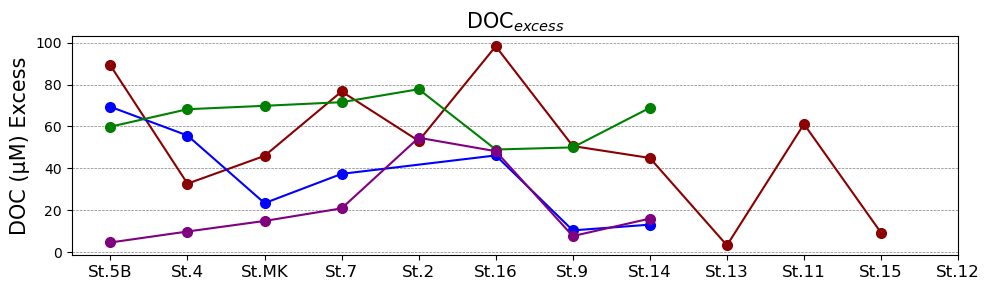

In [22]:
categories = ['St.5B', 'St.4', 'St.MK', 'St.7', 'St.2', 'St.16', 'St.9', 'St.14', 'St.13', 'St.11', 'St.15', 'St.12']
subcategories = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

def line_plot_stock(data_f, flux_col, ylabels, title): 
    df = data_f.dropna(subset=[flux_col])
    df = df[df[flux_col] > 0 ]

    color_map = {
        'GOM2021': 'darkred',
        'GOM21FA': 'blue',
        'GOM22SP': 'green',
        'GOM22SU': 'purple'
    }

    label_map = {
        'GOM2021': 'Summer 2021',
        'GOM21FA': 'Fall 2021',
        'GOM22SP': 'Spring 2022',
        'GOM22SU': 'Summer 2022'
    }

    barWidth = 0  # Adjusted bar width for better spacing
    fig, ax = plt.subplots(figsize=(10, 3))

    # Adjusted r for spacing between groups
    r = np.arange(len(categories))  # x locations for the groups
    positions = [r + i * barWidth for i in range(len(subcategories))]

    for pos, subcat in zip(positions, subcategories):
        values = []
        x_ticks = []
        for idx, cat in enumerate(categories):
            value = df[(df['Location'] == cat) & (df['Campaign'] == subcat)][flux_col].values
            if len(value) > 0:
                values.append(value[0])
                x_ticks.append(idx)
            else:
                continue  # Skip if there is no value
        
        # Plot only if there are values to plot
        if values:
            ax.plot(np.array(x_ticks) + barWidth * (subcategories.index(subcat) - len(subcategories)/2), values,
                    color=color_map[subcat], label=label_map[subcat], markersize=7, marker='o')

    #ax.set_ylim(-20, y_min_max_val)
    ax.set_ylabel(ylabels, size=15)
    ax.set_title(title, size=15)
    ax.set_xticks(r)  # Use the positions where data was actually plotted
    ax.set_xticklabels([cat for cat in categories], size=12)
    ax.grid(True, axis='y', color='gray', linestyle='--', linewidth=0.5)  # Customizes color, style, and width
    ax.legend().remove()

    fig.set_facecolor('w')
    plt.tight_layout()

    plt.savefig(f'../Dissertation_projects/Figures/Flux_figures/{save_name}.png')

    plt.show()

# Define the parameters

y_min_max_val = 120

ylabes = r'DOC (µM) Excess'
tlabes = r'DOC$_{excess}$' 
data_f = data_wc_bbl
flux_col = "aou_ceq_doc_diff"
save_name = 'pw_doc_excess_ind_line_plot'

line_plot_stock(data_f, flux_col, ylabes, tlabes)


Intercept (TLS): 11.135196443733058
Slope (TLS): 0.2910245397889566
Intercept (reduced M A): -21.19486210123169
Slope (reduced M A): 1.3048004314418333


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


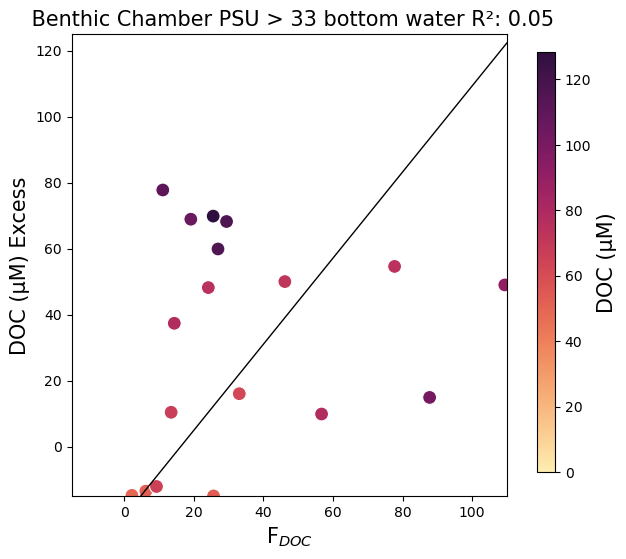

Intercept (TLS): 5.314533188952998
Slope (TLS): 0.31674014439145975
Intercept (reduced M A): -23.12328342849793
Slope (reduced M A): 1.1964016087798648


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


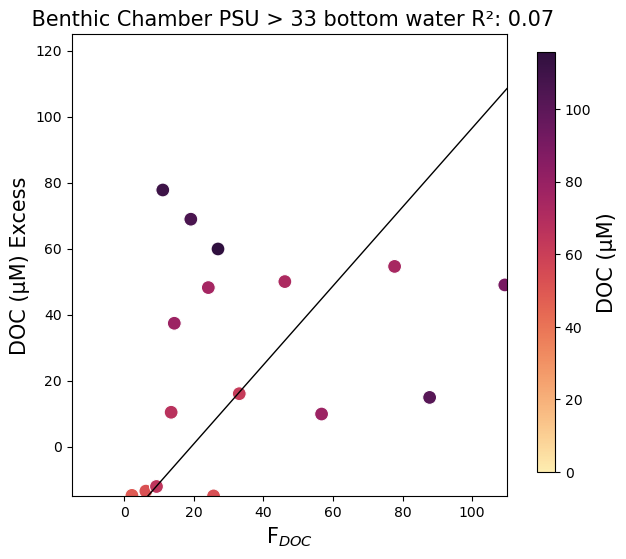

Intercept (TLS): 47.25513501910015
Slope (TLS): -0.134638032109968
Intercept (reduced M A): 72.57146755088556
Slope (reduced M A): -0.7184539094514901


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


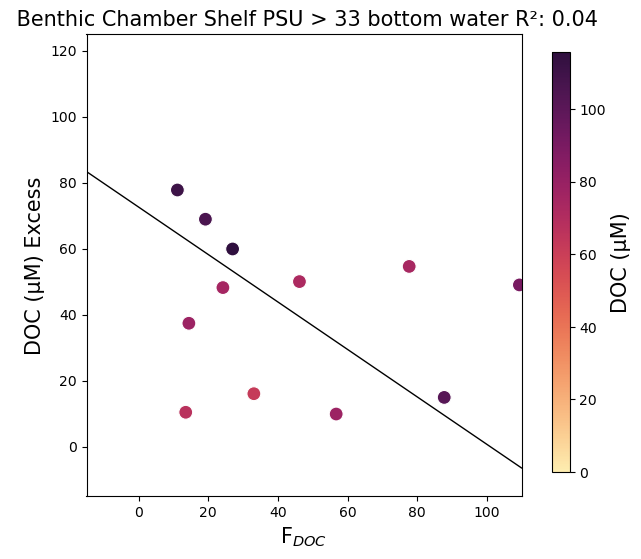

In [23]:
def xyplotcolor_flux_pred_bc(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    print("Intercept (reduced M A):", intercept)
    print("Slope (reduced M A):", slope)
    
    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(-15, 110)
    axes.set_ylim(-15, 125)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'aou_ceq_doc_diff'
z_var = 'NPOC_uM'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'DOC (µM)'

x_var = 'bc_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " Benthic Chamber PSU > 33 bottom water "
save_name = 'aou_ceq_doc_DOC_BC_flux'
xyplotcolor_flux_pred_bc(data_wc_bbl)


titel = " Benthic Chamber PSU > 33 bottom water "
save_name = 'aou_ceq_doc_DOC_BC_flux_33'
xyplotcolor_flux_pred_bc(data_wc_bbl[data_wc_bbl['sal'] >= 33])

titel = " Benthic Chamber Shelf PSU > 33 bottom water "
save_name = 'aou_ceq_doc_DOC_BC_flux_no_slope_33'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred_bc(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

Intercept (TLS): 0.5232924367934327
Slope (TLS): -0.0006043850078213673
Intercept (reduced M A): 0.9087094357365935
Slope (reduced M A): -0.012689932617280693


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


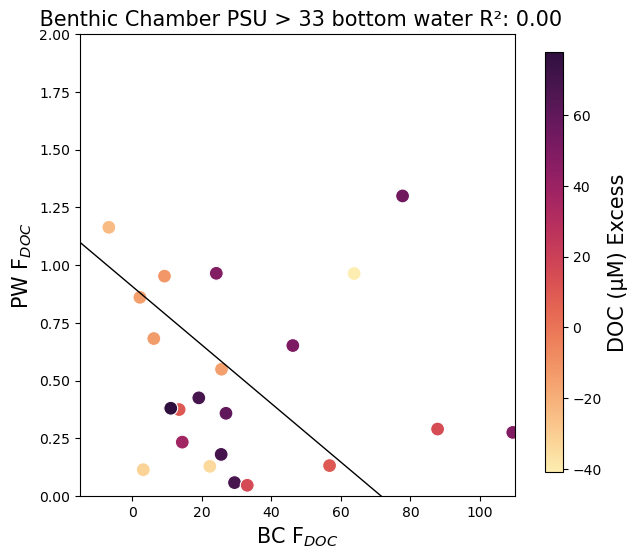

In [24]:
def xyplotcolor_flux_pred_bc(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    print("Intercept (reduced M A):", intercept)
    print("Slope (reduced M A):", slope)
    
    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(-15, 110)
    axes.set_ylim(0, 2)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

z_var = 'aou_ceq_doc_diff'
y_var = 'pw_flux_doc'

z_var_lab = r'DOC (µM) Excess'
y_var_lab = 'PW F$_{DOC}$'

x_var = 'bc_flux_doc'
x_var_lab = 'BC F$_{DOC}$'
z_var_color = cmo.matter

titel = " Benthic Chamber PSU > 33 bottom water "
save_name = 'aou_ceq_doc_DOC_BC_flux_33'
xyplotcolor_flux_pred_bc(data_wc_bbl)


Intercept (TLS): 22.352689868886863
Slope (TLS): 37.70983021320683
Intercept (reduced M A): -2.4934614129001886
Slope (reduced M A): 88.39749599415049


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


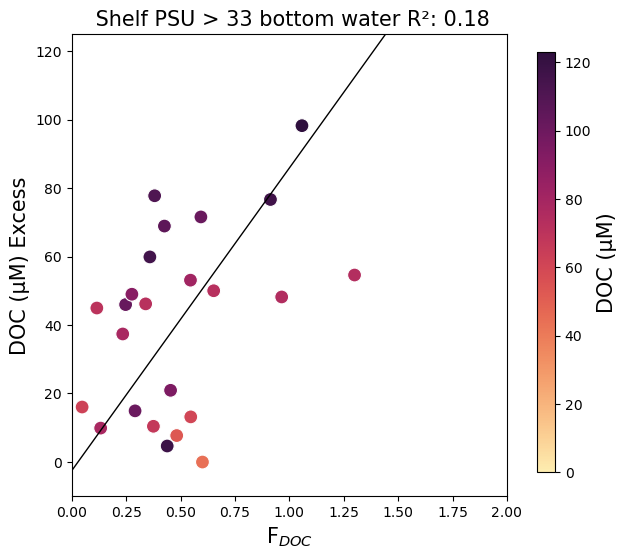

Intercept (TLS): 42.849402212354036
Slope (TLS): 57.97498895335139
Intercept (reduced M A): 17.723899992759677
Slope (reduced M A): 111.75706321456308


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


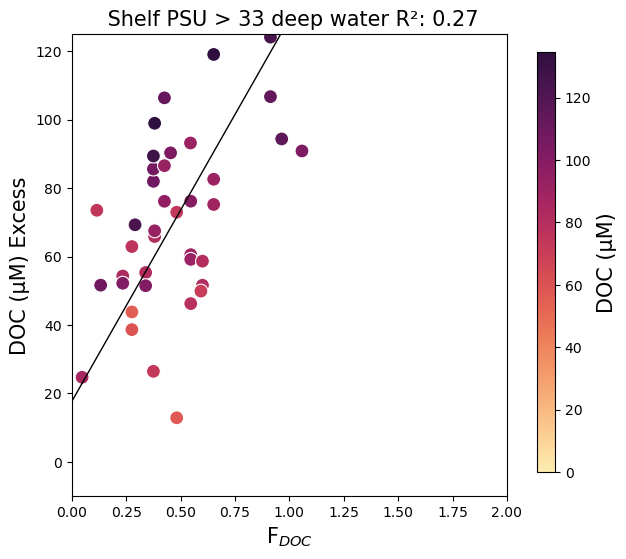

In [25]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    print("Intercept (reduced M A):", intercept)
    print("Slope (reduced M A):", slope)
    
    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 2)
    axes.set_ylim(-10, 125)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'aou_ceq_doc_diff'
z_var = 'NPOC_uM'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " Shelf PSU > 33 bottom water "
save_name = 'aou_ceq_doc_DOC_flux_no_slope_33'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

titel = " Shelf PSU > 33 deep water "
save_name = 'aou_ceq_doc_DOC_flux_no_slope_33_70_cutoff_depth'
data_wc_33 = data_wc[data_wc['sal'] >= 33]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] <= 70]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] != 0]
xyplotcolor_flux_pred(data_wc_33[data_wc_33['rgn'] != 'Slope'])

Intercept (TLS): 27.708951240436015
Slope (TLS): 35.57412509580366
Intercept (reduced M A): 4.048506435966246
Slope (reduced M A): 83.84287726091445


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


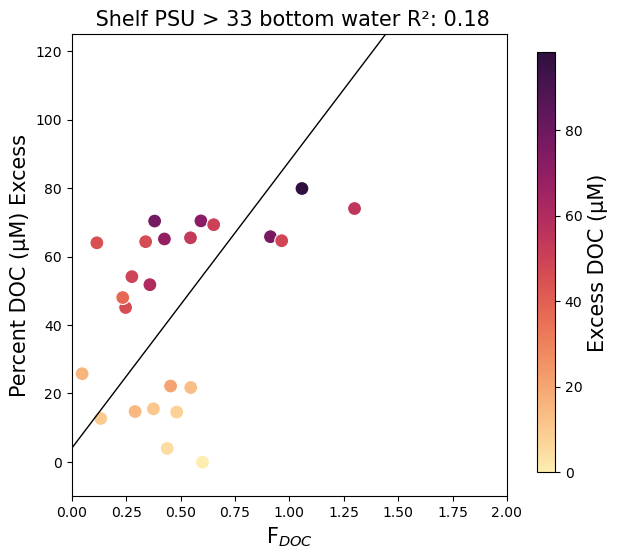

Intercept (TLS): 56.14072894556078
Slope (TLS): 36.996783230293985
Intercept (reduced M A): 33.595075560259694
Slope (reduced M A): 85.25659487657352


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


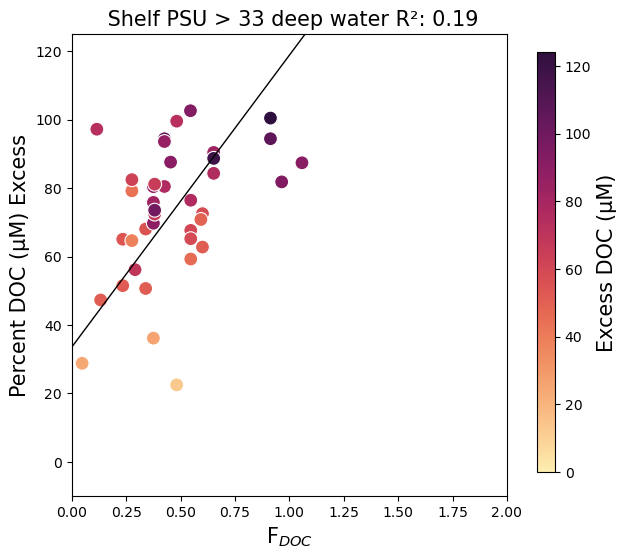

In [26]:
y_var = 'DOC_percent_ex'
z_var = 'aou_ceq_doc_diff'

y_var_lab = r'Percent DOC (µM) Excess'
z_var_lab = r'Excess DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " Shelf PSU > 33 bottom water "
save_name = 'aou_ceq_doc_DOC_percent_flux_no_slope_33_70_cutoff_depth_bottom_water'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

titel = " Shelf PSU > 33 deep water "
save_name = 'aou_ceq_doc_DOC_percent_flux_no_slope_33_70_cutoff_depth'
data_wc_33 = data_wc[data_wc['sal'] >= 33]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] <= 70]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] != 0]
xyplotcolor_flux_pred(data_wc_33[data_wc_33['rgn'] != 'Slope'])

Intercept (TLS): 56.14072894556078
Slope (TLS): 36.996783230293985
Intercept (reduced M A): 33.595075560259694
Slope (reduced M A): 85.25659487657352


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


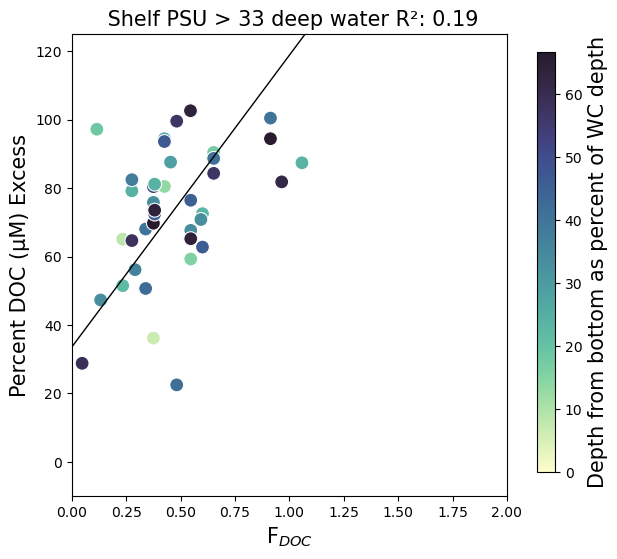

In [27]:

    
x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

y_var = 'DOC_percent_ex'
#y_var = 'aou_ceq_doc_diff'

y_var_lab = r'Percent DOC (µM) Excess'
#y_var_lab = r'Excess DOC (µM)'

z_var = 'Depth_from_bot'
z_var_lab = 'Depth from bottom as percent of WC depth'
z_var_color = cmo.deep

#titel = " Shelf PSU > 33 bottom water "
#save_name = 'aou_sal_wc_and_bbl'
#data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
#xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

titel = " Shelf PSU > 33 deep water "
save_name = 'aou_ceq_doc_DOC_percent_flux_no_slope_33_70_cutoff_depth_deep'
data_wc_33 = data_wc[data_wc['sal'] >= 33]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] <= 70]
data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] != 0]
xyplotcolor_flux_pred(data_wc_33[data_wc_33['rgn'] != 'Slope'])

In [28]:
df_ow = pd.read_csv('../Dissertation_projects/Data/TOC/TOC_GOM.csv', sep=',', index_col=0)
df_ow = df_ow[df_ow['Type'] == 'WC']
df_ow['code'] = df_ow['Location'] + '_' + df_ow['Campaign']

df_tn = df_ow.loc[df_ow.groupby('code')['Depth'].idxmax()]

df_tn.index = df_tn['code']

df_tot_nit = df_tn['TN_uM']
data_wc_bbl['TN_uM'] = df_tot_nit

df_tot_nit = df_tn['TN_uM_std']
data_wc_bbl['TN_uM_std'] = df_tot_nit

df_tot_nit = df_tn['NPOC_uM_std']
data_wc_bbl['NPOC_uM_std'] = df_tot_nit


data_wc_bbl

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3729201207.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['TN_uM'] = df_tot_nit
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3729201207.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['TN_uM_std'] = df_tot_nit
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3729201207.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

,code,code.2,Press,ox,temp,sal,NPOC_uM,Depth,Campaign,Location,...,bc_flux_doc,ratio_stock_2_flux,aou_ceq,rgn,DOC_uM_sal_corrected,aou_ceq_doc_diff,DOC_percent_ex,TN_uM,TN_uM_std,NPOC_uM_std
code,,,,,,,,,,,,,,,,,,,,,
St.11_GOM2021,St.11_GOM2021,St.11_GOM2021,946.000,250.6848,5.1116,34.9340,106.625000,946.0,GOM2021,St.11,...,NaN,1.975973,45.822655,Slope,85.829762,61.141015,57.342101,35.850000,0.360412,0.888061
St.13_GOM2021,St.13_GOM2021,St.13_GOM2021,321.519,178.8448,11.2036,35.3737,55.552083,322.0,GOM2021,St.13,...,NaN,NaN,68.338110,Slope,40.104331,3.284504,5.912476,25.142857,1.502761,0.360702
St.14_GOM2021,St.14_GOM2021,St.14_GOM2021,89.886,173.2896,19.1130,36.4274,70.231250,89.9,GOM2021,St.14,...,NaN,2.972415,42.009194,Distal Shelf,67.598249,44.964153,64.023000,12.807143,0.474618,2.001593
St.15_GOM2021,St.15_GOM2021,St.15_GOM2021,284.991,173.4112,11.3402,35.3970,63.075000,285.0,GOM2021,St.15,...,NaN,0.299164,71.720394,Slope,47.910615,9.268450,14.694332,24.575000,1.468821,0.402426
St.16_GOM2021,St.16_GOM2021,St.16_GOM2021,61.486,170.6848,20.7133,36.3439,122.979167,61.5,GOM2021,St.16,...,NaN,0.525330,39.130717,Proximal Shelf,119.330666,98.247463,79.889518,15.982143,0.955235,0.764801
St.2_GOM2021,St.2_GOM2021,St.2_GOM2021,62.185,161.7824,20.8984,36.3435,81.102083,62.2,GOM2021,St.2,...,NaN,0.801400,45.177670,Proximal Shelf,77.448718,53.107483,65.482267,9.996429,0.597475,0.527378
St.4_GOM2021,St.4_GOM2021,St.4_GOM2021,16.695,105.8688,27.7194,35.3618,85.760417,16.7,GOM2021,St.4,...,NaN,NaN,69.532404,Hypoxic Shelf,70.167940,32.704641,38.134890,19.178571,0.710735,2.669198
St.5B_GOM2021,St.5B_GOM2021,St.5B_GOM2021,12.500,228.1792,28.7582,33.6376,113.666667,12.5,GOM2021,St.5B,...,NaN,NaN,-22.226017,Hypoxic Shelf,77.105040,89.080175,78.369656,0.207143,0.007676,3.334358
St.7_GOM2021,St.7_GOM2021,St.7_GOM2021,38.510,128.4736,24.3170,36.0532,116.520833,38.5,GOM2021,St.7,...,NaN,0.657949,60.616909,Distal Shelf,109.336935,76.677206,65.805577,20.032143,0.201390,0.914043


In [29]:
data_wc_bbl['DOC:TDN'] =  data_wc_bbl['NPOC_uM'] / data_wc_bbl['TN_uM'] 
data_wc_bbl['DOC:TDN_err'] = (data_wc_bbl['NPOC_uM_std'] / data_wc_bbl['NPOC_uM'] )+( data_wc_bbl['TN_uM_std'] / data_wc_bbl['TN_uM'] )

data_wc_bbl

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\982936293.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['DOC:TDN'] =  data_wc_bbl['NPOC_uM'] / data_wc_bbl['TN_uM']
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\982936293.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['DOC:TDN_err'] = (data_wc_bbl['NPOC_uM_std'] / data_wc_bbl['NPOC_uM'] )+( data_wc_bbl['TN_uM_std'] / data_wc_bbl['TN_uM'] )


,code,code.2,Press,ox,temp,sal,NPOC_uM,Depth,Campaign,Location,...,aou_ceq,rgn,DOC_uM_sal_corrected,aou_ceq_doc_diff,DOC_percent_ex,TN_uM,TN_uM_std,NPOC_uM_std,DOC:TDN,DOC:TDN_err
code,,,,,,,,,,,,,,,,,,,,,
St.11_GOM2021,St.11_GOM2021,St.11_GOM2021,946.000,250.6848,5.1116,34.9340,106.625000,946.0,GOM2021,St.11,...,45.822655,Slope,85.829762,61.141015,57.342101,35.850000,0.360412,0.888061,2.974198,0.018382
St.13_GOM2021,St.13_GOM2021,St.13_GOM2021,321.519,178.8448,11.2036,35.3737,55.552083,322.0,GOM2021,St.13,...,68.338110,Slope,40.104331,3.284504,5.912476,25.142857,1.502761,0.360702,2.209458,0.066262
St.14_GOM2021,St.14_GOM2021,St.14_GOM2021,89.886,173.2896,19.1130,36.4274,70.231250,89.9,GOM2021,St.14,...,42.009194,Distal Shelf,67.598249,44.964153,64.023000,12.807143,0.474618,2.001593,5.483756,0.065559
St.15_GOM2021,St.15_GOM2021,St.15_GOM2021,284.991,173.4112,11.3402,35.3970,63.075000,285.0,GOM2021,St.15,...,71.720394,Slope,47.910615,9.268450,14.694332,24.575000,1.468821,0.402426,2.566633,0.066149
St.16_GOM2021,St.16_GOM2021,St.16_GOM2021,61.486,170.6848,20.7133,36.3439,122.979167,61.5,GOM2021,St.16,...,39.130717,Proximal Shelf,119.330666,98.247463,79.889518,15.982143,0.955235,0.764801,7.694786,0.065988
St.2_GOM2021,St.2_GOM2021,St.2_GOM2021,62.185,161.7824,20.8984,36.3435,81.102083,62.2,GOM2021,St.2,...,45.177670,Proximal Shelf,77.448718,53.107483,65.482267,9.996429,0.597475,0.527378,8.113106,0.066272
St.4_GOM2021,St.4_GOM2021,St.4_GOM2021,16.695,105.8688,27.7194,35.3618,85.760417,16.7,GOM2021,St.4,...,69.532404,Hypoxic Shelf,70.167940,32.704641,38.134890,19.178571,0.710735,2.669198,4.471679,0.068183
St.5B_GOM2021,St.5B_GOM2021,St.5B_GOM2021,12.500,228.1792,28.7582,33.6376,113.666667,12.5,GOM2021,St.5B,...,-22.226017,Hypoxic Shelf,77.105040,89.080175,78.369656,0.207143,0.007676,3.334358,548.735632,0.066393
St.7_GOM2021,St.7_GOM2021,St.7_GOM2021,38.510,128.4736,24.3170,36.0532,116.520833,38.5,GOM2021,St.7,...,60.616909,Distal Shelf,109.336935,76.677206,65.805577,20.032143,0.201390,0.914043,5.816693,0.017898


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3366640412.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_33['Mid_Depth'] = data_wc_33['Max_Depth']/2
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


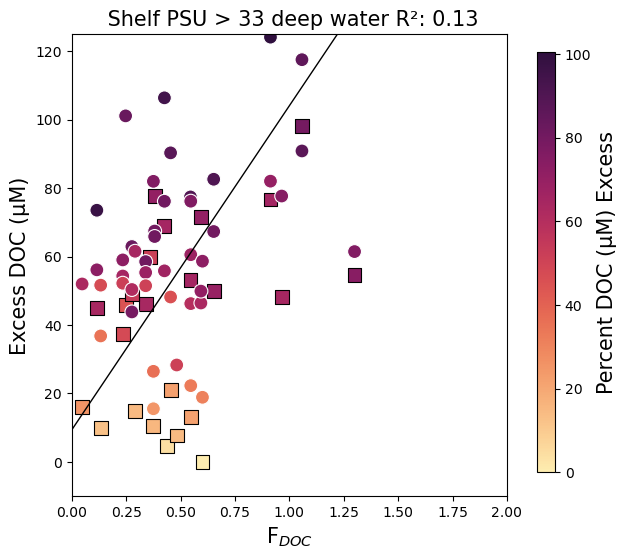

In [30]:
marker_map = {
    'BBL': 's',
    'water_col': 'o',
    'Surface': 'd'
}

edg_map = {
    'BBL': 'black',
    'water_col': 'white',
    'Surface': 'red'
}

def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'group']]
    subrgn = data['group'].tolist()
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    for group in data['group'].unique():
        subset = data[data['group'] == group]
        colors = subset[z_var].astype(float)
        sns.scatterplot(x=x_var, y=y_var, 
                        c=colors, cmap=z_var_color,
                        s=100, data=subset, 
                        ax=axes, legend=False,
                        vmin=vmin, vmax=vmax, 
                        marker=marker_map.get(group, 'o'), 
                        edgecolor=edg_map.get(group, 'black')
                       )

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 2)
    axes.set_ylim(-10, 125)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

#y_var = 'DOC_percent_ex'
y_var = 'aou_ceq_doc_diff'

#y_var_lab = r'Percent DOC (µM) Excess'
y_var_lab = r'Excess DOC (µM)'

z_var = 'DOC_percent_ex'
z_var_lab = 'Percent DOC (µM) Excess'
z_var_color = cmo.matter

#titel = " Shelf PSU > 33 bottom water "
#save_name = 'aou_sal_wc_and_bbl'
#data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
#xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

titel = " Shelf PSU > 33 deep water "
save_name = 'doc_ex_flux_bbl_deep_halfcut'


data_wc_33 = data_wc_all[data_wc_all['sal'] >= 33]
#data_wc_33['bottom_layer_depth'] = bottom_layer_depth
#data_wc_33['bottom_layer_depth_subtraction'] = data_wc_33['Depth'] - data_wc_33['bottom_layer_depth'] 
#data_wc_33 = data_wc_33[data_wc_33['Depth'] >= 0]
data_wc_33['Mid_Depth'] = data_wc_33['Max_Depth']/2
data_wc_33 = data_wc_33[data_wc_33['Depth'] >= data_wc_33['Mid_Depth']]

#data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] != 0]


data_wc_33 = data_wc_33[data_wc_33['rgn'] != 'Slope']

sub = data_wc_33.dropna(subset=[x_var, y_var])
X = sub[[x_var]]
y = sub[[y_var]]
    
beta_tls = tls_regression(X, y)

# Print coefficients
intercept_tls, slope_tls = beta_tls
results = regress2(X, y, _method_type_2="reduced major axis")

intercept = results['intercept']
slope = results['slope']
r= results['r']


xyplotcolor_flux_pred(data_wc_33)

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3225996641.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_33['bottom_layer_depth'] = bottom_layer_depth
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3225996641.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_33['bottom_layer_depth_subtraction'] = data_wc_33['Depth'] - data_wc_33['bottom_layer_depth']
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum 

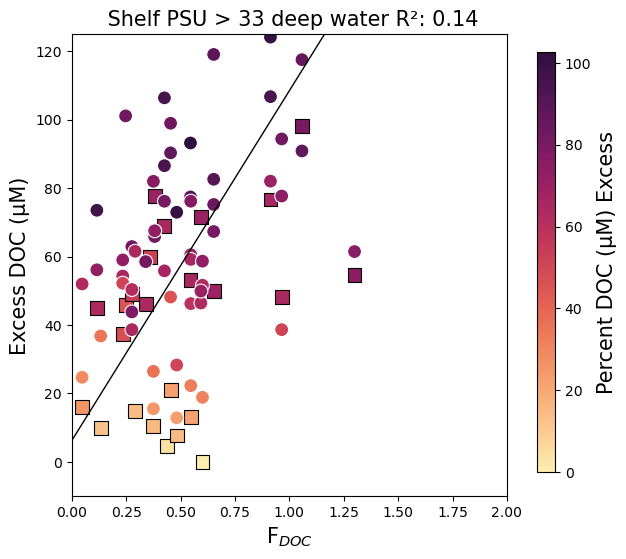

In [31]:
marker_map = {
    'BBL': 's',
    'water_col': 'o',
    'Surface': 'd'
}

edg_map = {
    'BBL': 'black',
    'water_col': 'white',
    'Surface': 'red'
}

def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'group']]
    subrgn = data['group'].tolist()
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    for group in data['group'].unique():
        subset = data[data['group'] == group]
        colors = subset[z_var].astype(float)
        sns.scatterplot(x=x_var, y=y_var, 
                        c=colors, cmap=z_var_color,
                        s=100, data=subset, 
                        ax=axes, legend=False,
                        vmin=vmin, vmax=vmax, 
                        marker=marker_map.get(group, 'o'), 
                        edgecolor=edg_map.get(group, 'black')
                       )

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 2)
    axes.set_ylim(-10, 125)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

#y_var = 'DOC_percent_ex'
y_var = 'aou_ceq_doc_diff'

#y_var_lab = r'Percent DOC (µM) Excess'
y_var_lab = r'Excess DOC (µM)'

z_var = 'DOC_percent_ex'
z_var_lab = 'Percent DOC (µM) Excess'
z_var_color = cmo.matter

titel = " Shelf PSU > 33 deep water "
save_name = 'doc_ex_flux_bbl_deep_sincut'

data_wc_33 = data_wc_all[data_wc_all['sal'] >= 33]
data_wc_33['bottom_layer_depth'] = bottom_layer_depth
data_wc_33['bottom_layer_depth_subtraction'] = data_wc_33['Depth'] - data_wc_33['bottom_layer_depth'] 
data_wc_33 = data_wc_33[data_wc_33['bottom_layer_depth_subtraction'] >= 0]

#data_wc_33 = data_wc_33[data_wc_33['Depth_from_bot'] != 0]

data_wc_33 = data_wc_33[data_wc_33['rgn'] != 'Slope']

sub = data_wc_33.dropna(subset=[x_var, y_var])
X = sub[[x_var]]
y = sub[[y_var]]
    
beta_tls = tls_regression(X, y)

# Print coefficients
intercept_tls, slope_tls = beta_tls
results = regress2(X, y, _method_type_2="reduced major axis")

intercept = results['intercept']
slope = results['slope']
r= results['r']


xyplotcolor_flux_pred(data_wc_33)

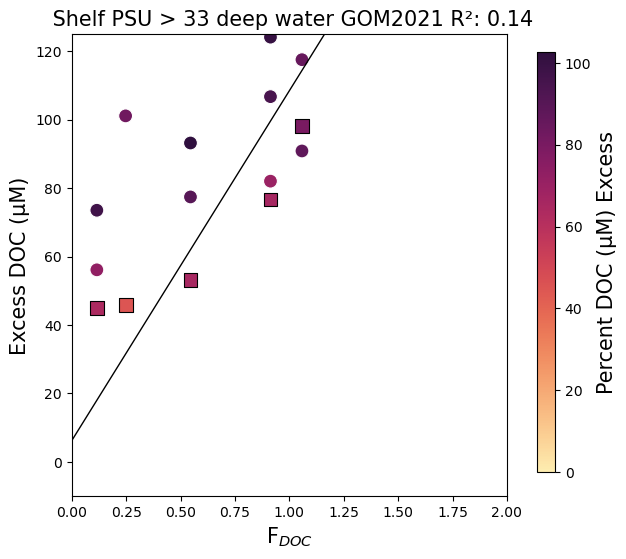

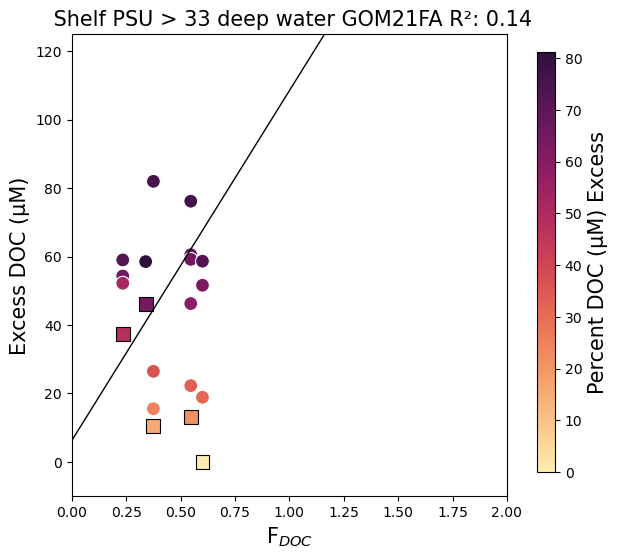

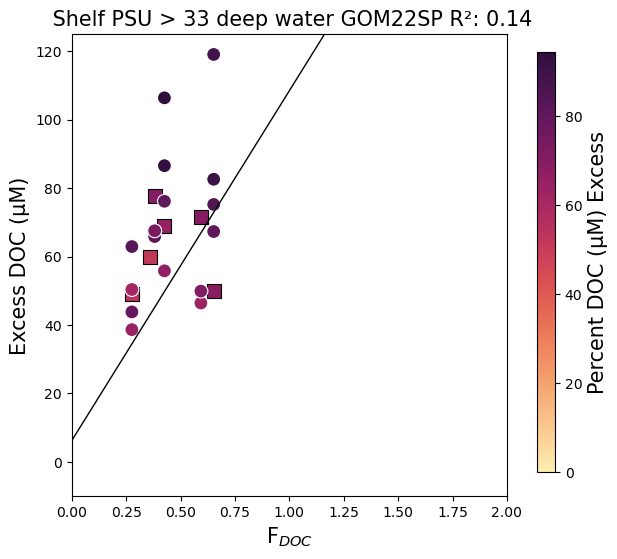

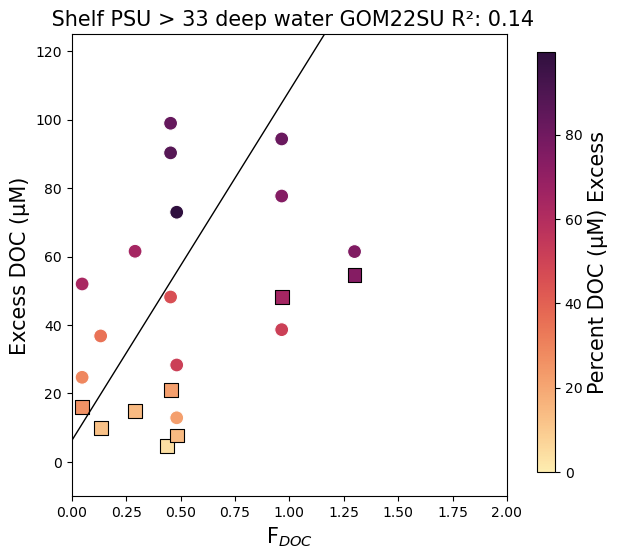

In [32]:
titel = " Shelf PSU > 33 deep water GOM2021 "
save_name = 'doc_ex_flux_bbl_deep_sincutGOM2021'
xyplotcolor_flux_pred(data_wc_33[data_wc_33['Campaign'] == 'GOM2021'])

titel = " Shelf PSU > 33 deep water GOM21FA "
save_name = 'doc_ex_flux_bbl_deep_sincutGOM21FA'
xyplotcolor_flux_pred(data_wc_33[data_wc_33['Campaign'] == 'GOM21FA'])

titel = " Shelf PSU > 33 deep water GOM22SP "
save_name = 'doc_ex_flux_bbl_deep_sincutGOM22SP'
xyplotcolor_flux_pred(data_wc_33[data_wc_33['Campaign'] == 'GOM22SP'])

titel = " Shelf PSU > 33 deep water GOM22SU "
save_name = 'doc_ex_flux_bbl_deep_sincutGOM22SU'
xyplotcolor_flux_pred(data_wc_33[data_wc_33['Campaign'] == 'GOM22SU'])

Intercept (TLS): 31.755493900134837
Slope (TLS): -10.354824927040212


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


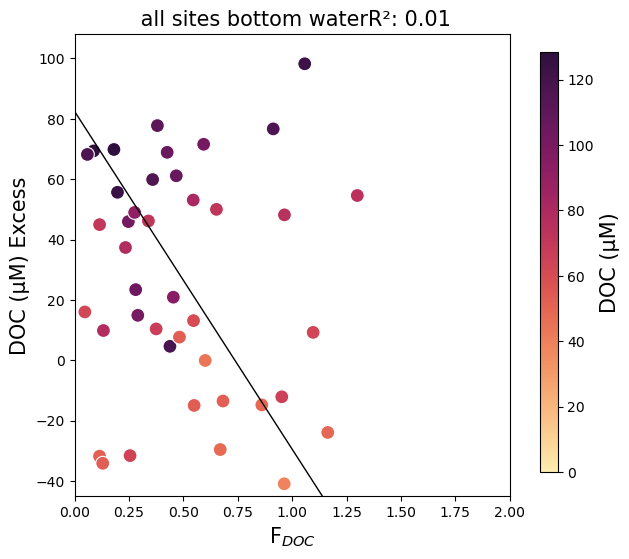

Intercept (TLS): 19.78120305049583
Slope (TLS): 4.644551823637441


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


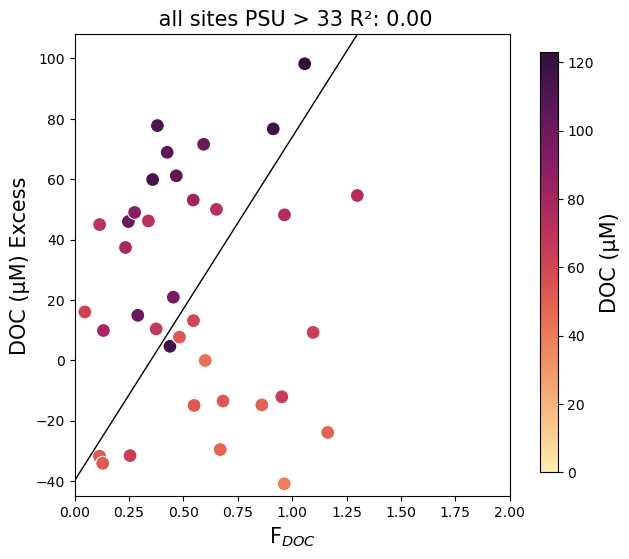

Intercept (TLS): 34.88754336828648
Slope (TLS): 20.28176441410012


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


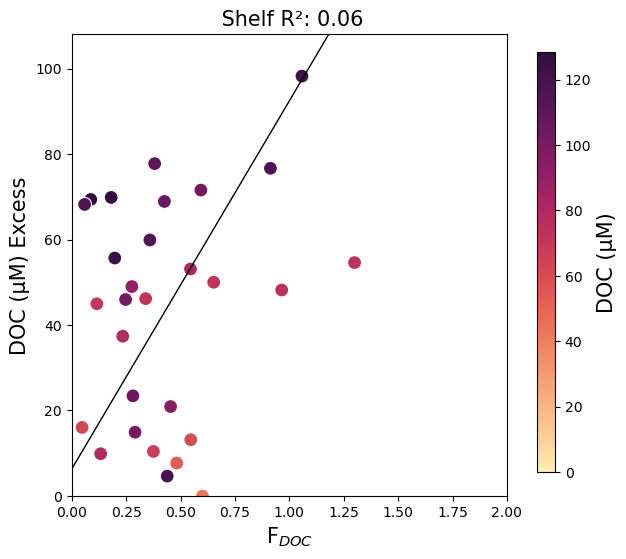

Intercept (TLS): 22.352689868886863
Slope (TLS): 37.70983021320683


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


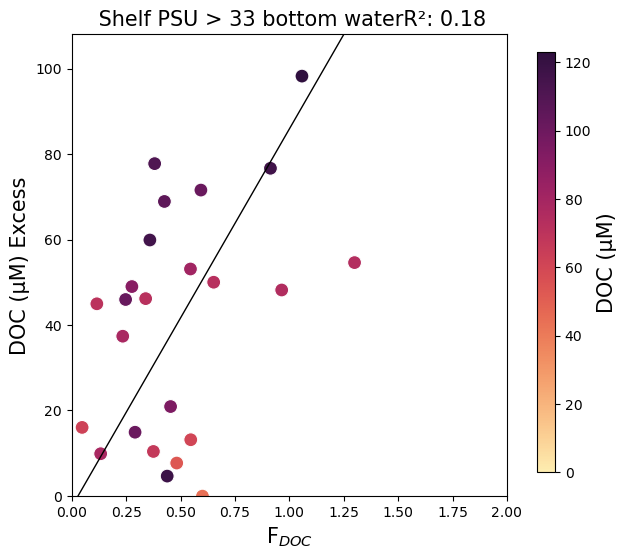

In [33]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.1, data[y_var].max()*1.1)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'aou_ceq_doc_diff'
z_var = 'NPOC_uM'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " all sites bottom water"
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " all sites PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['sal'] >= 33])

titel = " Shelf "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf)

titel = " Shelf PSU > 33 bottom water"
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

Intercept (TLS): 44.23094827020976
Slope (TLS): -14.71283584570778


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


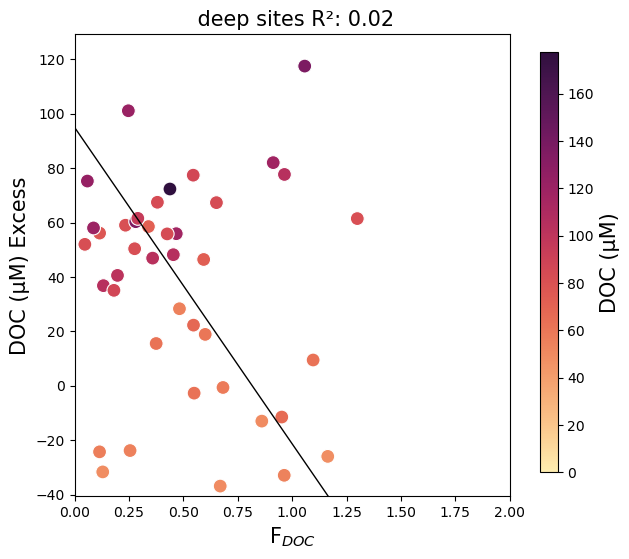

Intercept (TLS): 36.664204235206114
Slope (TLS): -6.50809200970371


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


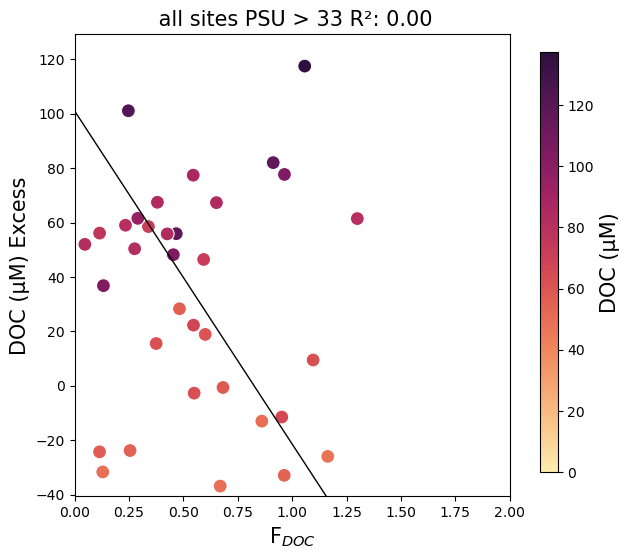

Intercept (TLS): 44.23094827020976
Slope (TLS): -14.71283584570778


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


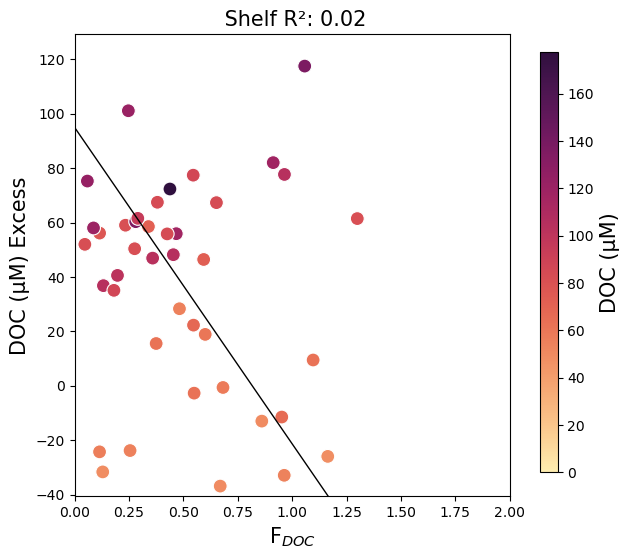

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3522658281.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_bbl_shelf = data_wc_bbl[data_wc_deep['rgn'] != "Slope"]
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): 36.664204235206114
Slope (TLS): -6.50809200970371


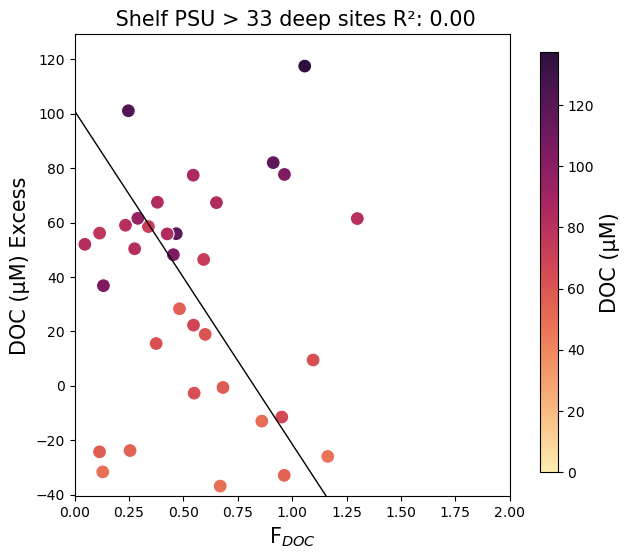

In [34]:
y_var = 'aou_ceq_doc_diff'
z_var = 'NPOC_uM'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " deep sites "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_deep)


titel = " all sites PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_deep[data_wc_deep['sal'] >= 33])

titel = " Shelf "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_deep[data_wc_deep['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_wc_deep)

titel = " Shelf PSU > 33 deep sites "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_deep['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_wc_deep[data_wc_deep['sal'] >= 33])

Intercept (TLS): 44.23094827020976
Slope (TLS): -14.71283584570778


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


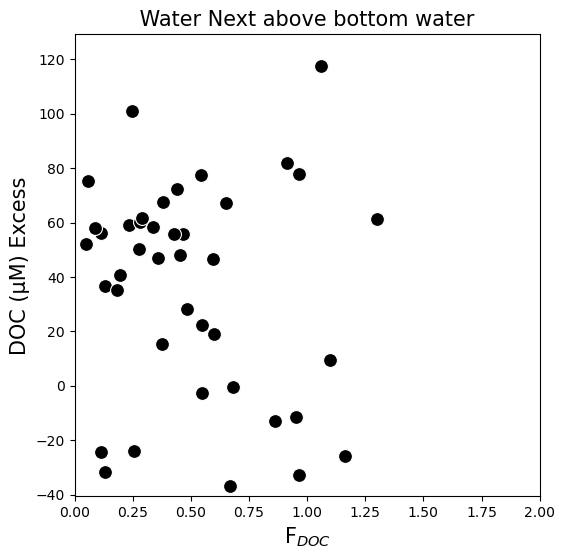

In [35]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = 0
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, color = 'black', data=data, ax=axes, legend=False, s = 100, edgecolor = 'white')
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.1, data[y_var].max()*1.1)

    #axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel , size = 15)

    # Show the plot
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'aou_ceq_doc_diff'
z_var = 'NPOC_uM'

y_var_lab = r'DOC (µM) Excess'
z_var_lab = r'DOC (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'
z_var_color = cmo.matter

titel = " Water Next above bottom water "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_deep)

Intercept (TLS): 31.755493900134837
Slope (TLS): -10.354824927040212


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


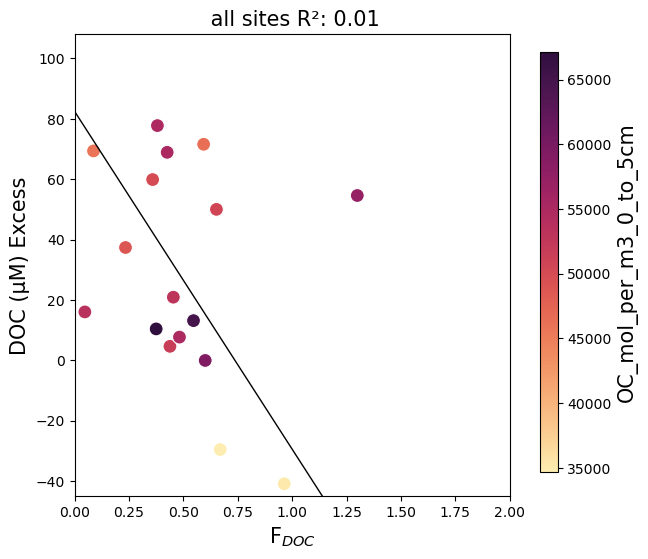

Intercept (TLS): 19.78120305049583
Slope (TLS): 4.644551823637441


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


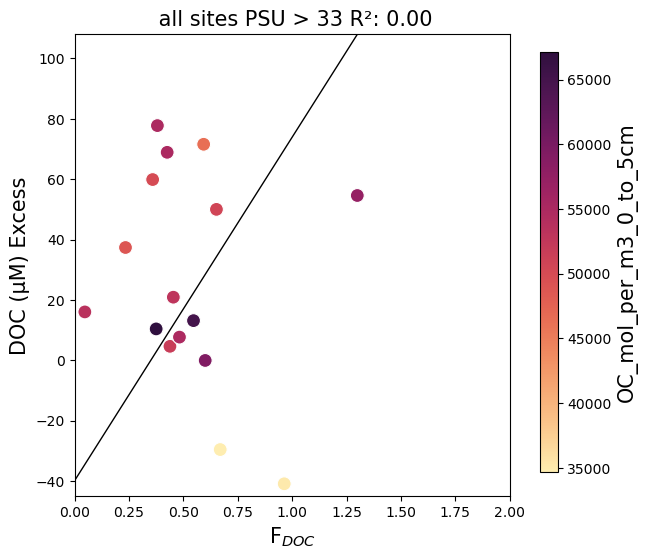

Intercept (TLS): 34.88754336828648
Slope (TLS): 20.28176441410012


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


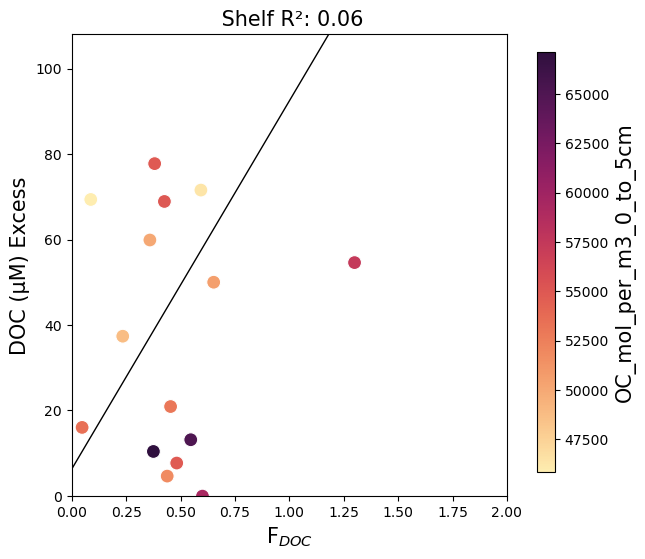

Intercept (TLS): 22.352689868886863
Slope (TLS): 37.70983021320683


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


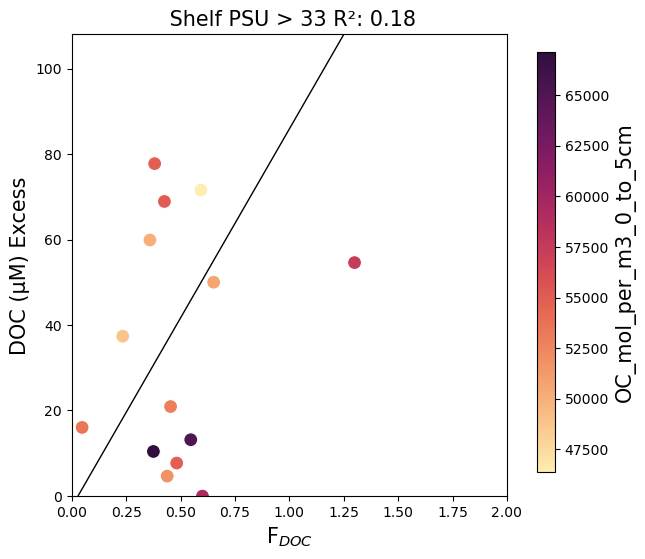

In [36]:
def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.1, data[y_var].max()*1.1)

    axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'OC_mol_per_m3_0_to_5cm'
z_var_lab = r'OC_mol_per_m3_0_to_5cm'
z_var_color = cmo.matter

titel = " all sites "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " all sites PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['sal'] >= 33])

titel = " Shelf "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf)

titel = " Shelf PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

Intercept (TLS): 44.23094827020976
Slope (TLS): -14.71283584570778


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


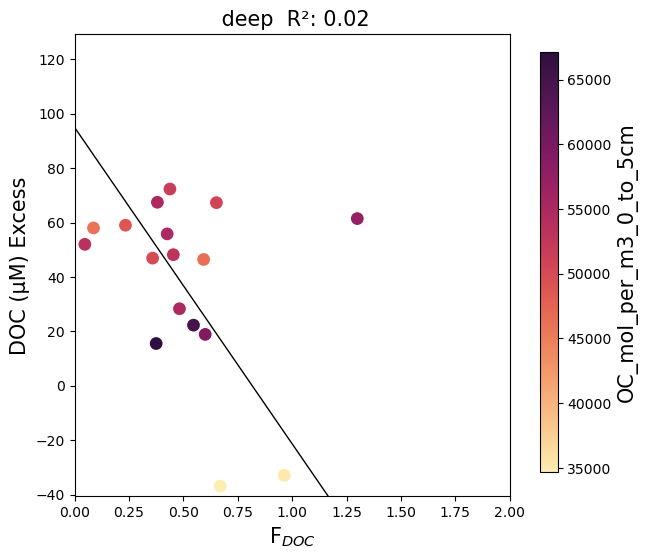

Intercept (TLS): 36.664204235206114
Slope (TLS): -6.50809200970371


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


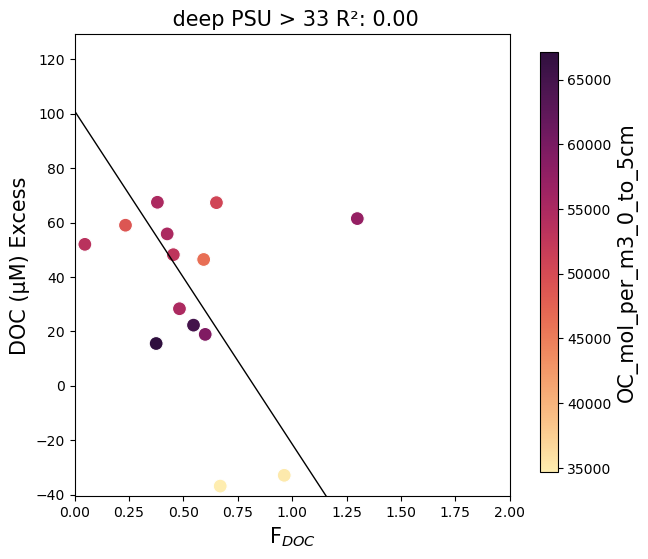

In [37]:

titel = " deep  "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_deep)

titel = " deep PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_deep[data_wc_deep['sal'] >= 33])


Intercept (TLS): 31.755493900134837
Slope (TLS): -10.354824927040212


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


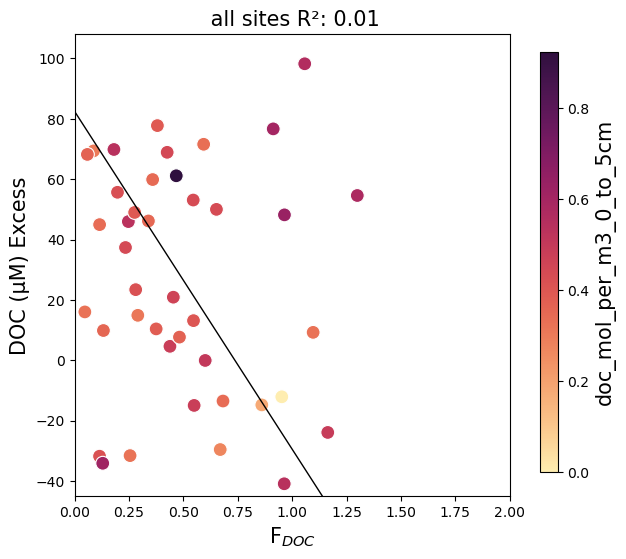

Intercept (TLS): 22.352689868886863
Slope (TLS): 37.70983021320683


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


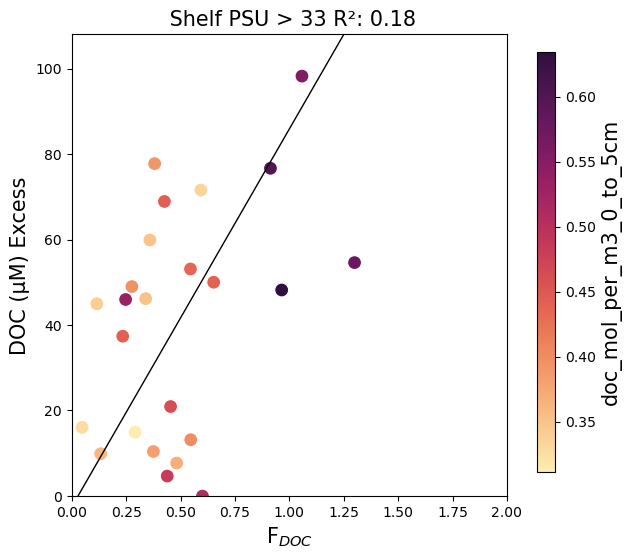

Intercept (TLS): 30.776170695503243
Slope (TLS): -10.10736620815048


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


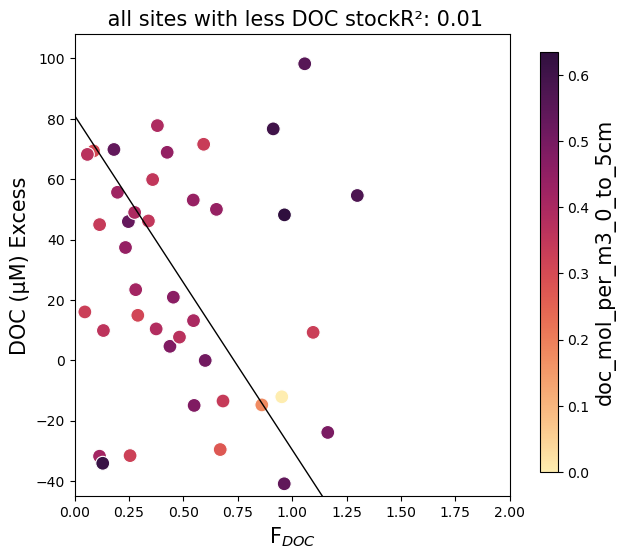

In [38]:

y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'doc_mol_per_m3_0_to_5cm'
z_var_lab = r'doc_mol_per_m3_0_to_5cm'
z_var_color = cmo.matter

titel = " all sites "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " Shelf PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

titel = " all sites with less DOC stock"
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['doc_mol_per_m3_0_to_5cm'] <= .8])

In [39]:
data_wc_bbl.columns

Index(['code', 'code.2', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth',
       'Campaign', 'Location', 'Ts', 'density_kg_m3', 'density_kg_l',
       'ox_umol_kg', 'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'bc_flux_doc', 'ratio_stock_2_flux', 'aou_ceq', 'rgn',
       'DOC_uM_sal_corrected', 'aou_ceq_doc_diff', 'DOC_percent_ex', 'TN_uM',
       'TN_uM_std', 'NPOC_uM_std', 'DOC:TDN', 'DOC:TDN_err'],
      dtype='object')

Intercept (TLS): 31.755493900134837
Slope (TLS): -10.354824927040212


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


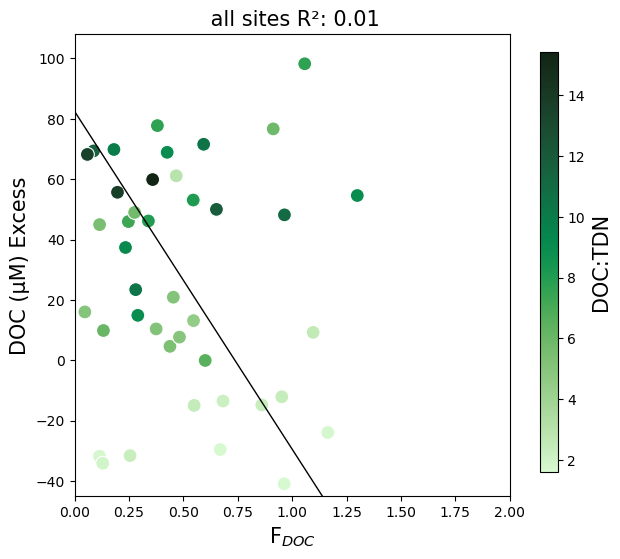

In [40]:
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'DOC:TDN'
z_var_lab = r'DOC:TDN'
z_var_color = cmo.algae

titel = " all sites "
save_name = 'aou_sal_wc_and_bbl_DOC_TN_RATIO'
xyplotcolor_flux_pred(data_wc_bbl)


Intercept (TLS): 31.755493900134837
Slope (TLS): -10.354824927040212


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


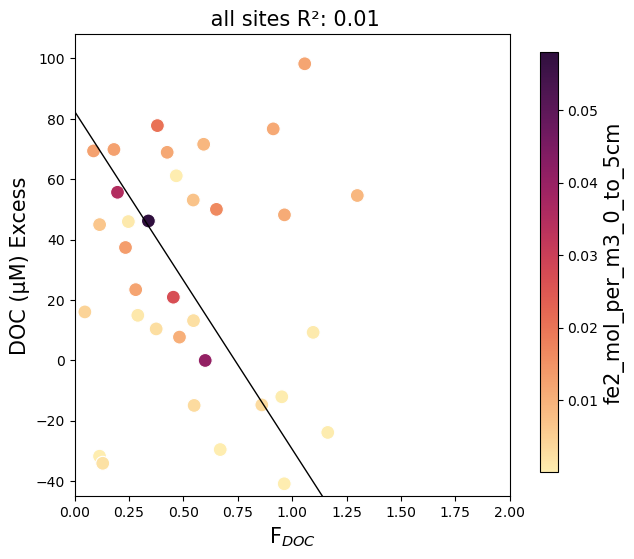

Intercept (TLS): 43.620626457698016
Slope (TLS): 14.871932306380366


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


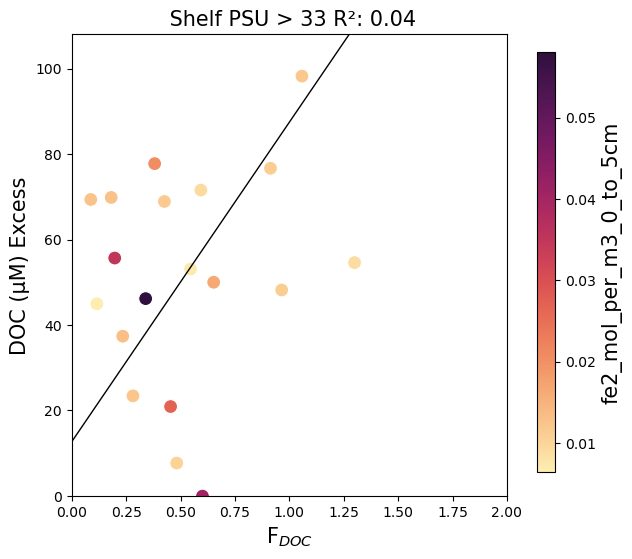

In [41]:

y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'fe2_mol_per_m3_0_to_5cm'
z_var_lab = r'fe2_mol_per_m3_0_to_5cm'
z_var_color = cmo.matter

titel = " all sites "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " Shelf PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['fe2_mol_per_m3_0_to_5cm'] >= .005])


Intercept (TLS): 0.4025815551544391
Slope (TLS): 0.04285381241101685


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


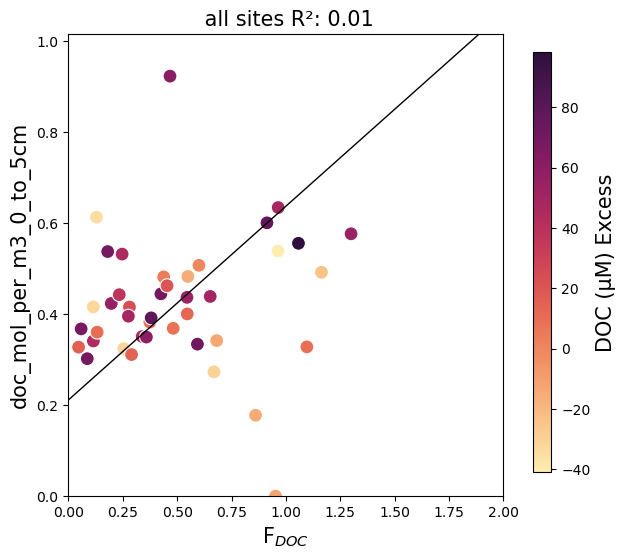

Intercept (TLS): 0.32400909093986713
Slope (TLS): 0.2253083892166331


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


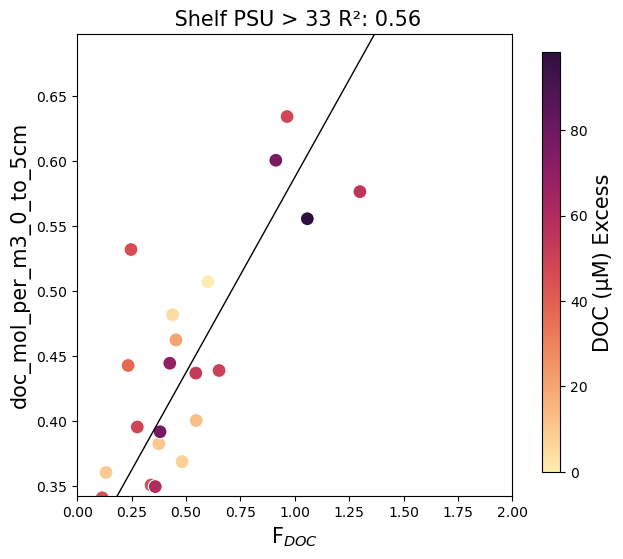

Intercept (TLS): 0.3882591424836735
Slope (TLS): 0.04647284836784511


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


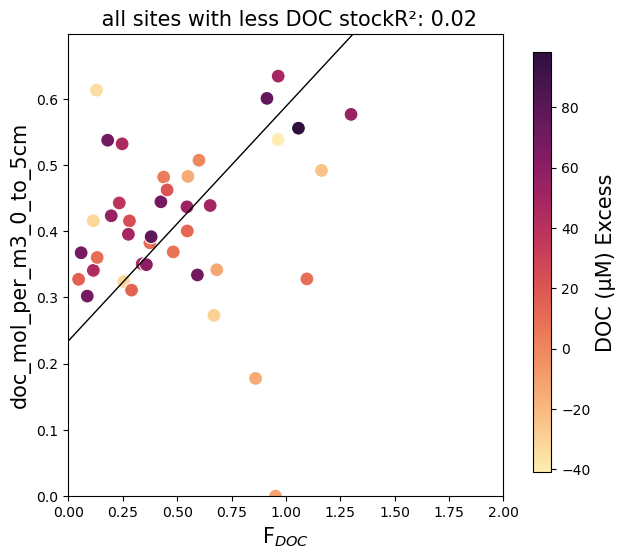

In [42]:

z_var = 'aou_ceq_doc_diff'
z_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

y_var = 'doc_mol_per_m3_0_to_5cm'
y_var_lab = r'doc_mol_per_m3_0_to_5cm'
z_var_color = cmo.matter

titel = " all sites "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " Shelf PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

titel = " all sites with less DOC stock"
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl[data_wc_bbl['doc_mol_per_m3_0_to_5cm'] <= .8])

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\160281891.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['excess_over_flux'] =  data_wc_bbl['aou_ceq_doc_diff'] / data_wc_bbl['pw_flux_doc']
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): 182.2814987907003
Slope (TLS): -156.67978143028742


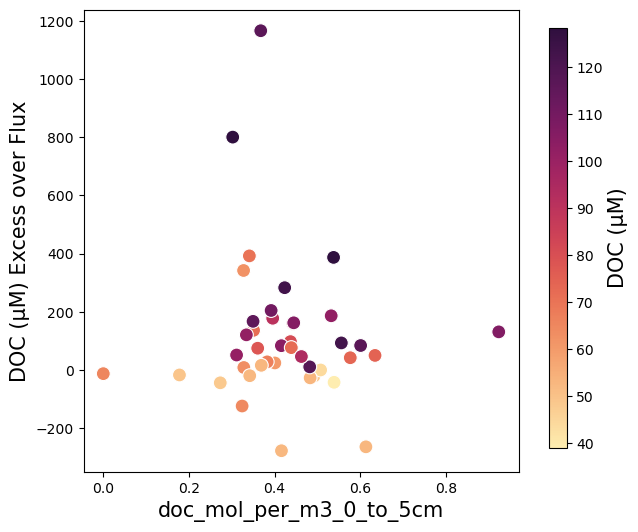

Intercept (TLS): 284.13867509042603
Slope (TLS): -391.10466804208863


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


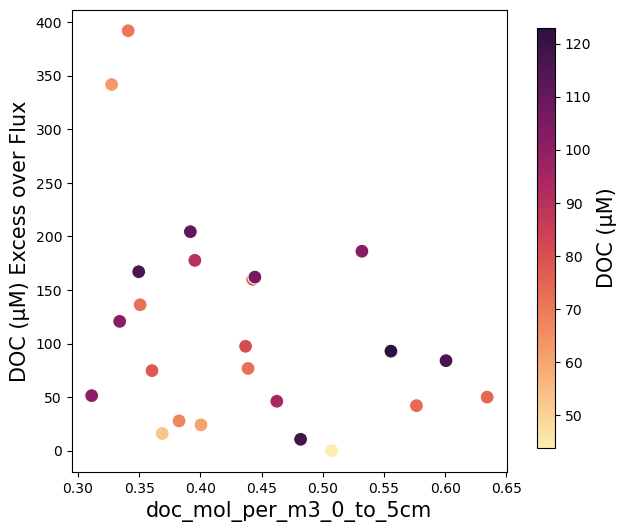

In [43]:
def xyplotcolor_flux_pred_new(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls
    print("Intercept (TLS):", intercept_tls)
    print("Slope (TLS):", slope_tls)

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r= results['r']

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    #axes.set_xlim(0, 20)
    #axes.set_ylim(0, data[y_var].max()*1.1)

    #axes.axline((0,0+intercept), (130,(130*slope)+intercept), linewidth=1, color='black')
    #axes.set_title(titel + f'R\u00B2: {r*r:.2f}', size = 15)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    # Show the plot
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()
    
data_wc_bbl['excess_over_flux'] =  data_wc_bbl['aou_ceq_doc_diff'] / data_wc_bbl['pw_flux_doc']

y_var = 'excess_over_flux'
y_var_lab = r'DOC (µM) Excess over Flux'

x_var = 'doc_mol_per_m3_0_to_5cm'
x_var_lab = r'doc_mol_per_m3_0_to_5cm'


z_var = 'NPOC_uM'
z_var_lab = r'DOC (µM)'
z_var_color = cmo.matter

titel = " all sites "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred_new(data_wc_bbl)

titel = " Shelf PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred_new(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

Intercept (TLS): 31.755493900134837
Slope (TLS): -10.354824927040212


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\matplotlib\colors.py:1371: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)


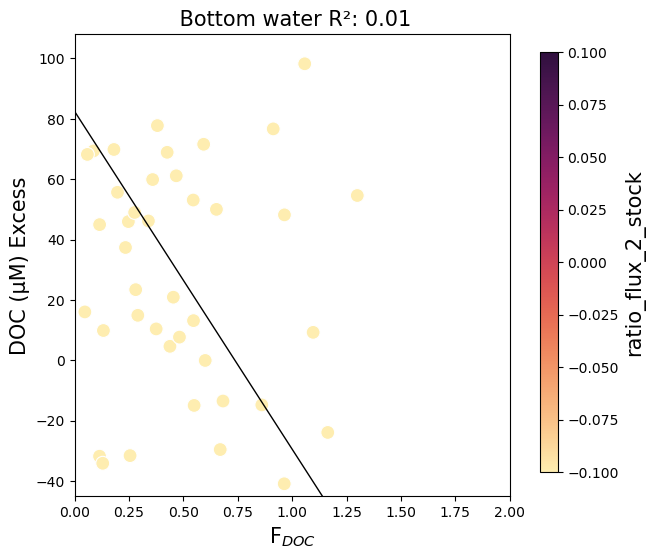

Intercept (TLS): 22.352689868886863
Slope (TLS): 37.70983021320683


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


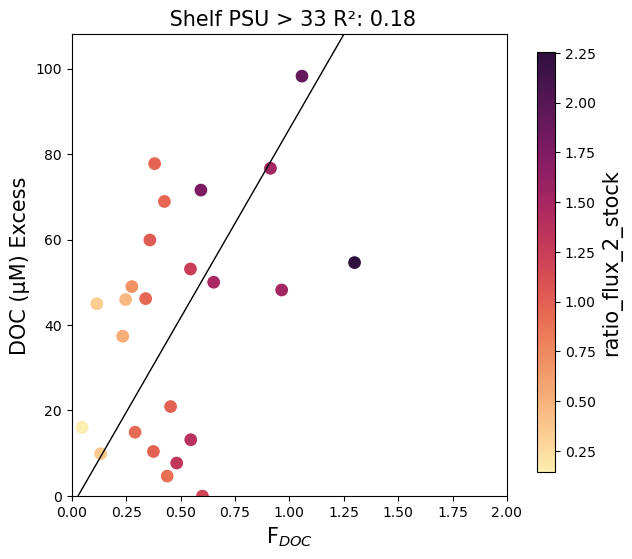

In [44]:

y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'ratio_flux_2_stock'
z_var_lab = r'ratio_flux_2_stock'

titel = " Bottom water "
save_name = 'aou_sal_wc_and_bbl'
xyplotcolor_flux_pred(data_wc_bbl)

titel = " Shelf PSU > 33 "
save_name = 'aou_sal_wc_and_bbl'
data_bbl_shelf = data_wc_bbl[data_wc_bbl['rgn'] != "Slope"]
xyplotcolor_flux_pred(data_bbl_shelf[data_bbl_shelf['sal'] >= 33])

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): 82.44691623883182
Slope (TLS): -111.88385114931556
R2 (TLS): 0.008565460318244738


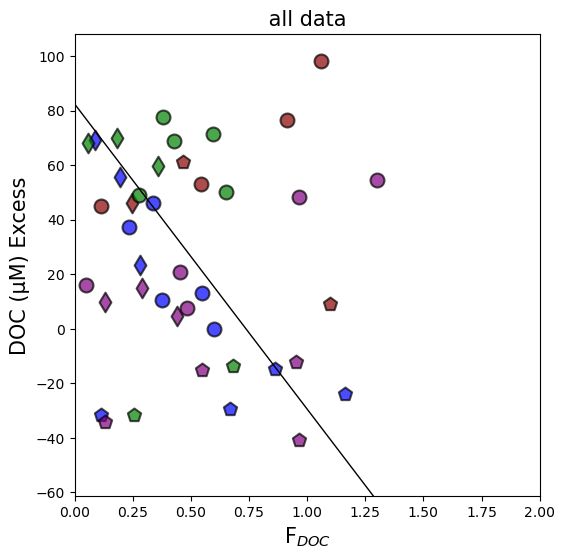

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): -39.82147141135651
Slope (TLS): 113.74551872077397
R2 (TLS): 0.0016673202890116388


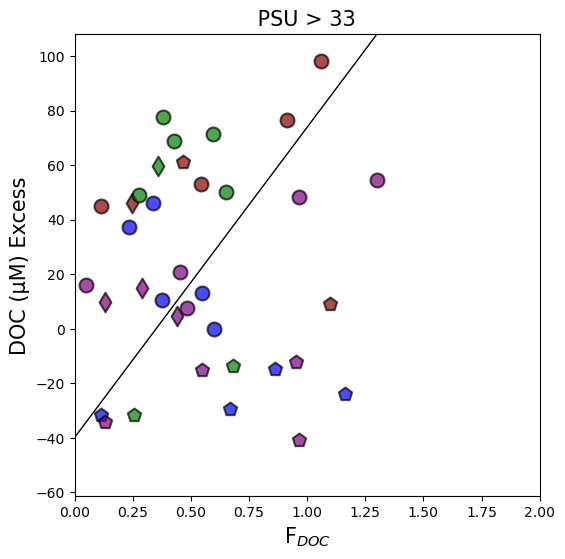

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): 6.3593853697825296
Slope (TLS): 86.11020341499416
R2 (TLS): 0.055475629280177685


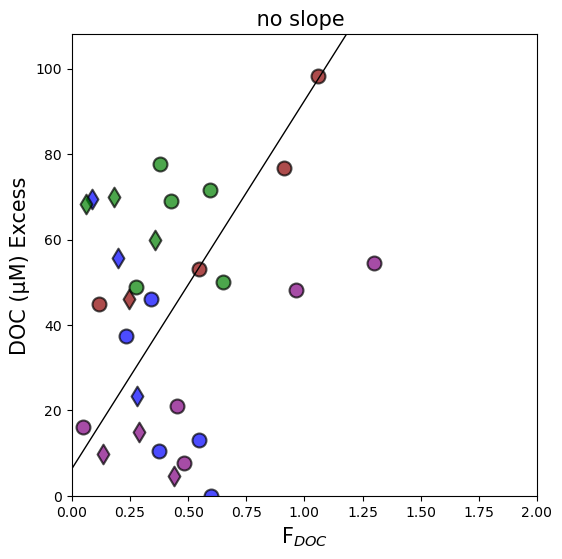

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): -2.4934614129001886
Slope (TLS): 88.39749599415049
R2 (TLS): 0.1819823328050536


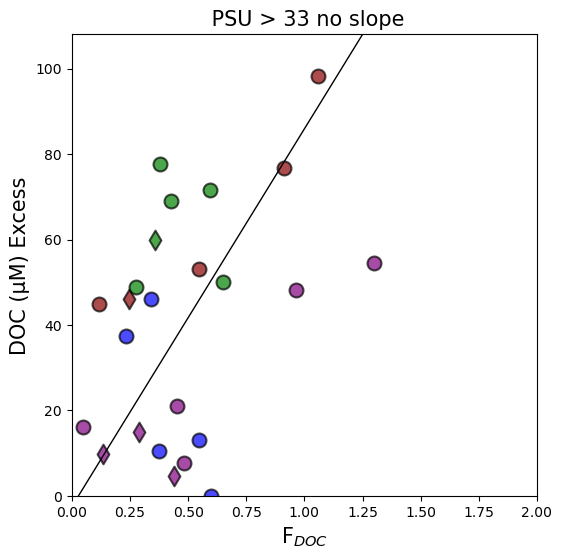

In [45]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}


marker_map = {
    'Slope': 'p',
    'Shelf': 'o',
    'River Delta': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']
    
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=1, color='black')
    
    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.5, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)



titel = " all data "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

titel = " PSU > 33 "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['sal'] >= 33])

data_grater_33 = data_wc_bbl[data_wc_bbl['sal'] >= 33]

titel = " no slope  "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['rgn'] != 'Slope'])


titel = " PSU > 33 no slope"
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_grater_33[data_grater_33['rgn'] != 'Slope'])


In [46]:
data_wc_deep['Campaign']

code
St.11_GOM2021      GOM2021
St.11_GOM21FA      GOM21FA
St.11_GOM22SU      GOM22SU
St.12_GOM21FA      GOM21FA
St.12_GOM22SU      GOM22SU
St.13_GOM2021      GOM2021
St.13_GOM21FA      GOM21FA
St.13_GOM22SP      GOM22SP
St.13_GOM22SU      GOM22SU
St.14.5_GOM21FA    GOM21FA
St.14_GOM2021      GOM2021
St.14_GOM21FA      GOM21FA
St.14_GOM22SP      GOM22SP
St.14_GOM22SU      GOM22SU
St.15_GOM2021      GOM2021
St.15_GOM21FA      GOM21FA
St.15_GOM22SP      GOM22SP
St.15_GOM22SU      GOM22SU
St.16-2_GOM21FA    GOM21FA
St.16_GOM2021      GOM2021
St.16_GOM21FA      GOM21FA
St.16_GOM22SP      GOM22SP
St.16_GOM22SU      GOM22SU
St.2_GOM2021       GOM2021
St.2_GOM21FA       GOM21FA
St.2_GOM22SP       GOM22SP
St.2_GOM22SU       GOM22SU
St.4_GOM2021       GOM2021
St.4_GOM21FA       GOM21FA
St.4_GOM22SP       GOM22SP
St.4_GOM22SU       GOM22SU
St.5B_GOM2021      GOM2021
St.5B_GOM21FA      GOM21FA
St.5B_GOM22SP      GOM22SP
St.5B_GOM22SU      GOM22SU
St.6_GOM21FA       GOM21FA
St.7_GOM2021       GOM2

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): 94.95436266579598
Slope (TLS): -116.30593843895396
R2 (TLS): 0.01600254286854027


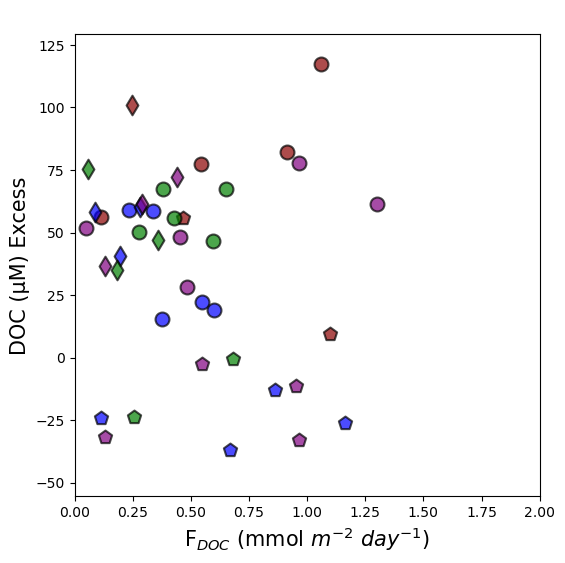

In [95]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Assuming tls_regression and regress2 are defined elsewhere in your code

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()

    # Drop rows with NaN in relevant columns
    sub = df.dropna(subset=[x_var, y_var, z_var, 'rgn'])

    # Extract necessary data columns
    data = sub[[x_var, y_var, z_var, 'rgn']]

    # Make sure `x_var` and `y_var` are numeric
    X = pd.to_numeric(data[x_var], errors='coerce').dropna().to_frame()
    y = pd.to_numeric(data[y_var], errors='coerce').dropna()

    # Fit the model with only numeric data
    model.fit(X, y)
    score = model.score(X, y)

    # Plot each campaign and region
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, 
                alpha=0.7, 
                ax=axes, 
                legend=False
            )

    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")
    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)

    #axes.axline((0, intercept), slope=slope, linewidth=1, color='black')
    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min() * 1.5, data[y_var].max() * 1.1)
    axes.set_title(titel, size=15)

    plt.show()

# Variables for plotting
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'
x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'
z_var = 'Campaign'
titel = "  "
save_name = 'aou_sal_wc_and_bbl'

# Call the function
xyplotcolor_cat_color(data_wc_deep)




data_grater_33 = data_wc_bbl[data_wc_bbl['sal'] >= 33]

titel = " Slope "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_grater_33[data_grater_33['rgn'] == 'Slope'])

titel = " Distal Shelf "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_grater_33[data_grater_33['rgn'] == 'Distal Shelf'])

titel = " Proximal Shelf  "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_grater_33[data_grater_33['rgn'] == 'Proximal Shelf'])

titel = " Hypoxic Shelf "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_grater_33[data_grater_33['rgn'] == 'Hypoxic Shelf'])

In [48]:
data_wc_bbl.columns

Index(['code', 'code.2', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth',
       'Campaign', 'Location', 'Ts', 'density_kg_m3', 'density_kg_l',
       'ox_umol_kg', 'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'bc_flux_doc', 'ratio_stock_2_flux', 'aou_ceq', 'rgn',
       'DOC_uM_sal_corrected', 'aou_ceq_doc_diff', 'DOC_percent_ex', 'TN_uM',
       'TN_uM_std', 'NPOC_uM_std', 'DOC:TDN', 'DOC:TDN_err',
       'excess_over_flux'],
      dtype='object')

In [49]:
data_wc_bbl['Cox_2'] = ( data_wc_bbl['pw_flux_doc'] / .36 ) ** (1 / 0.29)


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3686166744.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['Cox_2'] = ( data_wc_bbl['pw_flux_doc'] / .36 ) ** (1 / 0.29)


In [50]:
dic_flux_evan = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/GOM_Benthic_Fluxes_evan.csv', index_col=0)
dic_flux_evan_join = dic_flux_evan['Benthic_DIC_Flux']
data_wc_bbl['flux_dic'] = dic_flux_evan_join

data_wc_bbl['leak_percent'] = data_wc_bbl['pw_flux_doc'] / ( data_wc_bbl['flux_dic'] + data_wc_bbl['pw_flux_doc']) * 100
data_wc_bbl['leak_percent'] = data_wc_bbl['leak_percent'].replace(100, np.nan)
mean_leak_percent = data_wc_bbl.groupby(['rgn', 'Campaign'])['leak_percent'].mean()
print(mean_leak_percent)
mean_leak_percent = data_wc_bbl.groupby(['Campaign'])['leak_percent'].mean()
print(mean_leak_percent)
mean_leak_percent = data_wc_bbl.groupby(['rgn'])['leak_percent'].mean()
print(mean_leak_percent)
print(data_wc_bbl['leak_percent'].min())
print(data_wc_bbl['leak_percent'].max())
print(data_wc_bbl['leak_percent'].mean())

data_wc_bbl['Cox_DIC_Flux'] = data_wc_bbl['Cox'] / ( data_wc_bbl['flux_dic'] + data_wc_bbl['pw_flux_doc'])
data_wc_bbl['Cox_DIC_Flux'] = data_wc_bbl['Cox_DIC_Flux'].replace(100, np.nan)
mean_leak_percent = data_wc_bbl.groupby(['rgn', 'Campaign'])['Cox_DIC_Flux'].mean()
print(mean_leak_percent)
mean_leak_percent = data_wc_bbl.groupby(['Campaign'])['Cox_DIC_Flux'].mean()
print(mean_leak_percent)
mean_leak_percent = data_wc_bbl.groupby(['rgn'])['Cox_DIC_Flux'].mean()
print(mean_leak_percent)
print(data_wc_bbl['Cox_DIC_Flux'].min())
print(data_wc_bbl['Cox_DIC_Flux'].max())
print(data_wc_bbl['Cox_DIC_Flux'].mean())

rgn             Campaign
Distal Shelf    GOM2021           NaN
                GOM21FA      2.127024
                GOM22SP      2.988645
                GOM22SU      0.659669
Hypoxic Shelf   GOM2021      2.746465
                GOM21FA      1.850769
                GOM22SP      0.943019
                GOM22SU      0.212519
Proximal Shelf  GOM2021      2.804423
                GOM21FA      1.015388
                GOM22SP      0.392392
                GOM22SU      4.593501
Slope           GOM2021      5.371933
                GOM21FA      9.971106
                GOM22SP      3.045323
                GOM22SU     23.774547
Name: leak_percent, dtype: float64
Campaign
GOM2021    3.819835
GOM21FA    5.875578
GOM22SP    2.233891
GOM22SU    9.601381
Name: leak_percent, dtype: float64
rgn
Distal Shelf       2.178201
Hypoxic Shelf      1.438193
Proximal Shelf     2.700605
Slope             10.426803
Name: leak_percent, dtype: float64
0.2125191930559297
32.26985548971004
5.484617336203069
rg

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2819366386.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['flux_dic'] = dic_flux_evan_join
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2819366386.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['leak_percent'] = data_wc_bbl['pw_flux_doc'] / ( data_wc_bbl['flux_dic'] + data_wc_bbl['pw_flux_doc']) * 100
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2819366386.py:6: SettingWithCopyWarning: 
A value is trying to be set 

In [51]:
data_wc_bbl['Cox_DIC_Flux']

code
St.11_GOM2021       0.144990
St.13_GOM2021            NaN
St.14_GOM2021            NaN
St.15_GOM2021       3.390129
St.16_GOM2021       0.581815
St.2_GOM2021        0.315490
St.4_GOM2021             NaN
St.5B_GOM2021            NaN
St.7_GOM2021       27.111375
St.9_GOM2021             NaN
St.MK_GOM2021       0.030310
St.ML_GOM2021            NaN
St.11_GOM21FA       0.444527
St.12_GOM21FA       3.902900
St.13_GOM21FA       0.005277
St.14_GOM21FA       0.288310
St.14.5_GOM21FA          NaN
St.15_GOM21FA       5.932105
St.16_GOM21FA       0.024368
St.16-2_GOM21FA          NaN
St.2_GOM21FA             NaN
St.4_GOM21FA             NaN
St.5B_GOM21FA       0.001575
St.6_GOM21FA             NaN
St.7_GOM21FA        0.005001
St.9_GOM21FA        3.064236
St.MK_GOM21FA       1.509994
St.MK-2_GOM21FA          NaN
St.13_GOM22SP       0.015524
St.14_GOM22SP       0.142314
St.15_GOM22SP       0.635759
St.16_GOM22SP       0.005678
St.2_GOM22SP        3.180214
St.4_GOM22SP             NaN
St.5B_GOM

In [52]:
data_wc_bbl['leak_percent']

code
St.11_GOM2021       2.757872
St.13_GOM2021            NaN
St.14_GOM2021            NaN
St.15_GOM2021       7.985994
St.16_GOM2021       1.496609
St.2_GOM2021        4.112237
St.4_GOM2021             NaN
St.5B_GOM2021            NaN
St.7_GOM2021             NaN
St.9_GOM2021             NaN
St.MK_GOM2021       2.746465
St.ML_GOM2021            NaN
St.11_GOM21FA       3.506922
St.12_GOM21FA       7.946491
St.13_GOM21FA       3.142604
St.14_GOM21FA       3.735819
St.14.5_GOM21FA          NaN
St.15_GOM21FA      25.288406
St.16_GOM21FA       1.015388
St.16-2_GOM21FA          NaN
St.2_GOM21FA             NaN
St.4_GOM21FA             NaN
St.5B_GOM21FA       1.850769
St.6_GOM21FA             NaN
St.7_GOM21FA        0.518229
St.9_GOM21FA             NaN
St.MK_GOM21FA            NaN
St.MK-2_GOM21FA          NaN
St.13_GOM22SP       1.303063
St.14_GOM22SP       3.405597
St.15_GOM22SP       4.787583
St.16_GOM22SP       0.392392
St.2_GOM22SP             NaN
St.4_GOM22SP             NaN
St.5B_GOM

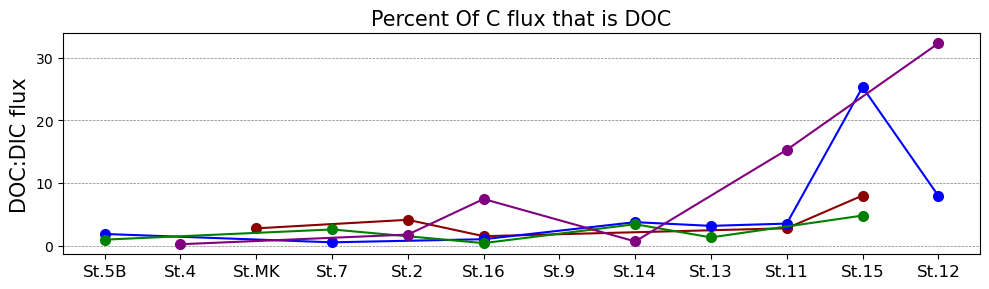

In [53]:
categories = ['St.5B', 'St.4', 'St.MK', 'St.7', 'St.2', 'St.16', 'St.9', 'St.14', 'St.13', 'St.11', 'St.15', 'St.12']
subcategories = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

def line_plot_stock(data_f, flux_col, ylabels, title): 
    df = data_f.dropna(subset=[flux_col])
    df = df[df[flux_col] > 0 ]

    color_map = {
        'GOM2021': 'darkred',
        'GOM21FA': 'blue',
        'GOM22SP': 'green',
        'GOM22SU': 'purple'
    }

    label_map = {
        'GOM2021': 'Summer 2021',
        'GOM21FA': 'Fall 2021',
        'GOM22SP': 'Spring 2022',
        'GOM22SU': 'Summer 2022'
    }

    barWidth = 0  # Adjusted bar width for better spacing
    fig, ax = plt.subplots(figsize=(10, 3))

    # Adjusted r for spacing between groups
    r = np.arange(len(categories))  # x locations for the groups
    positions = [r + i * barWidth for i in range(len(subcategories))]

    for pos, subcat in zip(positions, subcategories):
        values = []
        x_ticks = []
        for idx, cat in enumerate(categories):
            value = df[(df['Location'] == cat) & (df['Campaign'] == subcat)][flux_col].values
            if len(value) > 0:
                values.append(value[0])
                x_ticks.append(idx)
            else:
                continue  # Skip if there is no value
        
        # Plot only if there are values to plot
        if values:
            ax.plot(np.array(x_ticks) + barWidth * (subcategories.index(subcat) - len(subcategories)/2), values,
                    color=color_map[subcat], label=label_map[subcat], markersize=7, marker='o')

    #ax.set_ylim(-20, y_min_max_val)
    ax.set_ylabel(ylabels, size=15)
    ax.set_title(title, size=15)
    ax.set_xticks(r)  # Use the positions where data was actually plotted
    ax.set_xticklabels([cat for cat in categories], size=12)
    ax.grid(True, axis='y', color='gray', linestyle='--', linewidth=0.5)  # Customizes color, style, and width
    ax.legend().remove()

    fig.set_facecolor('w')
    plt.tight_layout()

    plt.savefig(f'../Dissertation_projects/Figures/Flux_figures/{save_name}.png')

    plt.show()

# Define the parameters

y_min_max_val = 120

ylabes = r'DOC:DIC flux'
tlabes = r'Percent Of C flux that is DOC'
data_f = data_wc_bbl
flux_col = "leak_percent"
save_name = 'leak_percent'

line_plot_stock(data_f, flux_col, ylabes, tlabes)

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduct

SLOPE
Intercept (TLS): -64.38090779970071
Slope (TLS): 75.40984869554813
R2 (TLS): 0.008914223559361023

PROX SHELF
Intercept (TLS): 2.4934523726283118
Slope (TLS): 74.526203523555
R2 (TLS): 0.05470171571450638

HYPOX SHELF
Intercept (TLS): -34.89828902986523
Slope (TLS): 211.27447622840057
R2 (TLS): 0.0053171050723168755

DISTAL SHELF
Intercept (TLS): -8.482194436653643
Slope (TLS): 105.6877331503531
R2 (TLS): 0.21004176832667684



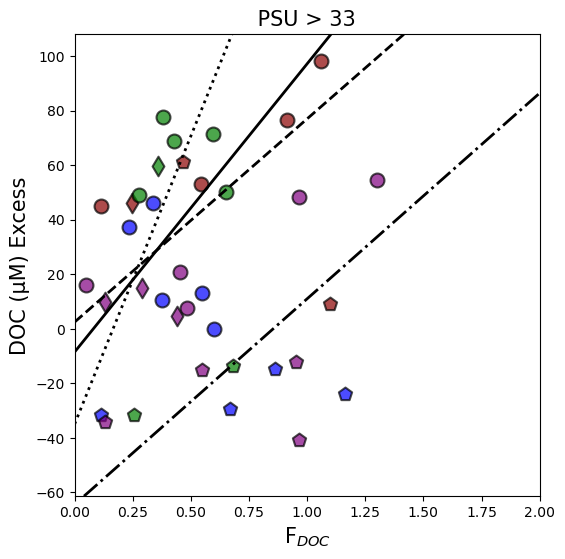

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduct

SLOPE
Intercept (TLS): -64.38090779970071
Slope (TLS): 75.40984869554813
R2 (TLS): 0.008914223559361023

PROX SHELF
Intercept (TLS): 2.4934523726283118
Slope (TLS): 74.526203523555
R2 (TLS): 0.05470171571450638

HYPOX SHELF
Intercept (TLS): 92.05310418123082
Slope (TLS): -219.7186303226153
R2 (TLS): 0.28206397808013495

DISTAL SHELF
Intercept (TLS): -8.482194436653643
Slope (TLS): 105.6877331503531
R2 (TLS): 0.21004176832667684



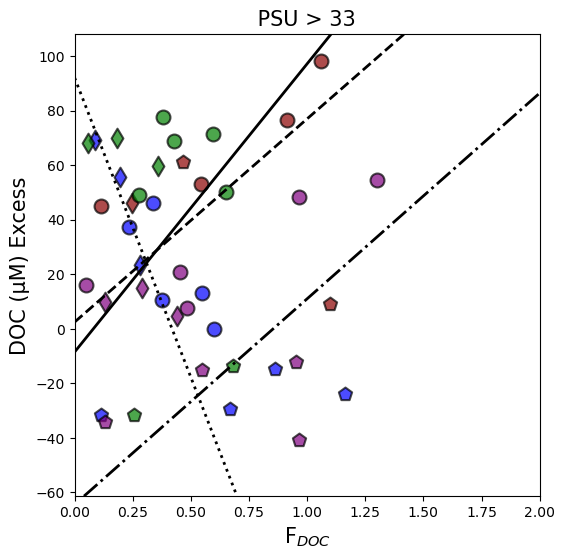

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduct

SLOPE
Intercept (TLS): 24.51262161547851
Slope (TLS): -19.082107834855986
R2 (TLS): 0.0371103254668231

PROX SHELF
Intercept (TLS): -15.440314641126527
Slope (TLS): 77.78580596746721
R2 (TLS): 0.14608809903873118

HYPOX SHELF
Intercept (TLS): 75.55128085285027
Slope (TLS): -239.4777898167547
R2 (TLS): 0.0037838913966647568

DISTAL SHELF
Intercept (TLS): 39.34550688397462
Slope (TLS): -62.31615836058913
R2 (TLS): 0.0873808598559603



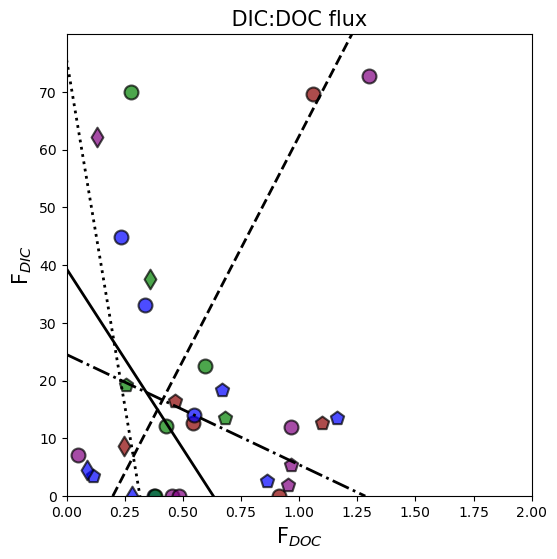

In [54]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Shelf': 'o',
    'River Delta': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] == 'Slope']
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-.')

    #PROX SHELF 
    subset_ps = data[data['rgn'] == 'Proximal Shelf']
    X = subset_ps[[x_var]]
    y = subset_ps[y_var]
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']
    
    print("PROX SHELF")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='dashed')

    #HYPOX SHELF 
    subset_hs = data[data['rgn'] == 'Hypoxic Shelf']
    X = subset_hs[[x_var]]
    y = subset_hs[y_var]
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']
    
    print("HYPOX SHELF")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle=':')
    
    # DISTAL Shelf 
    subset_ds = data[data['rgn'] == 'Distal Shelf']
    X = subset_ds[[x_var]]
    y = subset_ds[y_var]
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']
    
    print("DISTAL SHELF")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')
    
    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.5, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)



titel = " PSU > 33 "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['sal'] >= 33])


titel = " PSU > 33 "
save_name = 'final_fig_maybe_2'
xyplotcolor_cat_color(data_wc_bbl)


y_var = 'flux_dic'
y_var_lab = 'F$_{DIC}$'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'Campaign'

titel = " DIC:DOC flux "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): -16.419032565617574
Slope (TLS): 63.732533833965526
R2 (TLS): 0.009286553921334617


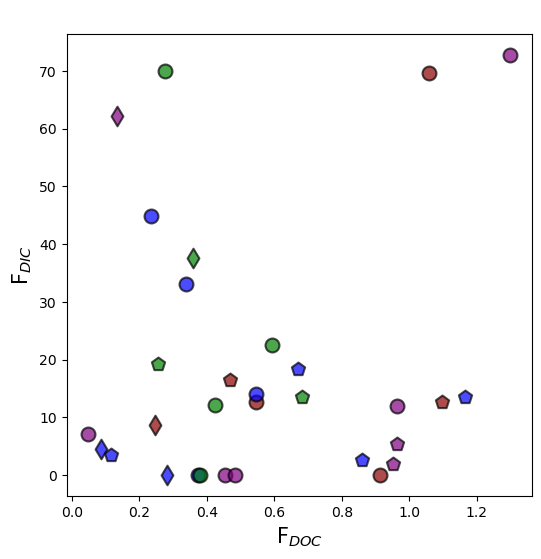

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): -16.419032565617574
Slope (TLS): 63.732533833965526
R2 (TLS): 0.009286553921334617


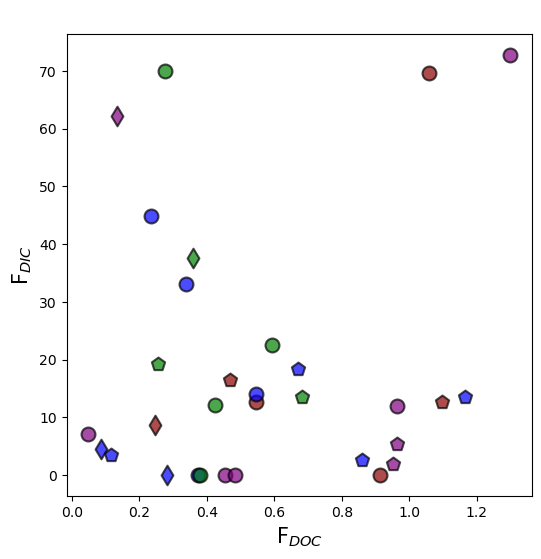

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


Intercept (TLS): 4.696655137919514
Slope (TLS): 1.0910192322016932
R2 (TLS): 0.07775398968720551


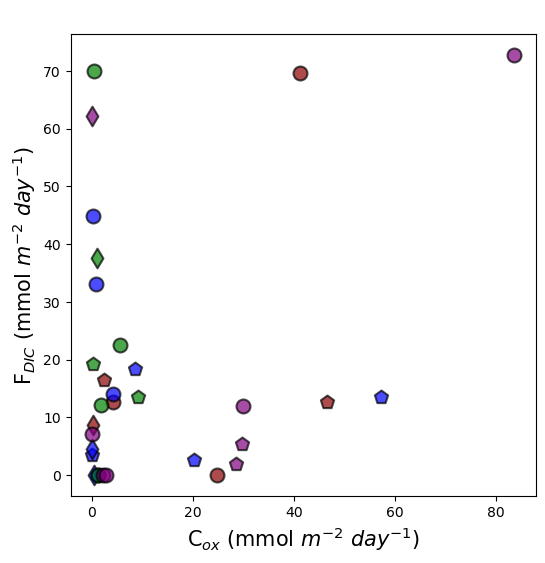

In [94]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}


marker_map = {
    'Slope': 'p',
    'Shelf': 'o',
    'River Delta': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']
    
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    
    #axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=1, color='black')
    
    #axes.set_xlim(0, 20)
    #axes.set_ylim(data[y_var].min()*1.5, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'flux_dic'
y_var_lab = 'F$_{DIC}$'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'Campaign'

titel = "  "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

titel = "  "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

y_var = 'flux_dic'
y_var_lab = 'F$_{DIC}$ (mmol $m^{-2}$ $day^{-1})$'

x_var = 'Cox'
x_var_lab = 'C$_{ox}$ (mmol $m^{-2}$ $day^{-1})$'

z_var = 'Campaign'

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

In [93]:
n = 0.29
x = 1.5
y = x / 0.36
z = y ** (1/n)  # Use `n` directly as the power.

print("y =", y)
print("z =", z)

y = 4.166666666666667
z = 137.15214835282225


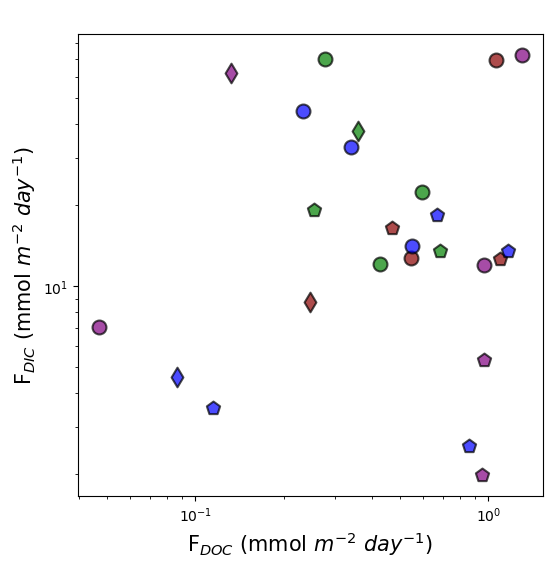

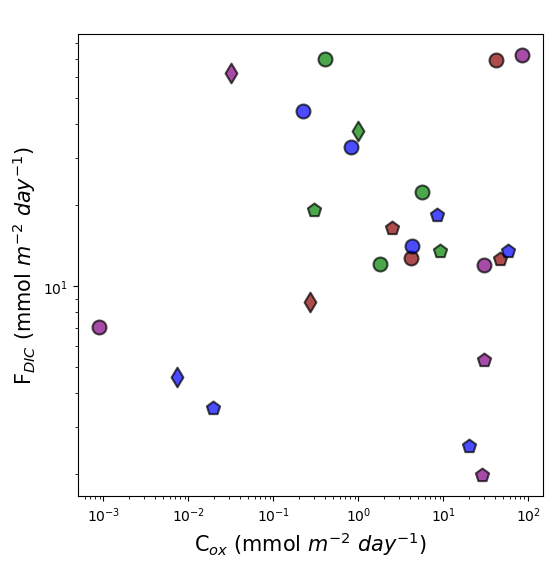

In [89]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Shelf': 'o',
    'River Delta': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor='black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False
            )
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)
    axes.set_xscale("log")
    axes.set_yscale("log")
    
    #axes.set_xlim(0, 20)
    #axes.set_ylim(data[y_var].min()*1.5, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()


y_var = 'flux_dic'
y_var_lab = 'F$_{DIC}$ (mmol $m^{-2}$ $day^{-1})$'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'

z_var = 'Campaign'

titel = "  "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

y_var = 'flux_dic'
y_var_lab = 'F$_{DIC}$ (mmol $m^{-2}$ $day^{-1})$'

x_var = 'Cox'
x_var_lab = 'C$_{ox}$ (mmol $m^{-2}$ $day^{-1})$'

z_var = 'Campaign'

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

In [57]:
# List of stations
stations = [
    'St.11_GOM2021', 'St.13_GOM2021', 'St.14_GOM2021', 'St.15_GOM2021',
    'St.16_GOM2021', 'St.2_GOM2021', 'St.4_GOM2021', 'St.5B_GOM2021',
    'St.7_GOM2021', 'St.9_GOM2021', 'St.MK_GOM2021', 'St.ML_GOM2021',
    'St.11_GOM21FA', 'St.12_GOM21FA', 'St.13_GOM21FA', 'St.14_GOM21FA',
    'St.14.5_GOM21FA', 'St.15_GOM21FA', 'St.16_GOM21FA',
    'St.16-2_GOM21FA', 'St.2_GOM21FA', 'St.4_GOM21FA', 'St.5B_GOM21FA',
    'St.6_GOM21FA', 'St.7_GOM21FA', 'St.9_GOM21FA', 'St.MK_GOM21FA',
    'St.MK-2_GOM21FA', 'St.13_GOM22SP', 'St.14_GOM22SP',
    'St.15_GOM22SP', 'St.16_GOM22SP', 'St.2_GOM22SP', 'St.4_GOM22SP',
    'St.5B_GOM22SP', 'St.7_GOM22SP', 'St.9_GOM22SP', 'St.MK_GOM22SP',
    'St.11_GOM22SU', 'St.12_GOM22SU', 'St.13_GOM22SU', 'St.14_GOM22SU',
    'St.15_GOM22SU', 'St.16_GOM22SU', 'St.2_GOM22SU', 'St.4_GOM22SU',
    'St.5B_GOM22SU', 'St.7_GOM22SU', 'St.9_GOM22SU', 'St.MK_GOM22SU'
]

# Define color mapping rules
color_map_2 = {}

for station in stations:
    if 'St.11' in station:
        color_map_2[station] = '#393939'  
    elif 'St.12' in station:
        color_map_2[station] = '#393939' 
    elif 'St.15' in station:
        color_map_2[station] = '#393939'  
    elif 'St.13' in station:
        color_map_2[station] = '#393939' 
    elif 'St.4_GOM21FA' in station:
        color_map_2[station] = '#393939' 
    elif 'St.5B_GOM21FA' in station:
        color_map_2[station] = '#393939' 
    elif 'St.MK_GOM21FA' in station:
        color_map_2[station] = '#393939' 
    elif 'St.4_GOM22SP' in station:
        color_map_2[station] = '#393939' 
    elif 'St.MK_GOM22SP' in station:
        color_map_2[station] = '#393939' 
    else:
        color_map_2[station] = 'black'  # Assign 'black' to other stations

# Display the color map
print(color_map_2)


{'St.11_GOM2021': '#393939', 'St.13_GOM2021': '#393939', 'St.14_GOM2021': 'black', 'St.15_GOM2021': '#393939', 'St.16_GOM2021': 'black', 'St.2_GOM2021': 'black', 'St.4_GOM2021': 'black', 'St.5B_GOM2021': 'black', 'St.7_GOM2021': 'black', 'St.9_GOM2021': 'black', 'St.MK_GOM2021': 'black', 'St.ML_GOM2021': 'black', 'St.11_GOM21FA': '#393939', 'St.12_GOM21FA': '#393939', 'St.13_GOM21FA': '#393939', 'St.14_GOM21FA': 'black', 'St.14.5_GOM21FA': 'black', 'St.15_GOM21FA': '#393939', 'St.16_GOM21FA': 'black', 'St.16-2_GOM21FA': 'black', 'St.2_GOM21FA': 'black', 'St.4_GOM21FA': '#393939', 'St.5B_GOM21FA': '#393939', 'St.6_GOM21FA': 'black', 'St.7_GOM21FA': 'black', 'St.9_GOM21FA': 'black', 'St.MK_GOM21FA': '#393939', 'St.MK-2_GOM21FA': 'black', 'St.13_GOM22SP': '#393939', 'St.14_GOM22SP': 'black', 'St.15_GOM22SP': '#393939', 'St.16_GOM22SP': 'black', 'St.2_GOM22SP': 'black', 'St.4_GOM22SP': '#393939', 'St.5B_GOM22SP': 'black', 'St.7_GOM22SP': 'black', 'St.9_GOM22SP': 'black', 'St.MK_GOM22SP': '

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


SLOPE
Intercept (TLS): -2.4934614129001886
Slope (TLS): 88.39749599415049
R2 (TLS): 0.1819823328050536



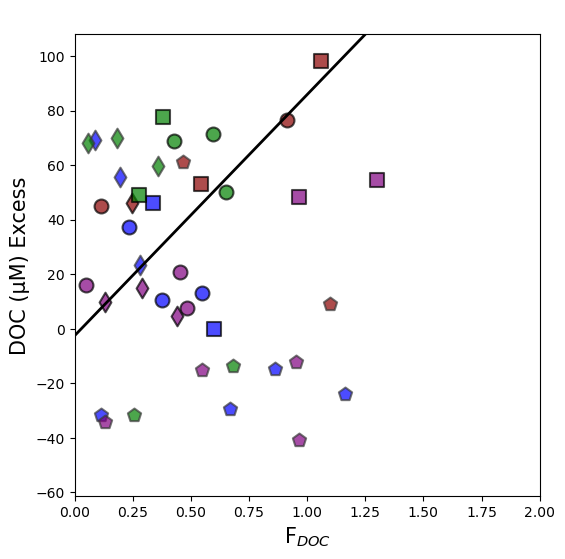

In [58]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            code = subset['code'].iloc[0]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor= color_map_2.get(code, 'black'), 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False,)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')

    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.5, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2648936317.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2648936317.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_5cm_err'] = doc_tdn_seds_5cmerr
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2648936317.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

SLOPE
Intercept (TLS): -2.4934614129001886
Slope (TLS): 88.39749599415049
R2 (TLS): 0.1819823328050536



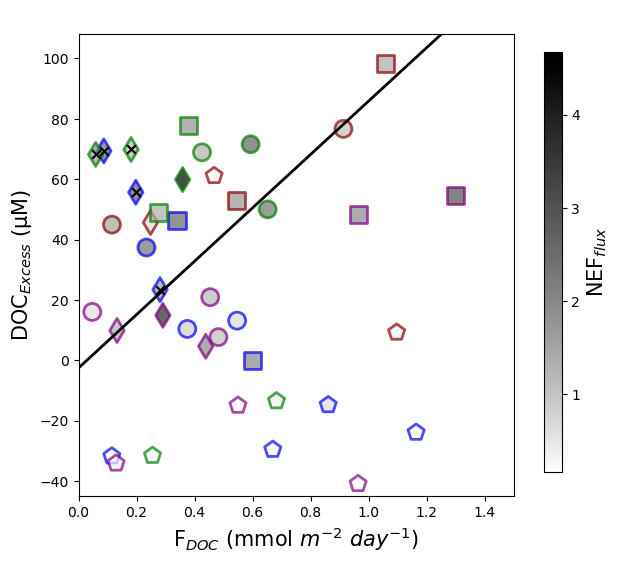

In [59]:
doc_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/DOC_stocks.csv', sep=',', index_col=0)

doc_stocks['DOC:TDN_5cm'] = doc_stocks['doc_mol_per_m3_0_to_5cm'] / doc_stocks['tn_mol_per_m3_0_to_5cm']
doc_tdn_seds_5cm = doc_stocks['DOC:TDN_5cm']
doc_tdn_seds_5cm

doc_stocks['DOC:TDN_5cmerr'] = (doc_stocks['doc_mol_per_m3_0_to_5cm_error']/doc_stocks['doc_mol_per_m3_0_to_5cm']) + (doc_stocks['tn_mol_per_m3_0_to_5cm_error']/ doc_stocks['tn_mol_per_m3_0_to_5cm'] )
doc_tdn_seds_5cmerr = doc_stocks['DOC:TDN_5cmerr']
doc_tdn_seds_5cmerr

data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm
data_wc_bbl['doc_tdn_seds_5cm_err'] = doc_tdn_seds_5cmerr


data_wc_bbl['doc_tdn_seds_over_water_5cm'] = data_wc_bbl['DOC:TDN'] / data_wc_bbl['doc_tdn_seds_5cm'] 

data_wc_bbl['doc_tdn_seds_over_water_5cm_err'] = (data_wc_bbl['DOC:TDN_err'] / data_wc_bbl['DOC:TDN'] ) + ( data_wc_bbl['doc_tdn_seds_5cm_err'] / data_wc_bbl['doc_tdn_seds_5cm'])


color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    #vmin = 0
    #vmax = 3
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    #axes.scatter(x=X, y=y, color = 'white', s = 2)
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')

    axes.set_xlim(0, 1.5)
    axes.set_ylim(data[y_var].min()*1.1, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] == 'Hypoxic Shelf']
    subset_slope = subset_slope[subset_slope['sal'] <= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    axes.scatter(x=X, y=y, color = 'black', s = 40, marker = 'x')
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC$_{Excess}$ (µM)'

x_var = 'pw_flux_doc'
x_var_lab = r'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'

z_var_lab = r'NEF$_{flux}$'
z_var = 'doc_tdn_seds_over_water_5cm'

colors = ["blue", "black", "red"]  # Replace these with any colors you want
import matplotlib.colors as mcolors
z_var_color = mcolors.LinearSegmentedColormap.from_list("three_color_gradient", colors, N=3)

z_var_color = cmo.gray.reversed()

#titel = "Water Column"
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

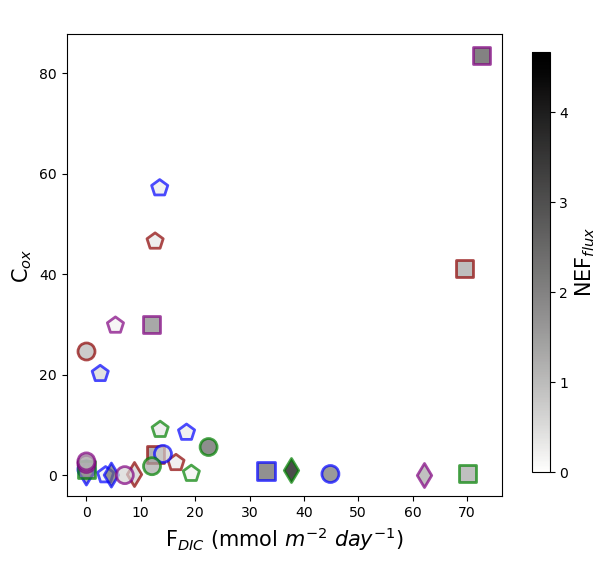

In [60]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    vmin = 0
    vmax = data[z_var].max()
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
x_var = 'flux_dic'
x_var_lab = 'F$_{DIC}$ (mmol $m^{-2}$ $day^{-1})$'

y_var = 'Cox'
y_var_lab = 'C$_{ox}$'

z_var_lab = r'NEF$_{flux}$'
z_var = 'doc_tdn_seds_over_water_5cm'
z_var_color = cmo.gray.reversed()

#titel = "Water Column"
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2457211344.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2457211344.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_over_water_5cm'] = data_wc_bbl['DOC:TDN'] / data_wc_bbl['doc_tdn_seds_5cm']
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with 

SLOPE
Intercept (TLS): -2.4934614129001886
Slope (TLS): 88.39749599415049
R2 (TLS): 0.1819823328050536



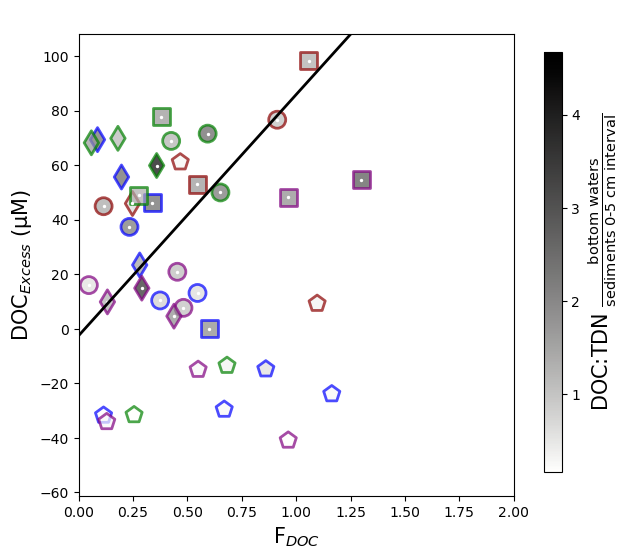

In [61]:
doc_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/DOC_stocks.csv', sep=',', index_col=0)
doc_stocks['DOC:TDN_5cm'] = doc_stocks['doc_mol_per_m3_0_to_5cm'] / doc_stocks['tn_mol_per_m3_0_to_5cm']

doc_tdn_seds_5cm = doc_stocks['DOC:TDN_5cm']
doc_tdn_seds_5cm

data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm

data_wc_bbl['doc_tdn_seds_over_water_5cm'] = data_wc_bbl['DOC:TDN'] / data_wc_bbl['doc_tdn_seds_5cm'] 

color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    #vmin = 0
    #vmax = 3
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    axes.scatter(x=X, y=y, color = 'white', s = 2)
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')

    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.5, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC$_{Excess}$ (µM)'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var_lab = r'DOC:TDN $\frac{\text{bottom waters}}{\text{sediments 0-5 cm interval}}$'
z_var = 'doc_tdn_seds_over_water_5cm'

colors = ["blue", "black", "red"]  # Replace these with any colors you want
import matplotlib.colors as mcolors
z_var_color = mcolors.LinearSegmentedColormap.from_list("three_color_gradient", colors, N=3)

z_var_color = cmo.gray.reversed()

#titel = "Water Column"
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\258655965.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\258655965.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_5cm_err'] = doc_tdn_seds_5cmerr
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\258655965.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row

SLOPE
Intercept (TLS): -1.3755560561600433
Slope (TLS): 84.57264013959603
R2 (TLS): 0.16310110133586958



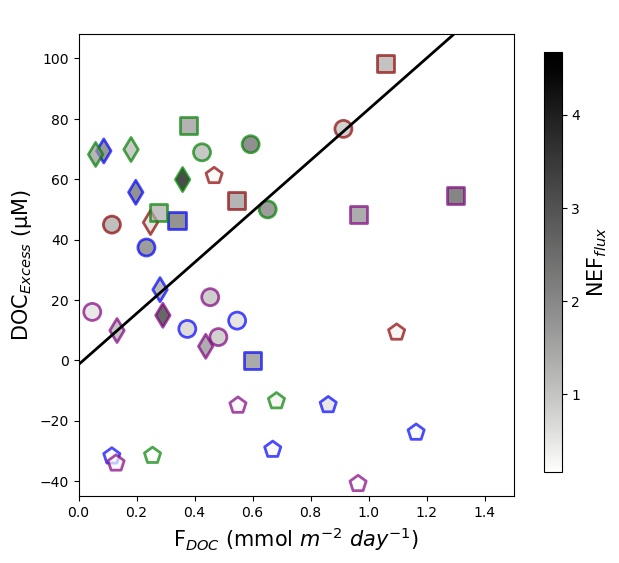

In [62]:
doc_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/DOC_stocks.csv', sep=',', index_col=0)

doc_stocks['DOC:TDN_5cm'] = doc_stocks['doc_mol_per_m3_0_to_5cm'] / doc_stocks['tn_mol_per_m3_0_to_5cm']
doc_tdn_seds_5cm = doc_stocks['DOC:TDN_5cm']
doc_tdn_seds_5cm

doc_stocks['DOC:TDN_5cmerr'] = (doc_stocks['doc_mol_per_m3_0_to_5cm_error']/doc_stocks['doc_mol_per_m3_0_to_5cm']) + (doc_stocks['tn_mol_per_m3_0_to_5cm_error']/ doc_stocks['tn_mol_per_m3_0_to_5cm'] )
doc_tdn_seds_5cmerr = doc_stocks['DOC:TDN_5cmerr']
doc_tdn_seds_5cmerr

data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm
data_wc_bbl['doc_tdn_seds_5cm_err'] = doc_tdn_seds_5cmerr


data_wc_bbl['doc_tdn_seds_over_water_5cm'] = data_wc_bbl['DOC:TDN'] / data_wc_bbl['doc_tdn_seds_5cm'] 

data_wc_bbl['doc_tdn_seds_over_water_5cm_err'] = (data_wc_bbl['DOC:TDN_err'] / data_wc_bbl['DOC:TDN'] ) + ( data_wc_bbl['doc_tdn_seds_5cm_err'] / data_wc_bbl['doc_tdn_seds_5cm'])


color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    vmin = data[z_var].min()
    vmax = data[z_var].max()

    #vmin = 0
    #vmax = 3
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'].isin(['Proximal Shelf', 'Distal Shelf'])]
    #subset_slope = data[data['rgn'] != 'Hypoxic Shelf']
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    #axes.scatter(x=X, y=y, color = 'white', s = 2)
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')

    axes.set_xlim(0, 1.5)
    axes.set_ylim(data[y_var].min()*1.1, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC$_{Excess}$ (µM)'

x_var = 'pw_flux_doc'
x_var_lab = r'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'

z_var_lab = r'NEF$_{flux}$'
z_var = 'doc_tdn_seds_over_water_5cm'

colors = ["blue", "black", "red"]  # Replace these with any colors you want
import matplotlib.colors as mcolors
z_var_color = mcolors.LinearSegmentedColormap.from_list("three_color_gradient", colors, N=3)

z_var_color = cmo.gray.reversed()

#titel = "Water Column"
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\1926281883.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\1926281883.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['doc_tdn_seds_5cm_err'] = doc_tdn_seds_5cmerr
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\1926281883.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

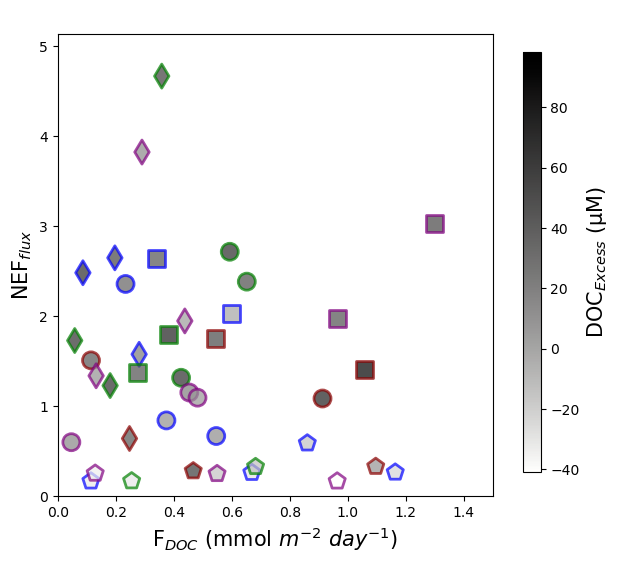

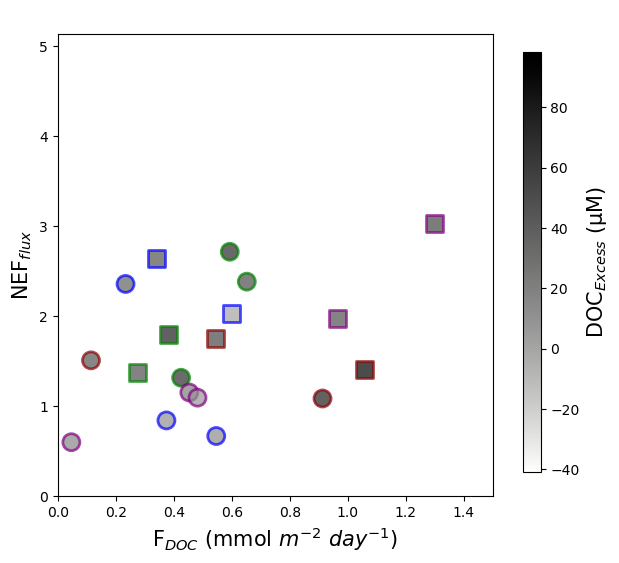

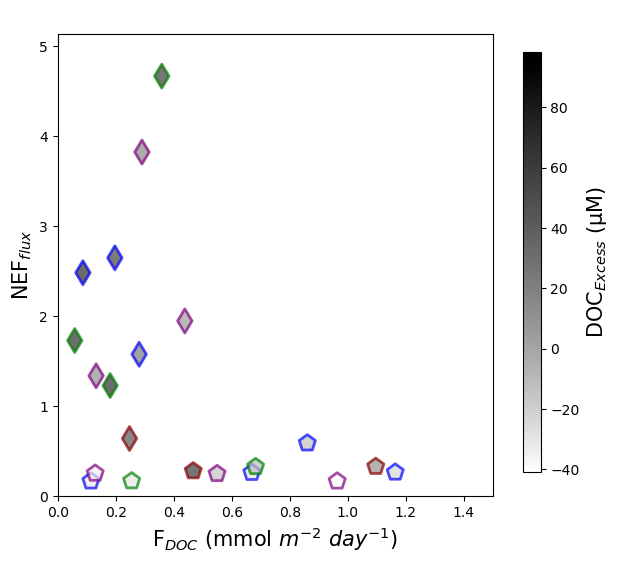

In [63]:
doc_stocks = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/DOC_stocks.csv', sep=',', index_col=0)

doc_stocks['DOC:TDN_5cm'] = doc_stocks['doc_mol_per_m3_0_to_5cm'] / doc_stocks['tn_mol_per_m3_0_to_5cm']
doc_tdn_seds_5cm = doc_stocks['DOC:TDN_5cm']
doc_tdn_seds_5cm

doc_stocks['DOC:TDN_5cmerr'] = (doc_stocks['doc_mol_per_m3_0_to_5cm_error']/doc_stocks['doc_mol_per_m3_0_to_5cm']) + (doc_stocks['tn_mol_per_m3_0_to_5cm_error']/ doc_stocks['tn_mol_per_m3_0_to_5cm'] )
doc_tdn_seds_5cmerr = doc_stocks['DOC:TDN_5cmerr']
doc_tdn_seds_5cmerr

data_wc_bbl['doc_tdn_seds_5cm'] = doc_tdn_seds_5cm
data_wc_bbl['doc_tdn_seds_5cm_err'] = doc_tdn_seds_5cmerr


data_wc_bbl['doc_tdn_seds_over_water_5cm'] = data_wc_bbl['DOC:TDN'] / data_wc_bbl['doc_tdn_seds_5cm'] 

data_wc_bbl['doc_tdn_seds_over_water_5cm_err'] = (data_wc_bbl['DOC:TDN_err'] / data_wc_bbl['DOC:TDN'] ) + ( data_wc_bbl['doc_tdn_seds_5cm_err'] / data_wc_bbl['doc_tdn_seds_5cm'])

data_wc_bbl['enrichemntfacotrflux'] = data_wc_bbl['pw_flux_doc'] * data_wc_bbl['doc_tdn_seds_over_water_5cm_err']

color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var, z_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    vmin = data_wc_bbl[z_var].min()
    vmax = data_wc_bbl[z_var].max()
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    axes.set_ylim(0, data_wc_bbl[y_var].max()*1.1)
    axes.set_xlim(0, 1.5)

    #SLOPE 
    subset_slope = data[data['rgn'].isin(['Proximal Shelf', 'Distal Shelf'])]
    #subset_slope = data[data['rgn'] != 'Hypoxic Shelf']
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
z_var = 'aou_ceq_doc_diff'
z_var_lab = r'DOC$_{Excess}$ (µM)'

x_var = 'pw_flux_doc'
x_var_lab = r'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'

y_var_lab = r'NEF$_{flux}$'
y_var = 'doc_tdn_seds_over_water_5cm'

colors = ["blue", "black", "red"]  # Replace these with any colors you want
import matplotlib.colors as mcolors
z_var_color = mcolors.LinearSegmentedColormap.from_list("three_color_gradient", colors, N=3)

z_var_color = cmo.gray.reversed()

#titel = "Water Column"
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)
xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['rgn'].isin(['Distal Shelf','Proximal Shelf'])])
xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['rgn'].isin(['Hypoxic Shelf','Slope'])])


In [64]:
data_wc_bbl['aou_ceq_doc_diff']


code
St.11_GOM2021      61.141015
St.13_GOM2021       3.284504
St.14_GOM2021      44.964153
St.15_GOM2021       9.268450
St.16_GOM2021      98.247463
St.2_GOM2021       53.107483
St.4_GOM2021       32.704641
St.5B_GOM2021      89.080175
St.7_GOM2021       76.677206
St.9_GOM2021       50.643300
St.MK_GOM2021      45.968894
St.ML_GOM2021      80.968294
St.11_GOM21FA     -29.556163
St.12_GOM21FA     -23.890272
St.13_GOM21FA     -31.759027
St.14_GOM21FA      13.153687
St.14.5_GOM21FA    18.879933
St.15_GOM21FA     -14.770010
St.16_GOM21FA      46.174148
St.16-2_GOM21FA    55.361665
St.2_GOM21FA       -0.039053
St.4_GOM21FA       55.672583
St.5B_GOM21FA      69.377171
St.6_GOM21FA       46.136826
St.7_GOM21FA       37.379896
St.9_GOM21FA       10.408882
St.MK_GOM21FA      23.416200
St.MK-2_GOM21FA    30.025593
St.13_GOM22SP     -31.563637
St.14_GOM22SP      68.913574
St.15_GOM22SP     -13.478797
St.16_GOM22SP      48.997557
St.2_GOM22SP       77.766663
St.4_GOM22SP       68.218753
St.5B_GOM

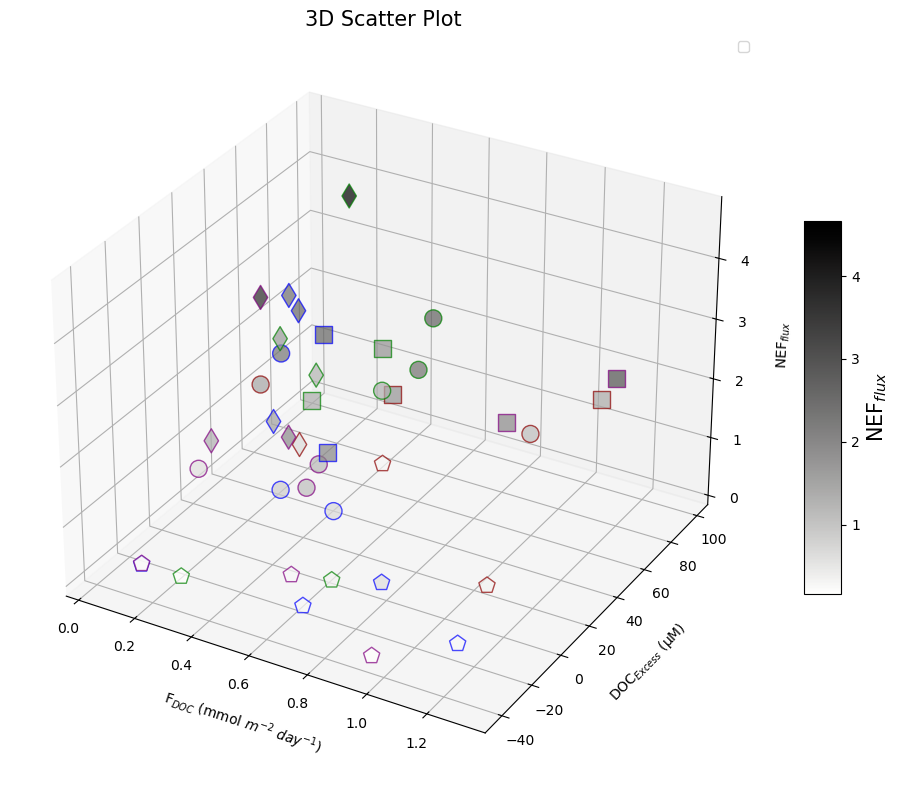

In [65]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors

def xyzplot_3d(df):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Filter and prepare data
    sub = df.dropna(subset=[x_var, y_var, z_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]

    # Set colormap range
    vmin = data[z_var].min()
    vmax = data[z_var].max()

    # Plot data
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            if not subset.empty:
                ax.scatter(
                    subset[x_var], subset[y_var], subset[z_var],
                    c=subset[z_var], cmap=z_var_color,
                    vmin=vmin, vmax=vmax,
                    marker=marker_map.get(region, 'o'),
                    s=150, alpha=0.7,
                    edgecolor=color_map.get(campaign, 'grey'),
                    label=f"{label_map.get(campaign, campaign)} ({region})"
                )

    # Add color bar
    cbar = fig.colorbar(
        plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)),
        ax=ax, shrink=0.5, aspect=10
    )
    cbar.set_label(z_var_lab, size=15)

    # Labels and title
    ax.set_xlabel(x_var_lab, labelpad=10)
    ax.set_ylabel(y_var_lab, labelpad=10)
    ax.set_zlabel(z_var_lab, labelpad=10)
    ax.set_title(titel, size=15)

    # Add legend
    ax.legend('')

    plt.tight_layout()
    plt.show()

# Variables
x_var = 'pw_flux_doc'
y_var = 'aou_ceq_doc_diff'
z_var = 'doc_tdn_seds_over_water_5cm'

x_var_lab = r'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'
y_var_lab = r'DOC$_{Excess}$ (µM)'
z_var_lab = r'NEF$_{flux}$'

colors = ["blue", "black", "red"]  # Replace with desired colors
z_var_color = mcolors.LinearSegmentedColormap.from_list("three_color_gradient", colors, N=3)
z_var_color = cmo.gray.reversed()

titel = "3D Scatter Plot"
xyzplot_3d(data_wc_bbl)


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\1509199862.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub['Cluster'] = clusters


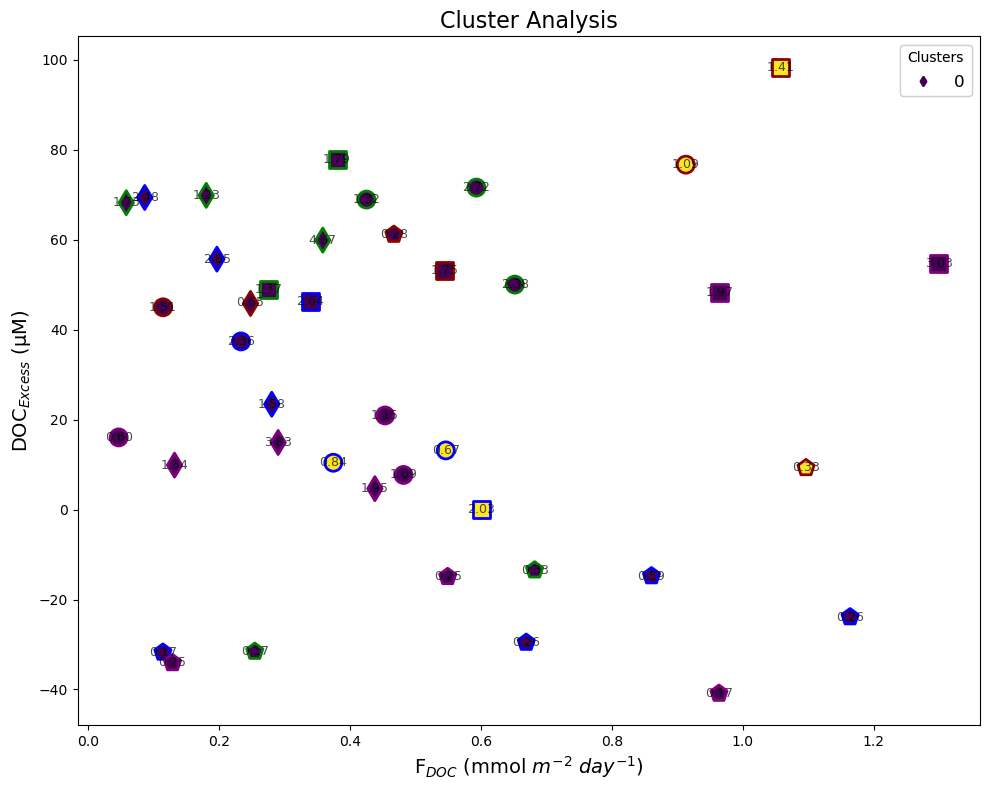

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Assuming `data_wc_bll` is your DataFrame
# Replace this with loading your actual data

# Variables
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC$_{Excess}$ (µM)'

x_var = 'pw_flux_doc'
x_var_lab = r'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'

z_var = 'doc_tdn_seds_over_water_5cm'
z_var_lab = r'DOC:TDN $\frac{\text{bottom waters}}{\text{sediments 0-5 cm interval}}$'

# Normalize the data for clustering
scaler = StandardScaler()
sub = data_wc_bbl.dropna(subset=[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign'])
scaled_data = scaler.fit_transform(sub[[x_var, y_var, z_var]])

# Perform K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(scaled_data)

# Add cluster labels to the DataFrame
sub['Cluster'] = clusters

# Plot the data with clusters
fig, ax = plt.subplots(figsize=(10, 8))

for campaign in sub['Campaign'].unique():
        for region in sub['rgn'].unique():
            subset = sub[(sub['Campaign'] == campaign) & (sub['rgn'] == region)]
            if not subset.empty:
                scatter = ax.scatter(
                    subset[x_var], subset[y_var],
                    c=subset['Cluster'],
                    cmap='viridis',
                    marker=marker_map.get(region, 'o'),
                    s=150,
                    edgecolor=color_map.get(campaign, 'grey'),
                    linewidth = 2,
                    label=f"{label_map.get(campaign, campaign)} ({region})"
                )

# Add labels and title
ax.set_xlabel(x_var_lab, fontsize=14)
ax.set_ylabel(y_var_lab, fontsize=14)
ax.set_title('Cluster Analysis', fontsize=16)

# Create a colorbar for the clusters
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters", fontsize=12)
ax.add_artist(legend1)

# Optionally annotate the points with the z_var
for i, row in sub.iterrows():
    ax.text(
        row[x_var], row[y_var], f"{row[z_var]:.2f}",
        fontsize=9, ha='center', va='center', alpha=0.7
    )

plt.tight_layout()
plt.show()

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


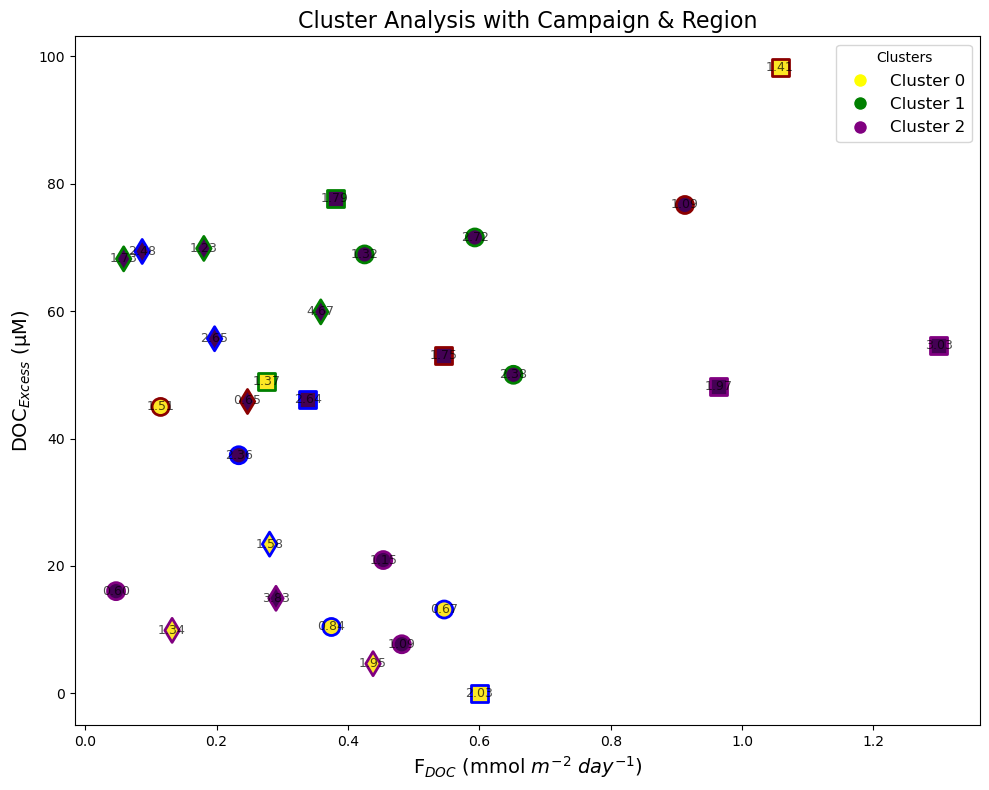

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Assuming `data_wc_bll` is your DataFrame
# Replace this with loading your actual data

# Variables
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC$_{Excess}$ (µM)'

x_var = 'pw_flux_doc'
x_var_lab = r'F$_{DOC}$ (mmol $m^{-2}$ $day^{-1})$'

z_var = 'doc_tdn_seds_over_water_5cm'
z_var_lab = r'DOC:TDN $\frac{\text{bottom waters}}{\text{sediments 0-5 cm interval}}$'

# Subset and normalize the data
sub = data_wc_bbl.dropna(subset=[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign'])
sub = sub[sub['rgn']!= 'Slope']
scaler = StandardScaler()
scaled_data = scaler.fit_transform(sub[[x_var, y_var, z_var]])

# Perform K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(scaled_data)

# Add cluster labels to the DataFrame
sub['Cluster'] = clusters

# Plot the data with clusters
fig, ax = plt.subplots(figsize=(10, 8))

# Initialize a set for legend entries
legend_entries = []

for campaign in sub['Campaign'].unique():
    for region in sub['rgn'].unique():
        subset = sub[(sub['Campaign'] == campaign) & (sub['rgn'] == region)]
        if not subset.empty:
            scatter = ax.scatter(
                subset[x_var], subset[y_var],
                c=subset['Cluster'],  # Cluster colors
                cmap='viridis',  # Colormap for clusters
                marker=marker_map.get(region, 'o'),
                s=150,
                edgecolor=color_map.get(campaign, 'grey'),
                linewidth=2,
                label=f"{label_map.get(campaign, campaign)} ({region})"
            )

# Manually create legend for clusters only
cluster_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2']
cluster_colors = ['yellow', 'green', 'purple']  # Adjust these colors to match the cmap

# Create legend handles for the clusters
cluster_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=c, markersize=10, label=label)
                   for c, label in zip(cluster_colors, cluster_labels)]

ax.legend(handles=cluster_handles, title="Clusters", fontsize=12)

# Optionally annotate the points with the z_var
for i, row in sub.iterrows():
    ax.text(
        row[x_var], row[y_var], f"{row[z_var]:.2f}",
        fontsize=9, ha='center', va='center', alpha=0.7
    )

# Add labels and title
ax.set_xlabel(x_var_lab, fontsize=14)
ax.set_ylabel(y_var_lab, fontsize=14)
ax.set_title('Cluster Analysis with Campaign & Region', fontsize=16)

plt.tight_layout()
plt.show()


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


SLOPE
Intercept (TLS): -15.62779288737195
Slope (TLS): 80.27012615440309
R2 (TLS): 0.04728747617667871



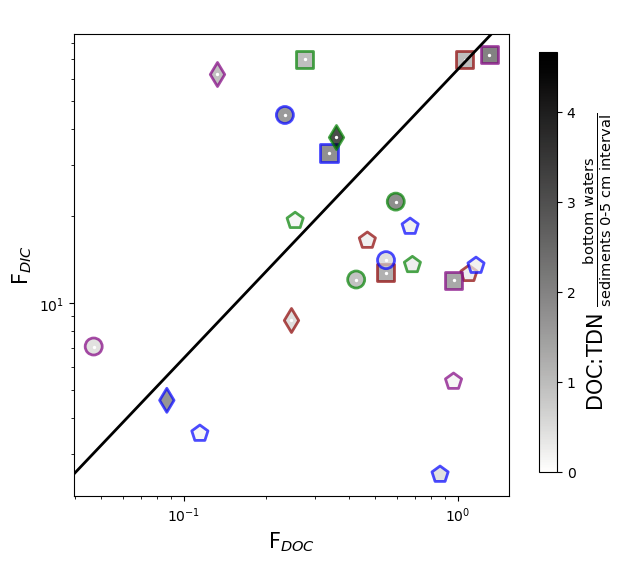

In [68]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    vmin = 0
    vmax = data[z_var].max()
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    axes.scatter(x=X, y=y, color = 'white', s = 2)
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')

    axes.set_xscale("log")
    axes.set_yscale("log")

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'flux_dic'
y_var_lab = 'F$_{DIC}$'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var_lab = r'DOC:TDN $\frac{\text{bottom waters}}{\text{sediments 0-5 cm interval}}$'
z_var = 'doc_tdn_seds_over_water_5cm'
z_var_color = cmo.gray.reversed()

#titel = "Water Column"
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


SLOPE
Intercept (TLS): -2.4934614129001886
Slope (TLS): 88.39749599415049
R2 (TLS): 0.1819823328050536



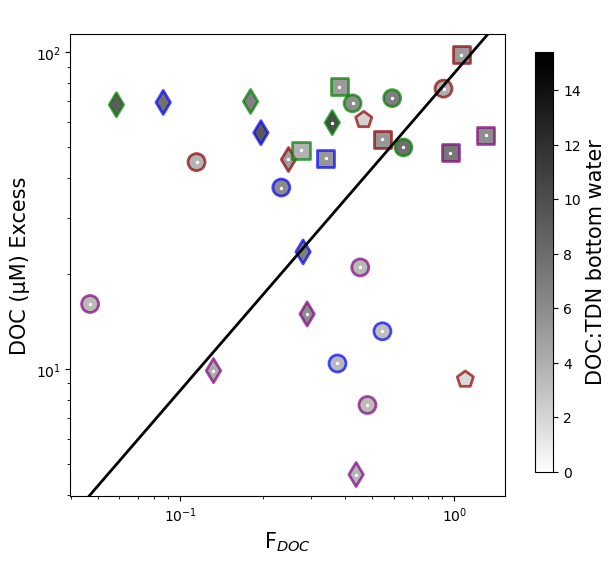

In [69]:

y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var = 'DOC:TDN'
z_var_lab = 'DOC:TDN bottom water'
z_var_color = cmo.gray.reversed()

#titel = "Water Column"
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


SLOPE
Intercept (TLS): 2.4934523726283118
Slope (TLS): 74.526203523555
R2 (TLS): 0.05470171571450638



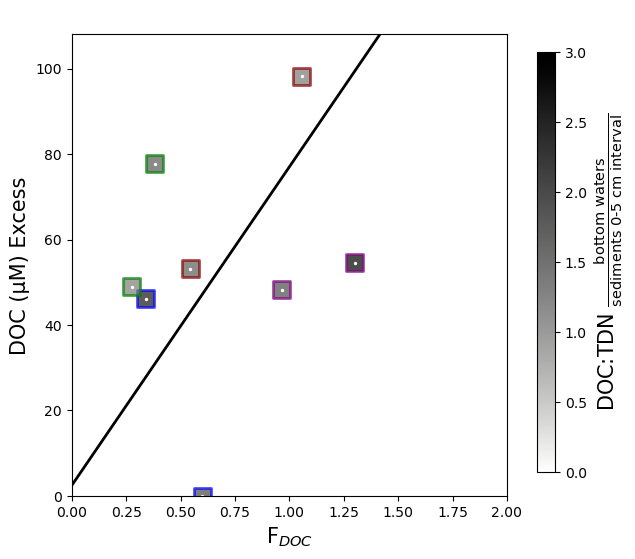

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


SLOPE
Intercept (TLS): -8.482194436653643
Slope (TLS): 105.6877331503531
R2 (TLS): 0.21004176832667684



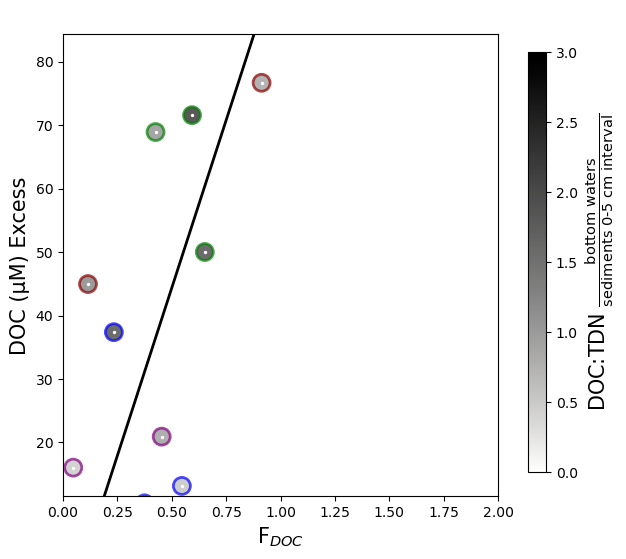

In [70]:
def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    #vmin = data[z_var].min()
    #vmax = data[z_var].max()

    vmin = 0
    vmax = 3
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    axes.scatter(x=X, y=y, color = 'white', s = 2)
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')

    axes.set_xlim(0, 2)
    axes.set_ylim(data[y_var].min()*1.5, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'aou_ceq_doc_diff'
y_var_lab = r'DOC (µM) Excess'

x_var = 'pw_flux_doc'
x_var_lab = 'F$_{DOC}$'

z_var_lab = r'DOC:TDN $\frac{\text{bottom waters}}{\text{sediments 0-5 cm interval}}$'
z_var = 'doc_tdn_seds_over_water_5cm'

colors = ["blue", "black", "red"]  # Replace these with any colors you want
import matplotlib.colors as mcolors
z_var_color = mcolors.LinearSegmentedColormap.from_list("three_color_gradient", colors, N=3)

z_var_color = cmo.gray.reversed()

xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['rgn'] == 'Proximal Shelf'])
xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['rgn'] == 'Distal Shelf'])

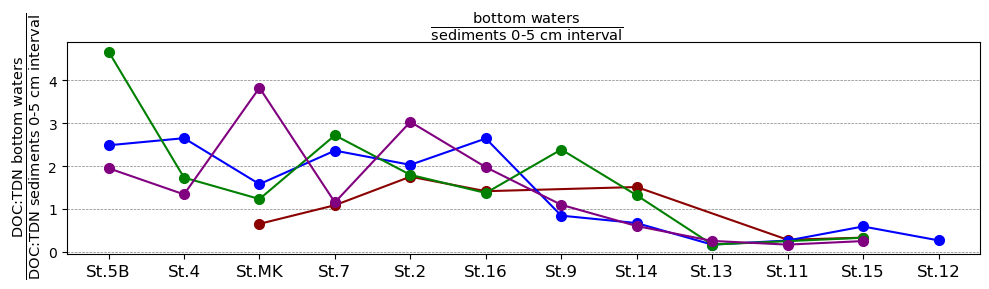

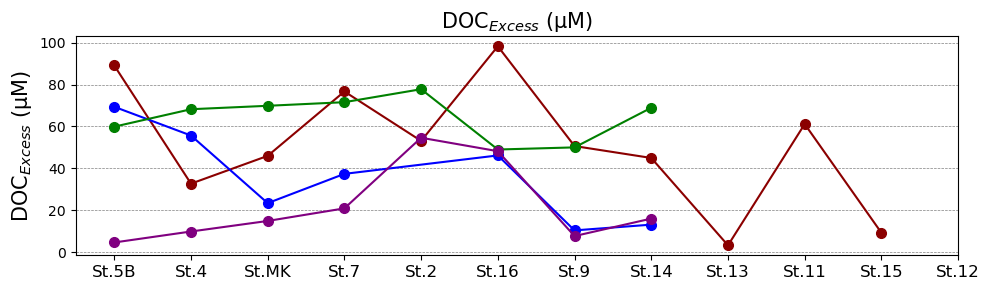

In [71]:
categories = ['St.5B', 'St.4', 'St.MK', 'St.7', 'St.2', 'St.16', 'St.9', 'St.14', 'St.13', 'St.11', 'St.15', 'St.12']
subcategories = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

def line_plot_stock(data_f, flux_col, ylabels, title): 
    df = data_f.dropna(subset=[flux_col])
    df = df[df[flux_col] > 0 ]

    color_map = {
        'GOM2021': 'darkred',
        'GOM21FA': 'blue',
        'GOM22SP': 'green',
        'GOM22SU': 'purple'
    }

    label_map = {
        'GOM2021': 'Summer 2021',
        'GOM21FA': 'Fall 2021',
        'GOM22SP': 'Spring 2022',
        'GOM22SU': 'Summer 2022'
    }

    barWidth = 0  # Adjusted bar width for better spacing
    fig, ax = plt.subplots(figsize=(10, 3))

    # Adjusted r for spacing between groups
    r = np.arange(len(categories))  # x locations for the groups
    positions = [r + i * barWidth for i in range(len(subcategories))]

    for pos, subcat in zip(positions, subcategories):
        values = []
        x_ticks = []
        for idx, cat in enumerate(categories):
            value = df[(df['Location'] == cat) & (df['Campaign'] == subcat)][flux_col].values
            if len(value) > 0:
                values.append(value[0])
                x_ticks.append(idx)
            else:
                continue  # Skip if there is no value
        
        # Plot only if there are values to plot
        if values:
            ax.plot(np.array(x_ticks) + barWidth * (subcategories.index(subcat) - len(subcategories)/2), values,
                    color=color_map[subcat], label=label_map[subcat], markersize=7, marker='o')

    #ax.set_ylim(-20, y_min_max_val)
    ax.set_ylabel(ylabels, size=15)
    ax.set_title(title, size=15)
    ax.set_xticks(r)  # Use the positions where data was actually plotted
    ax.set_xticklabels([cat for cat in categories], size=12)
    ax.grid(True, axis='y', color='gray', linestyle='--', linewidth=0.5)  # Customizes color, style, and width
    ax.legend().remove()

    fig.set_facecolor('w')
    plt.tight_layout()

    plt.savefig(f'../Dissertation_projects/Figures/Flux_figures/{save_name}.png')

    plt.show()

# Define the parameters

y_min_max_val = 120

tlabes = r' $\frac{\text{bottom waters}}{\text{sediments 0-5 cm interval}}$'
ylabes = r' $\frac{\text{DOC:TDN bottom waters}}{\text{DOC:TDN sediments 0-5 cm interval}}$'
data_f = data_wc_bbl
flux_col = "doc_tdn_seds_over_water_5cm"
save_name = 'pw_doc_excess_ind_line_plot'

line_plot_stock(data_f, flux_col, ylabes, tlabes)

y_min_max_val = 120

tlabes = r'DOC$_{Excess}$ (µM)'
ylabes = r'DOC$_{Excess}$ (µM)'
data_f = data_wc_bbl
flux_col = "aou_ceq_doc_diff"
save_name = 'Nanannnan'

line_plot_stock(data_f, flux_col, ylabes, tlabes)

z_var = 'aou_ceq_doc_diff'
z_var_lab = r'DOC$_{Excess}$ (µM)'



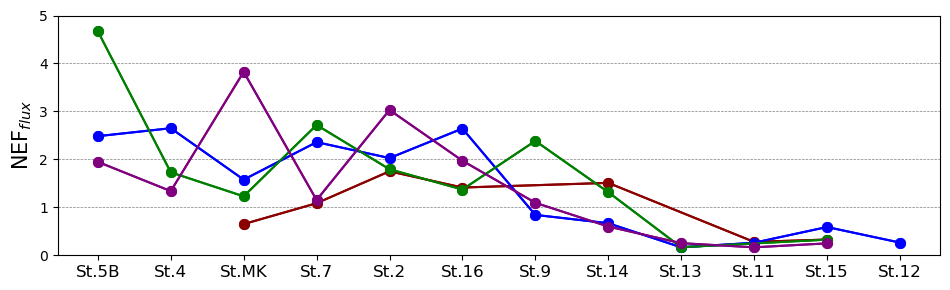

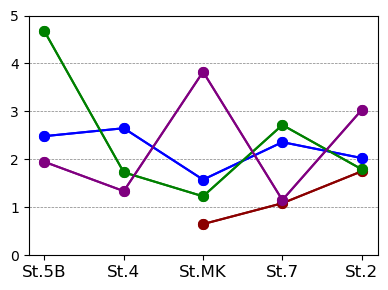

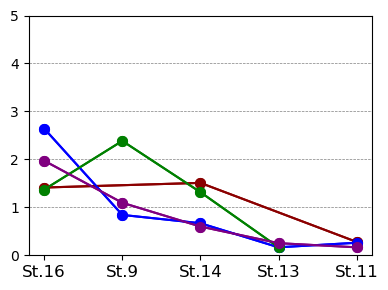

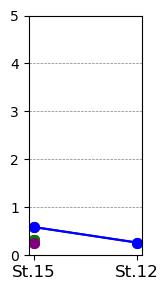

In [72]:
categories = ['St.5B', 'St.4', 'St.MK', 'St.7', 'St.2', 'St.16', 'St.9', 'St.14', 'St.13', 'St.11', 'St.15', 'St.12']
subcategories = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']


import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def line_plot_stock(data_f, flux_col, ylabels, title): 
    df = data_f.dropna(subset=[flux_col])
    df = df[df[flux_col] > 0 ]

    color_map = {
        'GOM2021': 'darkred',
        'GOM21FA': 'blue',
        'GOM22SP': 'green',
        'GOM22SU': 'purple'
    }

    label_map = {
        'GOM2021': 'Summer 2021',
        'GOM21FA': 'Fall 2021',
        'GOM22SP': 'Spring 2022',
        'GOM22SU': 'Summer 2022'
    }

    barWidth = 0  # Adjusted bar width for better spacing
    fig, ax = plt.subplots(figsize=(8/10*len(categories), 3))

    # Adjusted r for spacing between groups
    r = np.arange(len(categories))  # x locations for the groups
    positions = [r + i * barWidth for i in range(len(subcategories))]

    for pos, subcat in zip(positions, subcategories):
        values = []
        errors = []
        x_ticks = []
        for idx, cat in enumerate(categories):
            value = df[(df['Location'] == cat) & (df['Campaign'] == subcat)][flux_col].values
            error = df[(df['Location'] == cat) & (df['Campaign'] == subcat)][error_col].values
            if len(value) > 0:
                values.append(value[0])
                errors.append(error[0])
                x_ticks.append(idx)
            else:
                continue  # Skip if there is no value
        
        # Plot only if there are values to plot
        if values:
            ax.plot(np.array(x_ticks) + barWidth * (subcategories.index(subcat) - len(subcategories)/2), values,
                    color=color_map[subcat], label=label_map[subcat], markersize=7, marker='o')
            ax.errorbar(np.array(x_ticks) + barWidth * (subcategories.index(subcat) - len(subcategories)/2), values, yerr= errors, xerr=None,
                    color=color_map[subcat], label=label_map[subcat], markersize=7, marker='o')

    ax.set_ylim(0, y_min_max_val)
    ax.set_ylabel(ylabels, size=15)
    ax.set_title(title, size=15)
    ax.set_xticks(r)  # Use the positions where data was actually plotted
    ax.set_xticklabels([cat for cat in categories], size=12)
    ax.grid(True, axis='y', color='gray', linestyle='--', linewidth=0.5)  # Customizes color, style, and width
    ax.legend().remove()

    fig.set_facecolor('w')
    plt.tight_layout()

    plt.savefig(f'../Dissertation_projects/Figures/DOC_paper_figs/{save_name}.png')

    plt.show()

# Define the parameters
y_min_max_val = 5

ylabes = r'NEF$_{flux}$'
tlabes = r''
data_f = data_wc_bbl
error_col = "doc_tdn_seds_over_water_5cm_err"
flux_col = "doc_tdn_seds_over_water_5cm"
save_name = 'doc_tdn_seds_over_water_5cm'

line_plot_stock(data_f, flux_col, ylabes, tlabes)

categories = ['St.5B', 'St.4', 'St.MK', 'St.7', 'St.2']
subcategories = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

ylabes = r''
tlabes = ''
data_f = data_wc_bbl
error_col = "doc_tdn_seds_over_water_5cm_err"
flux_col = "doc_tdn_seds_over_water_5cm"
save_name = 'doc_tdn_seds_over_water_5cm_1'

line_plot_stock(data_f, flux_col, ylabes, tlabes)

categories = [ 'St.16', 'St.9', 'St.14', 'St.13', 'St.11']
subcategories = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

# Define the parameters
ylabes = '' 
tlabes = ''
data_f = data_wc_bbl
error_col = "doc_tdn_seds_over_water_5cm_err"
flux_col = "doc_tdn_seds_over_water_5cm"
save_name = 'doc_tdn_seds_over_water_5cm_2'

line_plot_stock(data_f, flux_col, ylabes, tlabes)

def line_plot_stock(data_f, flux_col, ylabels, title): 
    df = data_f.dropna(subset=[flux_col])
    df = df[df[flux_col] > 0 ]

    color_map = {
        'GOM2021': 'darkred',
        'GOM21FA': 'blue',
        'GOM22SP': 'green',
        'GOM22SU': 'purple'
    }

    label_map = {
        'GOM2021': 'Summer 2021',
        'GOM21FA': 'Fall 2021',
        'GOM22SP': 'Spring 2022',
        'GOM22SU': 'Summer 2022'
    }

    barWidth = 0  # Adjusted bar width for better spacing
    fig, ax = plt.subplots(figsize=(len(categories)*8/9, 3))

    # Adjusted r for spacing between groups
    r = np.arange(len(categories))  # x locations for the groups
    positions = [r + i * barWidth for i in range(len(subcategories))]

    for pos, subcat in zip(positions, subcategories):
        values = []
        errors = []
        x_ticks = []
        for idx, cat in enumerate(categories):
            value = df[(df['Location'] == cat) & (df['Campaign'] == subcat)][flux_col].values
            error = df[(df['Location'] == cat) & (df['Campaign'] == subcat)][error_col].values
            if len(value) > 0:
                values.append(value[0])
                errors.append(error[0])
                x_ticks.append(idx)
            else:
                continue  # Skip if there is no value
        
        # Plot only if there are values to plot
        if values:
            ax.plot(np.array(x_ticks) + barWidth * (subcategories.index(subcat) - len(subcategories)/2), values,
                    color=color_map[subcat], label=label_map[subcat], markersize=7, marker='o')
            ax.errorbar(np.array(x_ticks) + barWidth * (subcategories.index(subcat) - len(subcategories)/2), values, yerr= errors, xerr=None,
                    color=color_map[subcat], label=label_map[subcat], markersize=7, marker='o')

    ax.set_ylim(0, y_min_max_val)
    ax.set_ylabel(ylabels, size=15)
    ax.set_title(title, size=15)
    ax.set_xticks(r)  # Use the positions where data was actually plotted
    ax.set_xticklabels([cat for cat in categories], size=12)
    ax.grid(True, axis='y', color='gray', linestyle='--', linewidth=0.5)  # Customizes color, style, and width
    ax.legend().remove()

    fig.set_facecolor('w')
    plt.tight_layout()

    plt.savefig(f'../Dissertation_projects/Figures/DOC_paper_figs/{save_name}.png')

    plt.show()

# Define the parameters

categories = [ 'St.15', 'St.12']
subcategories = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']

# Define the parameters
ylabes = '' 
tlabes = ''
data_f = data_wc_bbl
error_col = "doc_tdn_seds_over_water_5cm_err"
flux_col = "doc_tdn_seds_over_water_5cm"
save_name = 'doc_tdn_seds_over_water_5cm_3'

line_plot_stock(data_f, flux_col, ylabes, tlabes)


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


SLOPE
Intercept (TLS): 14.124871399151518
Slope (TLS): -1.3405587501508116
R2 (TLS): 0.04314478857347546



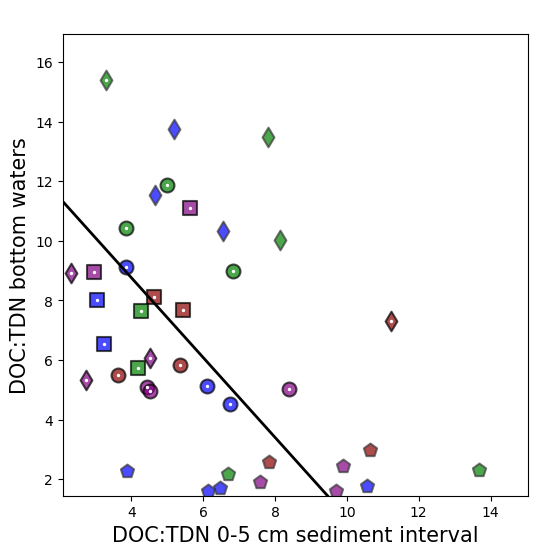

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


SLOPE
Intercept (TLS): 15.023627107501964
Slope (TLS): -1.5774677801200712
R2 (TLS): 0.05143269870511403



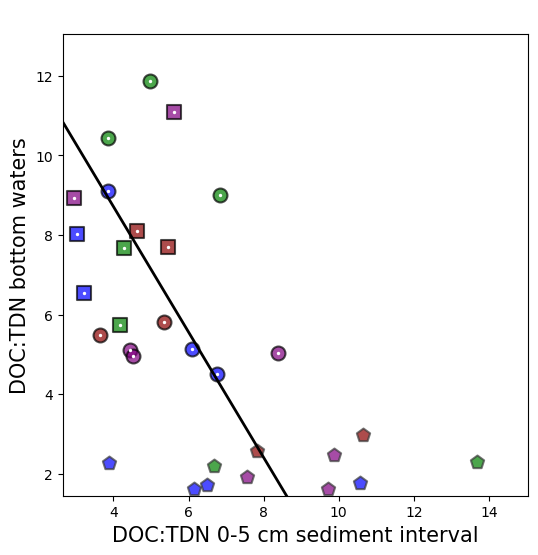

In [73]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            code = subset['code'].iloc[0]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor= color_map_2.get(code, 'black'), 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False,)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    axes.scatter(x=X, y=y, color = 'white', s = 2)

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")
    
    axes.axline((0,0+intercept), (1,(1*slope)+intercept), linewidth=2, color='black', linestyle='-')

    axes.set_xlim(data[x_var].min()*.9, data[x_var].max()*1.1)
    axes.set_ylim(data[y_var].min()*.9, data[y_var].max()*1.1)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'DOC:TDN'
y_var_lab = 'DOC:TDN bottom waters'

x_var_lab = 'DOC:TDN 0-5 cm sediment interval'
x_var = 'doc_tdn_seds_5cm'

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

xyplotcolor_cat_color(data_wc_bbl[data_wc_bbl['rgn'] != 'Hypoxic Shelf'])

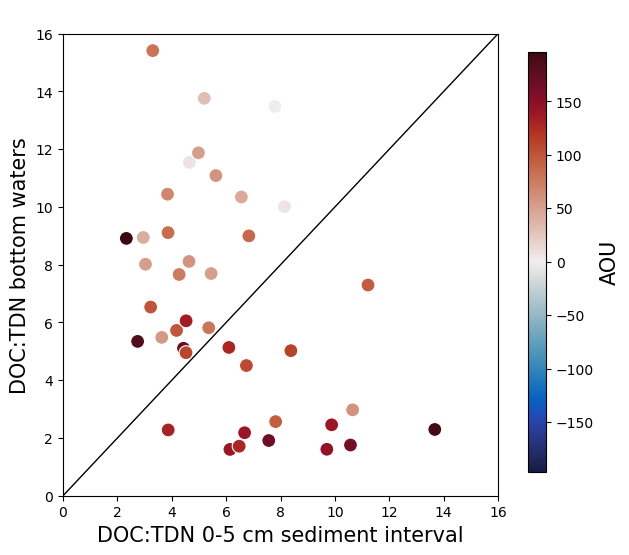

In [74]:


def xyplotcolor_flux_pred(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var]]
    colors = data[z_var].astype(float)

    vmin = data[z_var].max()*-1
    vmax = data[z_var].max()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    sns.scatterplot(x=x_var, y=y_var, c=colors, cmap=z_var_color, s=100, data=data, ax=axes, legend=False, vmin=vmin, vmax=vmax)
    #sns.lineplot(x=X[x_var], y=model.predict(X), ax=axes, color='black')

    axes.set_xlabel(x_var.replace(x_var, x_var_lab), size=15)
    axes.set_ylabel(y_var.replace(y_var, y_var_lab), size=15)

    axes.set_title(titel, size = 15)
    axes.axline(( 0,0), (20,20), linewidth=1, color='black')

    axes.set_xlim(0, 16)
    axes.set_ylim(0, 16)
    
    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)

    #axes.axline(( 0,0), (150,150), linewidth=1, color='black')

    # Show the plot
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

y_var = 'DOC:TDN'
y_var_lab = 'DOC:TDN bottom waters'

x_var_lab = 'DOC:TDN 0-5 cm sediment interval'
x_var = 'doc_tdn_seds_5cm'

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.balance

titel = "   "
#save_name = 'aou_ceq_doc_DOC_uM_sal_corrected_All_WC'
xyplotcolor_flux_pred(data_wc_bbl)

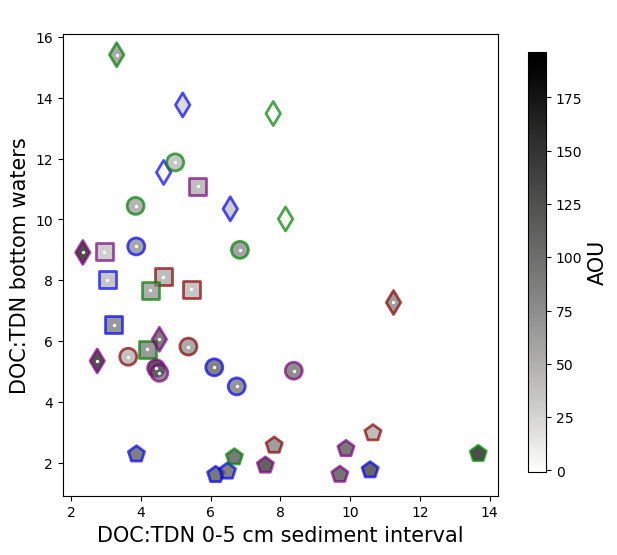

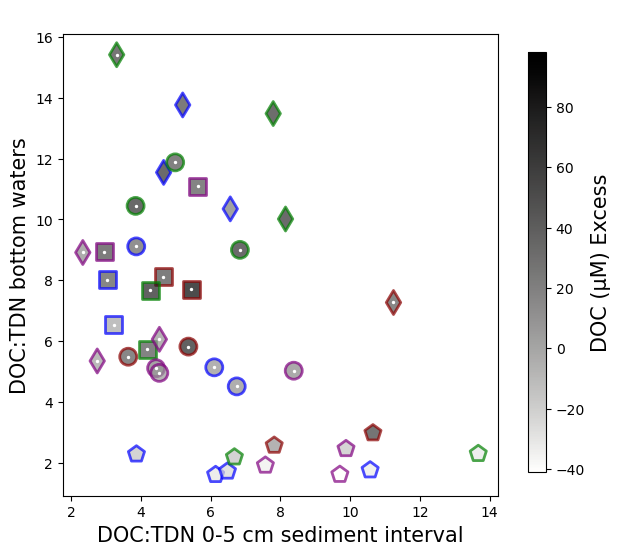

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3657467472.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['nefflux'] = data_wc_bbl['doc_tdn_seds_over_water_5cm'] * data_wc_bbl['pw_flux_doc']


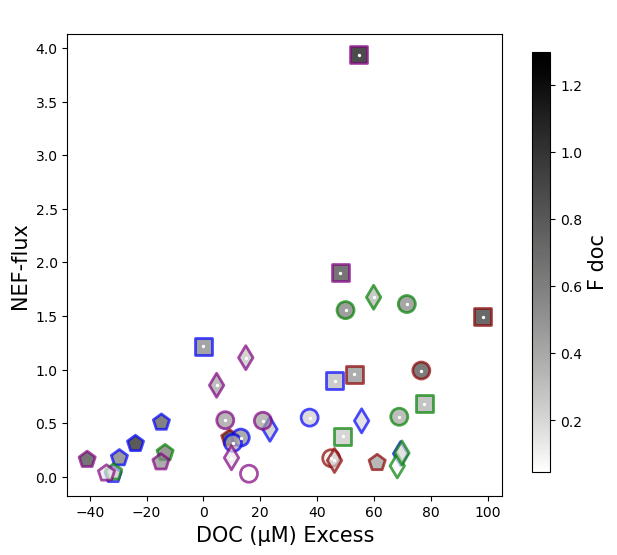

In [75]:
def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code', 'Campaign']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)

    vmin = data[z_var].min()
    vmax = data[z_var].max()
    
    for campaign in data['Campaign'].unique():
        for region in data['rgn'].unique():
            subset = data[(data['Campaign'] == campaign) & (data['rgn'] == region)]
            colors = subset[z_var].astype(float)
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                c= colors,
                cmap = z_var_color,
                vmin = vmin,
                vmax = vmax,
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=150, 
                edgecolor= color_map.get(campaign, 'grey'), 
                linewidth=2, alpha = 0.7, 
                ax=axes, 
                legend=False,)

    # Add a color bar for the depth on the right side of the figure
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=z_var_color, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
    cbar.ax.set_ylabel(z_var_lab, size=15)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    subset_slope = data[data['rgn'] != 'Slope']
    subset_slope = subset_slope[subset_slope['sal'] >= 33]
    X = subset_slope[[x_var]]
    y = subset_slope[y_var]

    axes.scatter(x=X, y=y, color = 'white', s = 2)
    
    #axes.axline(( 0,0), (20,20), linewidth=1, color='black')

    #axes.set_xlim(0, 17)
    #axes.set_ylim(0, 17)

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

    
y_var = 'DOC:TDN'
y_var_lab = 'DOC:TDN bottom waters'

x_var_lab = 'DOC:TDN 0-5 cm sediment interval'
x_var = 'doc_tdn_seds_5cm'

z_var = 'aou'
z_var_lab = 'AOU'
z_var_color = cmo.gray.reversed()

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

z_var = 'aou_ceq_doc_diff'
z_var_lab = r'DOC (µM) Excess'

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

data_wc_bbl['nefflux'] = data_wc_bbl['doc_tdn_seds_over_water_5cm'] * data_wc_bbl['pw_flux_doc'] 

y_var = 'nefflux'
y_var_lab = 'NEF-flux'

x_var = 'aou_ceq_doc_diff'
x_var_lab = r'DOC (µM) Excess'

z_var = 'pw_flux_doc'
z_var_lab = 'F doc'
z_var_color = cmo.gray.reversed()

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(data_wc_bbl)

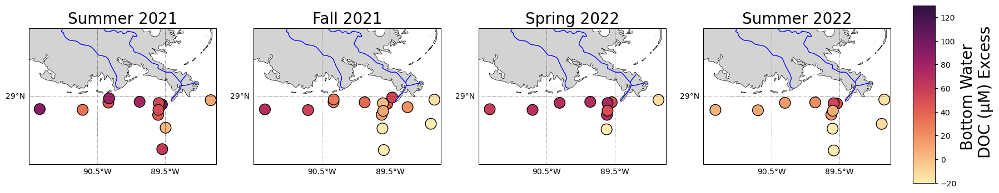

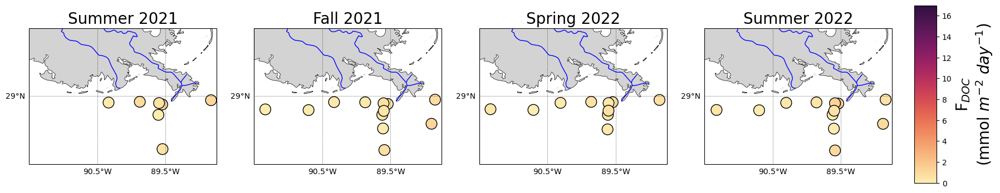

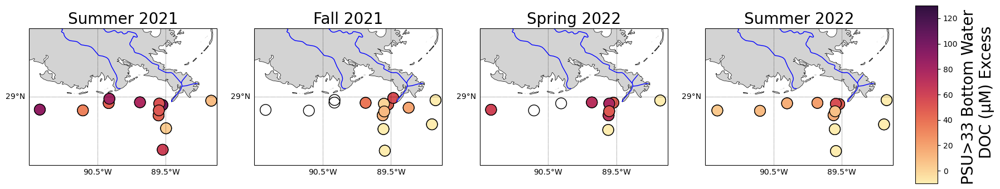

In [76]:
df_ow = pd.read_csv('../Dissertation_projects/Data/TOC/TOC_GOM.csv', sep=',', index_col=0)
df_ow = df_ow[df_ow['Type'] == 'PW']
df_ow = df_ow[df_ow['Depth'] == 0]
df_ow['code'] = df_ow['Location'] + '_' + df_ow['Campaign']

df_ow.index = df_ow['code']

df_ow = df_ow.drop('St.9_GOM2021', axis=0)
df_ow = df_ow.drop('St.5B_GOM2021', axis=0)
df_ow = df_ow.drop('St.4_GOM2021', axis=0)
df_ow = df_ow.drop('St.14_GOM2021', axis=0)


df_ow['NPOC_ow'] = df_ow['NPOC_uM']

df_ow = df_ow['NPOC_ow']

df = pd.read_csv('../Dissertation_projects/Data/Stats_data_sets/bottom_water_DOC.csv', sep=',', index_col=0)

df['NPOC_ow'] = df_ow

df['aou-ceq_doc_diff'] = data_wc_bbl['aou_ceq_doc_diff']
df['pw_flux_doc'] = data_wc_bbl['pw_flux_doc']


lat_top=30
lat_bot=28
lon_left=-91.5
lon_rigth=-88.75
extent=[lon_left, lon_rigth, lat_bot, lat_top]

# set resolution of the features in map: '10m', '50m', or '110m'.  
# If you do this the first time it will take a while downloading the coastline 
# and other features. In the future it will be faster
res = '10m'

def plot_mapbase(extent, ax=None, res='10m', projection=ccrs.PlateCarree()):
    if ax is None:
        fig = plt.figure(figsize=(10,5)) # set fig size
        ax = fig.add_subplot(111, projection=projection)
        
    ax.set_extent(extent)
    ax.coastlines(res)
    ax.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='land',
                                                facecolor='lightgrey', 
                                                scale=res)) 
    ax.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='rivers_lake_centerlines',
                                                edgecolor='blue',
                                                facecolor='none',
                                                scale=res))
    gl = ax.gridlines(xlocs=np.arange(lon_left, lon_rigth+1),
                      ylocs=np.arange(lat_bot, lat_top+1),
                      draw_labels=True, 
                      linewidth=0.5, color='k', linestyle=':')
    gl.top_labels = gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    return ax


def map_doc_excess(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.matter,
                                   s=200,
                                   vmin=-20,  # Set global min and max for colormap
                                   vmax=130,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()


data_f = df
topic = 'aou-ceq_doc_diff'
cb_name = 'Bottom Water \n DOC (µM) Excess'
map_doc_excess(data_f, topic, cb_name)


def map_doc_excess(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.matter,
                                   s=200,
                                   vmin=0,  # Set global min and max for colormap
                                   vmax=17,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()


data_f = df
topic = 'pw_flux_doc'
cb_name = r'F$_{DOC}$ '+'\n'+'(mmol $m^{-2}$ $day^{-1})$'
map_doc_excess(data_f, topic, cb_name)


def map_doc_excess(data_f, topic, cb_name):
    camps = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.ravel()  # Flatten the 2x2 grid to access each subplot with a single index
    for i, camp in enumerate(camps):

        sal_subset = data_f[data_f['camp'] == camp]
        mappable = axes[i].scatter(sal_subset['longitude_bottom'], sal_subset['latitude_bottom'],
                                   edgecolor='k',
                                   color="None",
                                   s=200,
                                   transform=ccrs.PlateCarree())
        
        df_subset = data_f[data_f['camp'] == camp].dropna(subset=[topic])    
        plot_mapbase(extent, ax=axes[i])
        mappable = axes[i].scatter(df_subset['longitude_bottom'], df_subset['latitude_bottom'],
                                   c=df_subset[topic],
                                   edgecolor='k',
                                   cmap=cmo.matter,
                                   s=200,
                                   vmin=-10,  # Set global min and max for colormap
                                   vmax=130,
                                   transform=ccrs.PlateCarree())
    
        label_map = {
            'GOM2021': 'Summer 2021',
            'GOM21FA': 'Fall 2021',
            'GOM22SP': 'Spring 2022',
            'GOM22SU': 'Summer 2022'
        }
    
        axes[i].set_title(label_map[camp], size = 20)
    
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.set_label(cb_name, size=20, color='black')
    cb.ax.tick_params(labelcolor='black') 
    cb.ax.tick_params(labelsize=10)
    fig.set_facecolor('w')
    plt.show()

df['aou_ceq_doc_diff'] = df['aou-ceq_doc_diff'].where(df['sal_bottom'] >= 33, np.nan)

data_f = df
topic = 'aou_ceq_doc_diff'
cb_name = 'PSU>33 Bottom Water \n DOC (µM) Excess'
map_doc_excess(data_f, topic, cb_name)


In [77]:

print('Sal:DOC Summer 2021')
print("Intercept (TLS):", results_sum_21['intercept'])
print("Slope (TLS):", results_sum_21['slope'])
print("R2 (TLS):", results_sum_21['r']*results_sum_21['r'])
print("")
print('Sal:DOC Fall 2021')
print("Intercept (TLS):", results_fal_21['intercept'])
print("Slope (TLS):", results_fal_21['slope'])
print("R2 (TLS):", results_fal_21['r']*results_fal_21['r'])
print("")
print('Sal:DOC Spring 2022')
print("Intercept (TLS):", results_spr_22['intercept'])
print("Slope (TLS):", results_spr_22['slope'])
print("R2 (TLS):", results_spr_22['r']*results_spr_22['r'])
print("")
print('Sal:DOC Summer 2022')
print("Intercept (TLS):", results_sum_22['intercept'])
print("Slope (TLS):", results_sum_22['slope'])
print("R2 (TLS):", results_sum_22['r']*results_sum_22['r'])
print("")

Sal:DOC Summer 2021
Intercept (TLS): 527.8523060461165
Slope (TLS): -12.161669322562648
R2 (TLS): 0.42721174352044244

Sal:DOC Fall 2021
Intercept (TLS): 480.7379206756806
Slope (TLS): -11.547418494334138
R2 (TLS): 0.6911347083611722

Sal:DOC Spring 2022
Intercept (TLS): 420.387042791628
Slope (TLS): -9.56309985570033
R2 (TLS): 0.3476624442032016

Sal:DOC Summer 2022
Intercept (TLS): 537.5956744012946
Slope (TLS): -12.781380320934177
R2 (TLS): 0.5176257364969656



In [78]:
data_wc_bbl['DOC_percent_ex_bot_waters'] = data_wc_bbl['aou_ceq_doc_diff'] / data_wc_bbl['NPOC_uM'] * 100

mean_leak_percent = data_wc_bbl.groupby(['rgn', 'Campaign'])['DOC_percent_ex_bot_waters'].mean()
print(mean_leak_percent)
mean_leak_percent = data_wc_bbl.groupby(['Campaign'])['DOC_percent_ex_bot_waters'].mean()
print(mean_leak_percent)
mean_leak_percent = data_wc_bbl.groupby(['rgn'])['DOC_percent_ex_bot_waters'].mean()
print(mean_leak_percent)
print(data_wc_bbl['DOC_percent_ex_bot_waters'].min())
print(data_wc_bbl['DOC_percent_ex_bot_waters'].max())
print(data_wc_bbl['DOC_percent_ex_bot_waters'].mean())

rgn             Campaign
Distal Shelf    GOM2021     66.189121
                GOM21FA     28.663525
                GOM22SP     68.293374
                GOM22SU     20.831827
Hypoxic Shelf   GOM2021     55.475419
                GOM21FA     37.118979
                GOM22SP     54.932795
                GOM22SU     10.450096
Proximal Shelf  GOM2021     72.685892
                GOM21FA     40.668862
                GOM22SP     62.252779
                GOM22SU     69.331932
Slope           GOM2021     25.982970
                GOM21FA    -50.159518
                GOM22SP    -37.260802
                GOM22SU    -54.072422
Name: DOC_percent_ex_bot_waters, dtype: float64
Campaign
GOM2021    53.649144
GOM21FA    13.851094
GOM22SP    41.966246
GOM22SU     1.351662
Name: DOC_percent_ex_bot_waters, dtype: float64
rgn
Distal Shelf      44.661313
Hypoxic Shelf     40.243016
Proximal Shelf    58.949755
Slope            -31.807727
Name: DOC_percent_ex_bot_waters, dtype: float64
-105.007292618

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3953374750.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_wc_bbl['DOC_percent_ex_bot_waters'] = data_wc_bbl['aou_ceq_doc_diff'] / data_wc_bbl['NPOC_uM'] * 100


In [79]:

df_OM = data_wc_bbl[data_wc_bbl['pw_flux_doc'] >= -1]
df_OM['rgn_szn'] = df_OM['rgn'] + '_' + df_OM['Campaign']
df_OM.to_csv('../Data_codes_R/DOC_paper_stats/Data.csv') 
df_OM.columns

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3621738142.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['rgn_szn'] = df_OM['rgn'] + '_' + df_OM['Campaign']


Index(['code', 'code.2', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth',
       'Campaign', 'Location', 'Ts', 'density_kg_m3', 'density_kg_l',
       'ox_umol_kg', 'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'bc_flux_doc', 'ratio_stock_2_flux', 'aou_ceq', 'rgn',
       'DOC_uM_sal_corrected', 'aou_ceq_doc_diff', 'DOC_percent_ex', 'TN_uM',
       'TN_uM_std', 'NPOC_uM_std', 'DOC:TDN', 'DOC:TDN_err',
       'excess_over_flux', 'Cox_2', 'flux_dic', 'leak_percent', 'Cox_DIC_Flux',
       'doc_tdn_seds_5cm', 'doc_tdn_seds_5cm_err',
       'doc_tdn_seds_over_water_5cm', '

In [80]:
np.log(.1)

-2.3025850929940455

In [81]:
df_OM.columns

Index(['code', 'code.2', 'Press', 'ox', 'temp', 'sal', 'NPOC_uM', 'Depth',
       'Campaign', 'Location', 'Ts', 'density_kg_m3', 'density_kg_l',
       'ox_umol_kg', 'ox_sat', 'aou', 'group', 'aou-ceq', 'code.1',
       'fet_mol_per_m3_0_to_5cm', 'fe2_mol_per_m3_0_to_5cm',
       'fe3_mol_per_m3_0_to_5cm', 'fet_mol_per_m3_0_to_25cm',
       'fe2_mol_per_m3_0_to_25cm', 'fe3_mol_per_m3_0_to_25cm',
       'doc_mol_per_m3_0_to_25cm', 'doc_mol_per_m3_0_to_5cm',
       'OC_mol_per_m3_0_to_5cm', 'pw_flux_doc', 'Cox', 'percent_doc_resp',
       'ratio_flux_2_stock', 'ratio_pw_flux_doc_2_cox', 'ratio_doc_2_fet',
       'ratio_oc_2_fet', 'bc_flux_doc', 'ratio_stock_2_flux', 'aou_ceq', 'rgn',
       'DOC_uM_sal_corrected', 'aou_ceq_doc_diff', 'DOC_percent_ex', 'TN_uM',
       'TN_uM_std', 'NPOC_uM_std', 'DOC:TDN', 'DOC:TDN_err',
       'excess_over_flux', 'Cox_2', 'flux_dic', 'leak_percent', 'Cox_DIC_Flux',
       'doc_tdn_seds_5cm', 'doc_tdn_seds_5cm_err',
       'doc_tdn_seds_over_water_5cm', '

In [131]:
# Define the formula for linear regression
df_OM = data_wc_bbl
df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']
df_OM = df_OM[df_OM['flux_dic'] != 0] 
df_OM = df_OM[df_OM['rgn'] != 'Slope'] 
df_OM['flux_dic']

df_OM['Cox_over_fluxes'] =  df_OM['Cox'] / (df_OM['flux_dic'] + df_OM['pw_flux_doc'] )

df_OM['flux_dic_log'] = np.log(df_OM['flux_dic'])
df_OM['Cox_log'] = np.log(df_OM['Cox'])
df_OM['logDIC_LogCox_log'] = df_OM['flux_dic_log'] / df_OM['Cox_log']

df_OM['Cox_over_fluxes']

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3560375413.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']


code
St.14_GOM2021           NaN
St.16_GOM2021      0.581815
St.2_GOM2021       0.315490
St.4_GOM2021            NaN
St.5B_GOM2021           NaN
St.MK_GOM2021      0.030310
St.ML_GOM2021           NaN
St.14_GOM21FA      0.288310
St.14.5_GOM21FA         NaN
St.16_GOM21FA      0.024368
St.16-2_GOM21FA         NaN
St.2_GOM21FA            NaN
St.4_GOM21FA            NaN
St.5B_GOM21FA      0.001575
St.6_GOM21FA            NaN
St.7_GOM21FA       0.005001
St.MK-2_GOM21FA         NaN
St.14_GOM22SP      0.142314
St.16_GOM22SP      0.005678
St.4_GOM22SP            NaN
St.5B_GOM22SP      0.025941
St.7_GOM22SP       0.242561
St.9_GOM22SP            NaN
St.MK_GOM22SP           NaN
St.14_GOM22SU      0.000125
St.16_GOM22SU      2.305133
St.2_GOM22SU       1.129772
St.4_GOM22SU       0.000509
St.5B_GOM22SU           NaN
St.MK_GOM22SU           NaN
Name: Cox_over_fluxes, dtype: float64

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\1600341906.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)


                            OLS Regression Results                            
Dep. Variable:        Cox_over_fluxes   R-squared:                       0.121
Model:                            OLS   Adj. R-squared:                 -0.118
Method:                 Least Squares   F-statistic:                    0.5057
Date:                Sat, 14 Dec 2024   Prob (F-statistic):              0.686
Time:                        20:14:00   Log-Likelihood:                -12.735
No. Observations:                  15   AIC:                             33.47
Df Residuals:                      11   BIC:                             36.30
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
In

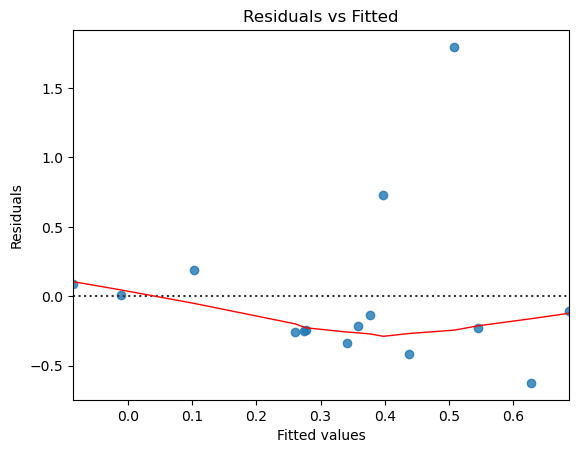

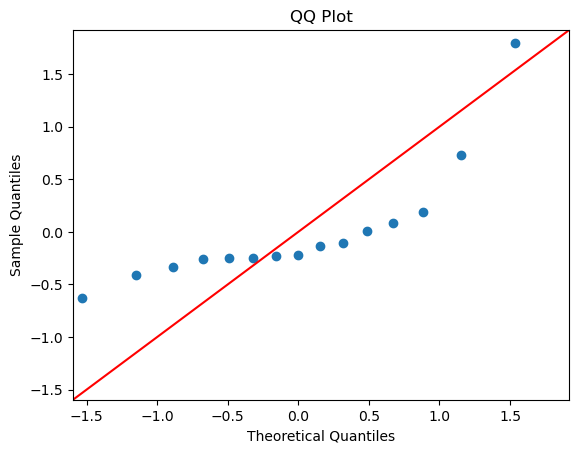

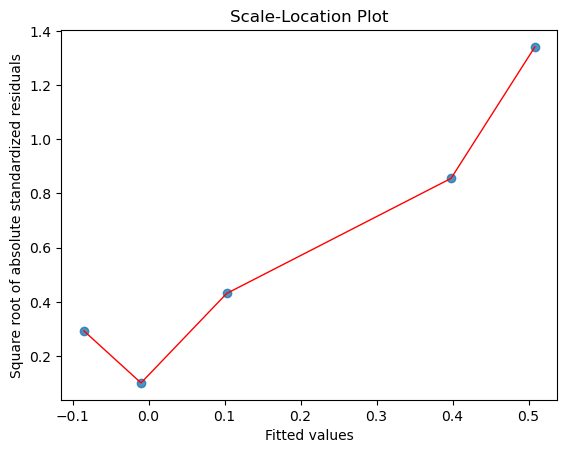

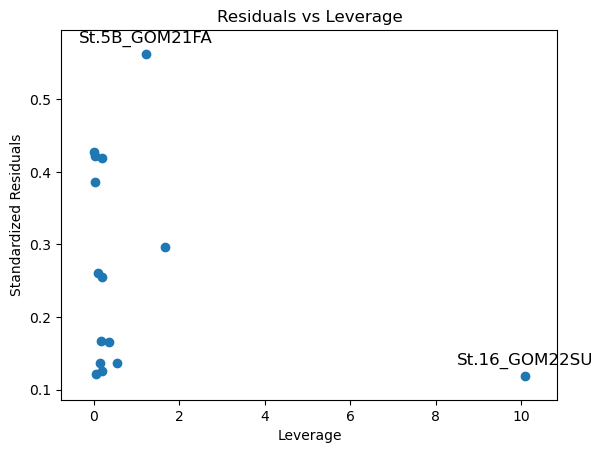

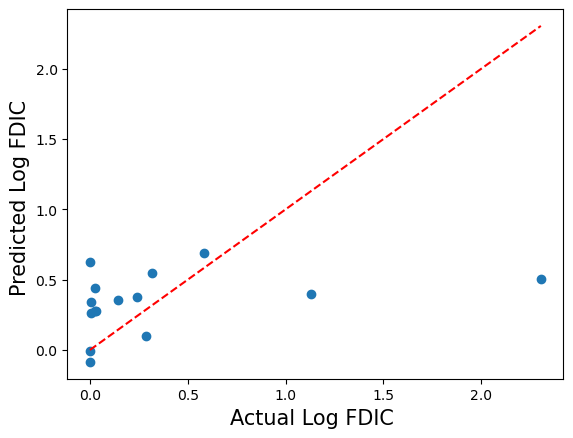

DOC excess = 1.4605 * Intercept + -0.8897 * doc_tdn_seds_over_water_5cm_log + -0.0123 * aou + 0.0095 * doc_tdn_seds_over_water_5cm_log:aou 


In [133]:
# Define the formula for linear regression
df_OM = data_wc_bbl
df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']
df_OM = df_OM[df_OM['flux_dic'] != 0] 
df_OM = df_OM[df_OM['rgn'] != 'Slope'] 
df_OM['flux_dic']
df_OM['DICflux_Cox'] = df_OM['flux_dic'] - df_OM['Cox']

df_OM['flux_dic_log'] = np.log(df_OM['flux_dic'])
df_OM['pw_flux_doc_log'] = np.log(df_OM['pw_flux_doc'])
df_OM['doc_tdn_seds_over_water_5cm_log'] = np.log(df_OM['doc_tdn_seds_over_water_5cm'])
df_OM['doc_tdn_bot_water_log'] = np.log(df_OM['doc_tdn_bot_water'])
df_OM['doc_tdn_seds_5cm_log'] = np.log(df_OM['doc_tdn_seds_5cm'])
df_OM['aou_log'] = np.log(df_OM['aou'])

df_OM['flux_dic_log'] = np.log(df_OM['flux_dic'])
df_OM['pw_flux_doc_log'] = np.log(df_OM['pw_flux_doc'])
df_OM['DICflux_Cox_log'] = df_OM['flux_dic_log'] - df_OM['pw_flux_doc_log']

df_OM['Cox_over_fluxes'] = df_OM['Cox'] / (df_OM['flux_dic'] + df_OM['pw_flux_doc'])


Val = 'Cox_over_fluxes'

formula = 'Cox_over_fluxes ~ doc_tdn_seds_over_water_5cm_log * aou'

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual Log FDIC ', size = 15)
plt.ylabel('Predicted Log FDIC ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("DOC excess =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()

In [155]:
df_OM['aou_log']

code
St.11_GOM2021      4.099215
St.13_GOM2021      4.498904
St.14_GOM2021      4.012325
St.15_GOM2021      4.547212
St.16_GOM2021      3.941345
St.2_GOM2021       4.085040
St.4_GOM2021       4.516230
St.5B_GOM2021           NaN
St.7_GOM2021       4.379011
St.9_GOM2021       3.878137
St.MK_GOM2021      4.557404
St.ML_GOM2021      4.505727
St.11_GOM21FA      4.941628
St.12_GOM21FA      4.850324
St.13_GOM21FA      5.089882
St.14_GOM21FA      4.664751
St.14.5_GOM21FA    4.621297
St.15_GOM21FA      4.861181
St.16_GOM21FA      3.929023
St.16-2_GOM21FA    4.173574
St.2_GOM21FA       4.615577
St.4_GOM21FA       3.412034
St.5B_GOM21FA      1.876514
St.6_GOM21FA       2.664694
St.7_GOM21FA       4.442235
St.9_GOM21FA       4.848519
St.MK_GOM21FA      3.773296
St.MK-2_GOM21FA    2.598906
St.13_GOM22SP      5.264341
St.14_GOM22SP      4.479893
St.15_GOM22SP      4.930976
St.16_GOM22SP      4.588772
St.2_GOM22SP       4.321644
St.4_GOM22SP            NaN
St.5B_GOM22SP      4.387435
St.7_GOM22SP   

In [182]:
df_OM = data_wc_bbl
#df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']
df_OM = df_OM[df_OM['flux_dic'] != 0] 
df_OM = df_OM[df_OM['Cox'] > 0] 
df_OM = df_OM[df_OM['rgn'] != 'Slope'] 
len(df_OM)
df_OM

,code,code.2,Press,ox,temp,sal,NPOC_uM,Depth,Campaign,Location,...,doc_tdn_bot_water,doc_tdn_seds_over_water_5cm_log,NEF_sed_transform,pw_flux_doc_log,pred,DOC_excess_pred,flux_dic_log,doc_tdn_bot_water_log,doc_tdn_seds_5cm_log,aou_log
code,,,,,,,,,,,,,,,,,,,,,
St.14_GOM2021,St.14_GOM2021,St.14_GOM2021,89.886,173.2896,19.1130,36.4274,70.231250,89.9,GOM2021,St.14,...,5.483756,0.411823,0.411823,-2.165388,16.616480,3.934078e+12,NaN,1.701790,1.289967,4.012325
St.16_GOM2021,St.16_GOM2021,St.16_GOM2021,61.486,170.6848,20.7133,36.3439,122.979167,61.5,GOM2021,St.16,...,7.694786,0.345450,0.345450,0.056134,31.887681,1.776392e+12,4.243023,2.040543,1.695093,3.941345
St.2_GOM2021,St.2_GOM2021,St.2_GOM2021,62.185,161.7824,20.8984,36.3435,81.102083,62.2,GOM2021,St.2,...,8.113106,0.560185,0.560185,-0.606696,20.534319,1.076842e+15,2.542515,2.093481,1.533295,4.085040
St.MK_GOM2021,St.MK_GOM2021,St.MK_GOM2021,16.692,105.1808,26.7773,35.2552,101.895833,16.7,GOM2021,St.MK,...,7.296888,-0.430094,-0.430094,-1.398676,10.520982,2.921391e+06,2.168331,1.987448,2.417542,4.557404
St.14_GOM21FA,St.14_GOM21FA,St.14_GOM21FA,88.507,126.7104,17.8368,36.3620,60.520833,88.5,GOM21FA,St.14,...,4.508070,-0.402953,-0.402953,-0.604283,13.548381,4.072730e+05,2.644846,1.505869,1.908822,4.664751
St.16_GOM21FA,St.16_GOM21FA,St.16_GOM21FA,57.598,163.9456,22.6311,36.2886,71.752083,57.6,GOM21FA,St.16,...,8.016993,0.971636,0.971636,-1.081384,23.345095,3.118098e+21,3.498310,2.081563,1.109927,3.929023
St.2_GOM21FA,St.2_GOM21FA,St.2_GOM21FA,61.199,126.2816,19.0932,36.4826,43.850000,61.2,GOM21FA,St.2,...,6.534675,0.706725,0.706725,-0.510392,27.278694,4.143687e+17,NaN,1.877123,1.170397,4.615577
St.4_GOM21FA,St.4_GOM21FA,St.4_GOM21FA,16.800,174.9408,27.1618,31.9036,123.479167,16.8,GOM21FA,St.4,...,13.763601,0.974378,0.974378,-1.624871,20.986976,4.503416e+20,NaN,2.622028,1.647649,3.412034
St.5B_GOM21FA,St.5B_GOM21FA,St.5B_GOM21FA,12.300,199.9648,26.9768,31.8208,128.395833,12.3,GOM21FA,St.5B,...,11.544905,0.909781,0.909781,-2.445232,17.695550,7.672022e+18,1.525656,2.446244,1.536463,1.876514


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)


                            OLS Regression Results                            
Dep. Variable:               flux_dic   R-squared:                       0.496
Model:                            OLS   Adj. R-squared:                  0.358
Method:                 Least Squares   F-statistic:                     3.605
Date:                Sat, 14 Dec 2024   Prob (F-statistic):             0.0494
Time:                        21:54:08   Log-Likelihood:                -64.222
No. Observations:                  15   AIC:                             136.4
Df Residuals:                      11   BIC:                             139.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

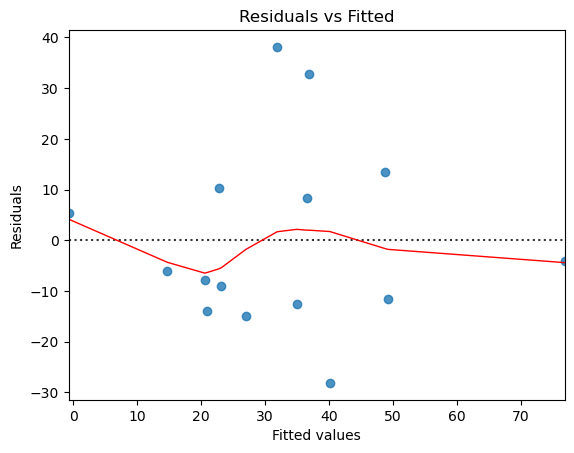

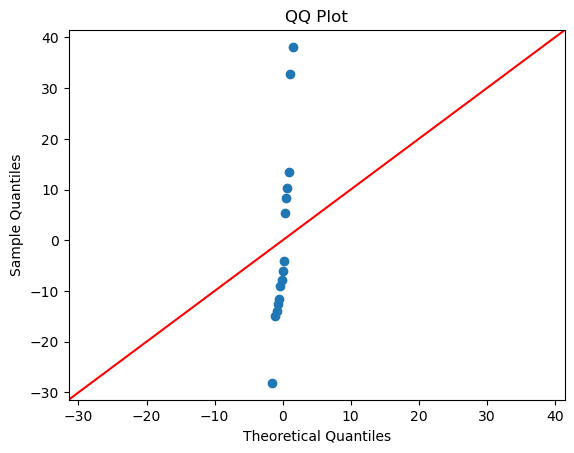

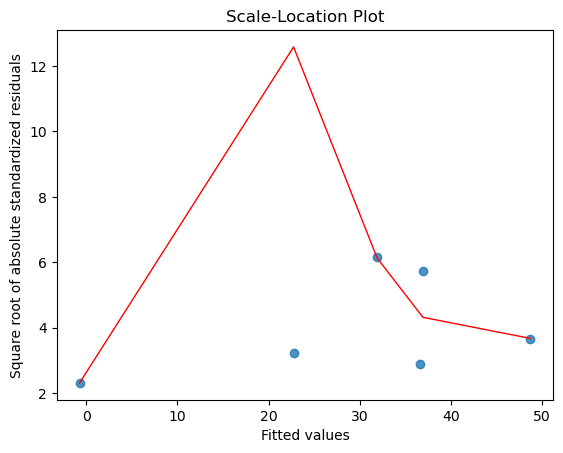

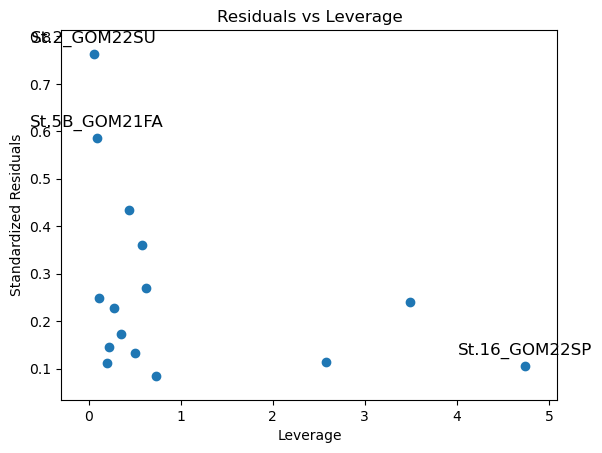

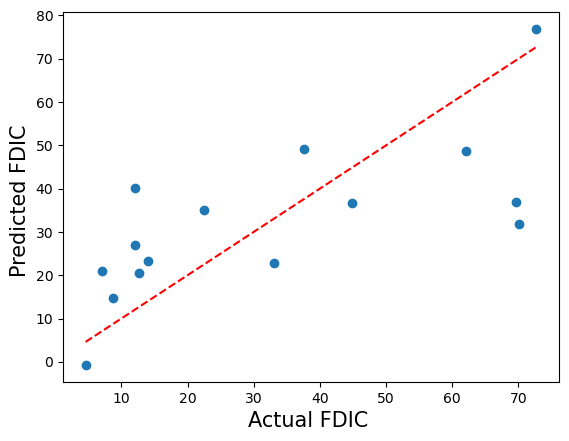

DOC excess = -22.9621 * Intercept + 0.6698 * Cox + 0.4878 * aou + 20.9473 * doc_tdn_seds_over_water_5cm_log 


In [180]:
# Define the formula for linear regression
df_OM = data_wc_bbl
#df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']
df_OM = df_OM[df_OM['flux_dic'] != 0] 
df_OM = df_OM[df_OM['Cox'] > 0] 
df_OM = df_OM[df_OM['rgn'] != 'Slope'] 

#df_OM['flux_dic_log'] = np.log(df_OM['flux_dic'])
#df_OM['pw_flux_doc_log'] = np.log(df_OM['pw_flux_doc'])
#df_OM['doc_tdn_seds_over_water_5cm_log'] = np.log(df_OM['doc_tdn_seds_over_water_5cm'])
#df_OM['doc_tdn_bot_water_log'] = np.log(df_OM['doc_tdn_bot_water'])
#df_OM['doc_tdn_seds_5cm_log'] = np.log(df_OM['doc_tdn_seds_5cm'])
#df_OM['aou_log'] = np.log(df_OM['aou'])


Val = 'flux_dic'

formula = 'flux_dic ~ Cox + aou + doc_tdn_seds_over_water_5cm_log'
#formula = 'flux_dic ~ Cox '

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual FDIC ', size = 15)
plt.ylabel('Predicted FDIC ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("DOC excess =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()

In [175]:
0.496-0.239 
20.9473 * df_OM['doc_tdn_seds_over_water_5cm_log'].mean()

12.054071223281388

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


MissingDataError: exog contains inf or nans

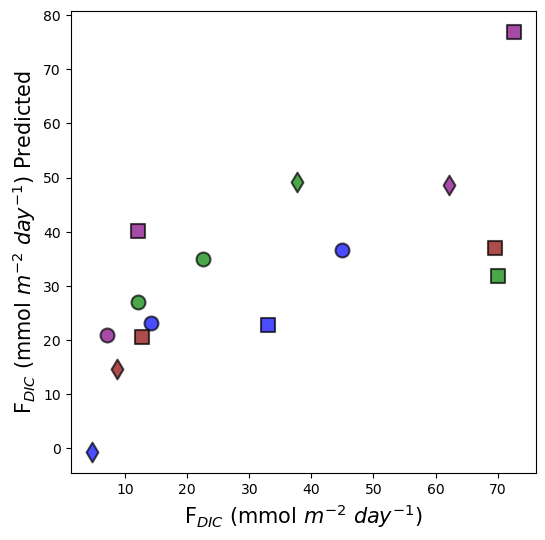

In [177]:
color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor= 'black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False,)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    #SLOPE 
    X = np.log(data[[x_var]])
    y = np.log(data[y_var])
    
    # Perform TLS regression
    beta_tls = tls_regression(X, y)

    # Print coefficients
    intercept_tls, slope_tls = beta_tls

    results = regress2(X, y, _method_type_2="reduced major axis")

    intercept = results['intercept']
    slope = results['slope']
    r = results['r'] * results['r']

    print("SLOPE")
    print("Intercept (TLS):", intercept)
    print("Slope (TLS):", slope)
    print("R2 (TLS):", r)
    print("")

    X=0.1
    axes.axline((3.5,3.5), (4,4), linewidth=2, color='black', linestyle='-')

    #axes.set_xscale("log")
    #axes.set_yscale("log")

    

    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()



df_OM['new_col'] = df_OM['pred']

y_var = 'new_col'
y_var_lab = r'F$_{DIC}$ (mmol $m^{-2}$ $day^{-1})$ Predicted'

x_var = 'flux_dic'
x_var_lab = r'F$_{DIC}$ (mmol $m^{-2}$ $day^{-1})$'

z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(df_OM)

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3368744565.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3368744565.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['flux_dic_log'] = np.log(df_OM['flux_dic'])
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3368744565.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_

                            OLS Regression Results                            
Dep. Variable:           flux_dic_log   R-squared:                       0.280
Model:                            OLS   Adj. R-squared:                  0.211
Method:                 Least Squares   F-statistic:                     4.074
Date:                Sat, 14 Dec 2024   Prob (F-statistic):             0.0320
Time:                        18:58:28   Log-Likelihood:                -28.381
No. Observations:                  24   AIC:                             62.76
Df Residuals:                      21   BIC:                             66.30
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

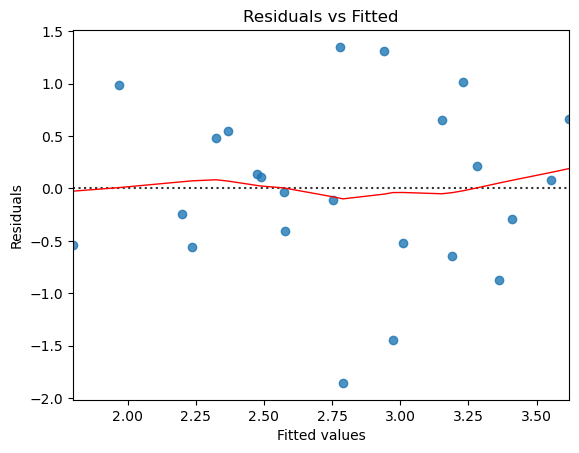

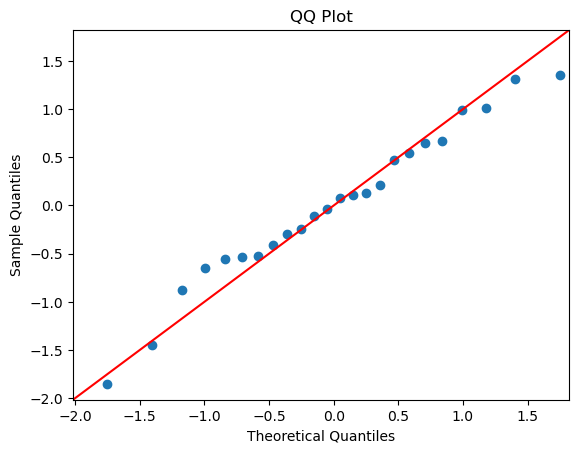

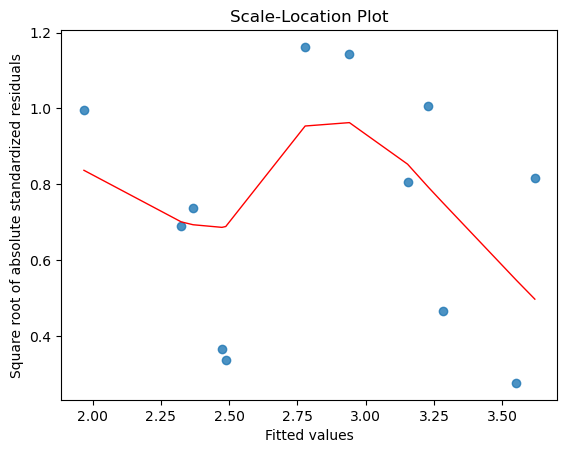

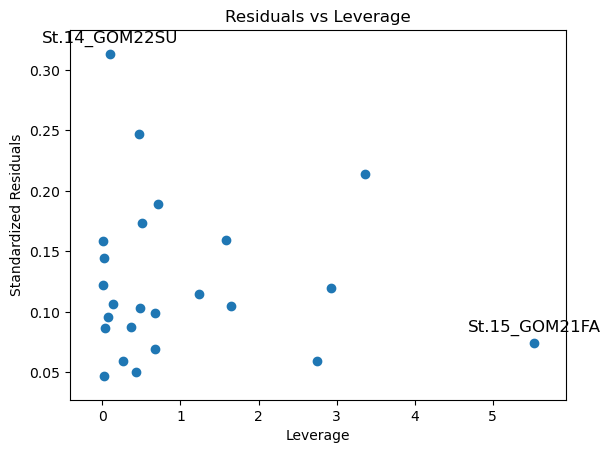

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3368744565.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['pred'] = predicted


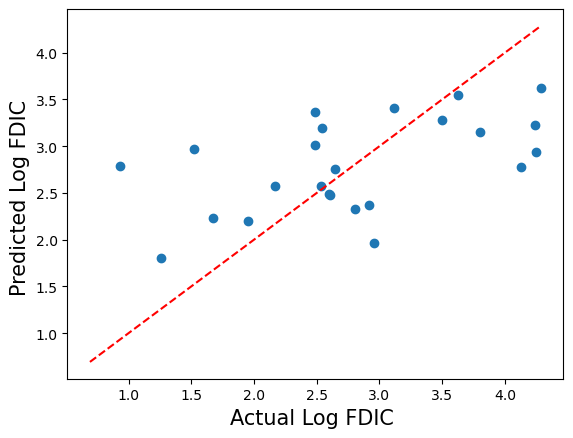

DOC excess = 3.0612 * Intercept + 0.2053 * pw_flux_doc_log + 0.4550 * doc_tdn_seds_over_water_5cm_log 


In [84]:
# Define the formula for linear regression
df_OM = data_wc_bbl
df_OM['doc_tdn_bot_water'] = df_OM['DOC:TDN']
df_OM = df_OM[df_OM['flux_dic'] != 0] 
#df_OM = df_OM[df_OM['rgn'] == 'Slope'] 

df_OM['flux_dic_log'] = np.log(df_OM['flux_dic'])
df_OM['pw_flux_doc_log'] = np.log(df_OM['pw_flux_doc'])
df_OM['doc_tdn_seds_over_water_5cm_log'] = np.log(df_OM['doc_tdn_seds_over_water_5cm'])
df_OM['doc_tdn_bot_water_log'] = np.log(df_OM['doc_tdn_bot_water'])
df_OM['doc_tdn_seds_5cm_log'] = np.log(df_OM['doc_tdn_seds_5cm'])
df_OM['aou_log'] = np.log(df_OM['aou'])


Val = 'flux_dic_log'

formula = 'flux_dic_log ~ pw_flux_doc_log + doc_tdn_seds_over_water_5cm_log '

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual Log FDIC ', size = 15)
plt.ylabel('Predicted Log FDIC ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("DOC excess =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()

In [85]:
df_OM['doc_tdn_seds_over_water_5cm_log'] = np.log(df_OM['doc_tdn_seds_over_water_5cm'])
df_OM['doc_tdn_seds_over_water_5cm_log']

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\1523241359.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['doc_tdn_seds_over_water_5cm_log'] = np.log(df_OM['doc_tdn_seds_over_water_5cm'])


code
St.11_GOM2021     -1.275863
St.13_GOM2021           NaN
St.14_GOM2021      0.411823
St.15_GOM2021     -1.114131
St.16_GOM2021      0.345450
St.2_GOM2021       0.560185
St.4_GOM2021            NaN
St.5B_GOM2021           NaN
St.MK_GOM2021     -0.430094
St.ML_GOM2021           NaN
St.11_GOM21FA     -1.342402
St.12_GOM21FA     -1.329097
St.13_GOM21FA     -1.795089
St.14_GOM21FA     -0.402953
St.14.5_GOM21FA         NaN
St.15_GOM21FA     -0.529305
St.16_GOM21FA      0.971636
St.16-2_GOM21FA         NaN
St.2_GOM21FA       0.706725
St.4_GOM21FA       0.974378
St.5B_GOM21FA      0.909781
St.6_GOM21FA            NaN
St.7_GOM21FA       0.858326
St.MK-2_GOM21FA         NaN
St.13_GOM22SP     -1.784834
St.14_GOM22SP      0.274697
St.15_GOM22SP     -1.118732
St.16_GOM22SP      0.315582
St.4_GOM22SP       0.548151
St.5B_GOM22SP      1.541187
St.7_GOM22SP       0.999525
St.9_GOM22SP       0.869115
St.MK_GOM22SP      0.206459
St.11_GOM22SU     -1.797014
St.12_GOM22SU           NaN
St.13_GOM22SU  

                            OLS Regression Results                            
Dep. Variable:       aou_ceq_doc_diff   R-squared:                       0.497
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     18.26
Date:                Sat, 14 Dec 2024   Prob (F-statistic):           3.04e-06
Time:                        18:58:31   Log-Likelihood:                -187.72
No. Observations:                  40   AIC:                             381.4
Df Residuals:                      37   BIC:                             386.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            25.6867      7.80

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2142590370.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['doc_tdn_seds_over_water_5cm_log'] = np.log(df_OM['doc_tdn_seds_over_water_5cm'])
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2142590370.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['NEF_sed_transform'] = df_OM['doc_tdn_seds_over_water_5cm_log']
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2142590370.py:9: SettingWithCopyWarning: 
A value is trying to be set on a cop

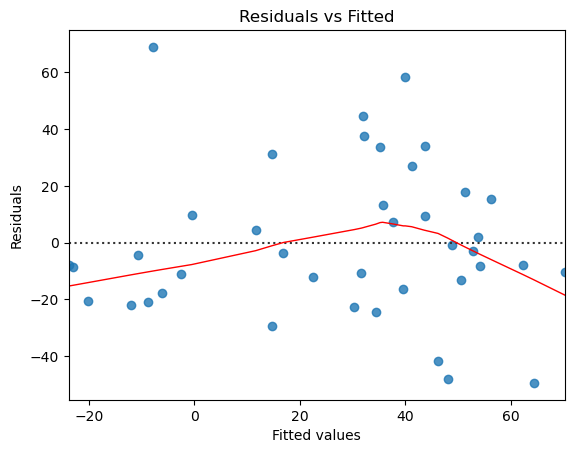

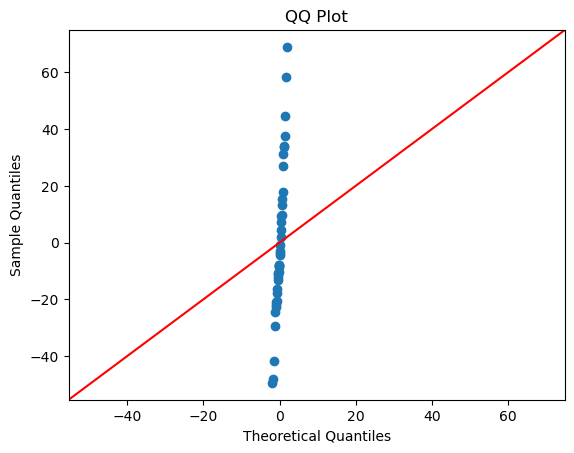

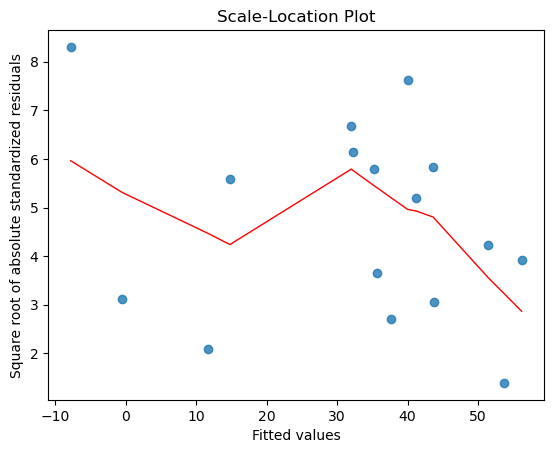

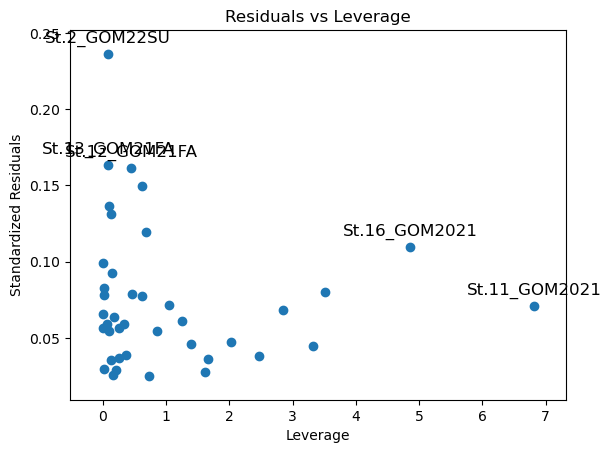

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\2142590370.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['pred'] = predicted


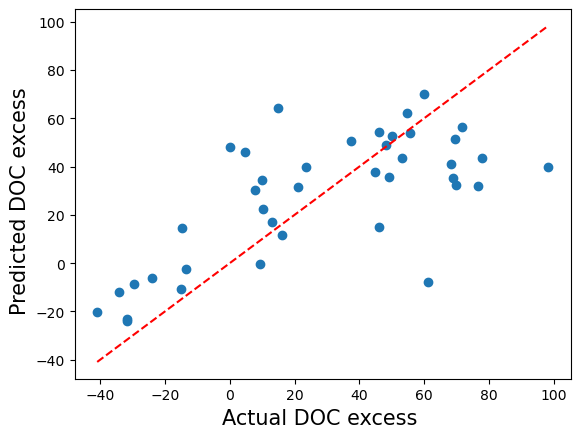

DOC excess = 25.6867 * Intercept + 4.4480 * pw_flux_doc + 27.8842 * NEF_sed_transform 


In [86]:
# Define the formula for linear regression

df_OM = data_wc_bbl
#df_OM = df_OM[df_OM['rgn'] != 'Hypoxic Shelf'] 
#df_OM = df_OM[df_OM['rgn'] != 'Slope'] 
df_OM['doc_tdn_seds_over_water_5cm_log'] = np.log(df_OM['doc_tdn_seds_over_water_5cm'])
df_OM['NEF_sed_transform'] = df_OM['doc_tdn_seds_over_water_5cm_log']

df_OM['pw_flux_doc_log'] = np.log(df_OM['pw_flux_doc'])


Val = 'aou_ceq_doc_diff'

formula = 'aou_ceq_doc_diff ~ pw_flux_doc + NEF_sed_transform '

# Fit the linear regression model
model = sm.formula.ols(formula=formula, data=df_OM).fit()
print(model.summary())

# Residuals
residuals = model.resid

# Plot 1: Residuals vs Fitted values
sns.residplot(x=model.fittedvalues, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

# Plot 2: QQ Plot
sm.qqplot(residuals, line ='45')
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# Plot 3: Scale-Location Plot
sqrt_abs_standardized_resid = abs(residuals**0.5)
sns.regplot(x=model.fittedvalues, y=sqrt_abs_standardized_resid, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Scale-Location Plot')
plt.xlabel('Fitted values')
plt.ylabel('Square root of absolute standardized residuals')
plt.show()

# Plot 4: Residuals vs Leverage Plot (Cook's distance)
sm.graphics.plot_leverage_resid2(model)
plt.title('Residuals vs Leverage')
plt.xlabel('Leverage')
plt.ylabel('Standardized Residuals')
plt.show()

# Make predictions
predicted = model.predict(df_OM)

# Insert predictions back to dataframe
df_OM['pred'] = predicted

# Plot
plt.scatter(df_OM[Val], predicted)
plt.xlabel(r'Actual DOC excess ', size = 15)
plt.ylabel('Predicted DOC excess  ', size = 15)
plt.title('')
plt.plot([df_OM[Val].min(), df_OM[Val].max()], 
         [df_OM[Val].min(), df_OM[Val].max()], 'r--')
plt.show()

# Extract coefficients and corresponding variables
coefficients = model.params
variables = coefficients.index.tolist()


# Print out the equation nicely
print("DOC excess =", end=" ")
for i, (variable, coefficient) in enumerate(zip(variables, coefficients)):
    if i != 0:
        print("+", end=" ")
    print(f"{coefficient:.4f} * {variable}", end=" ")
print()

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_12996\3046155078.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_OM['DOC_excess_pred'] = np.exp( 7.7325 + -15.0275 * df_OM['pw_flux_doc'] + 13.9519  * df_OM['doc_tdn_seds_over_water_5cm'] + 11.1495 * df_OM['pw_flux_doc'] * df_OM['doc_tdn_seds_over_water_5cm'] )


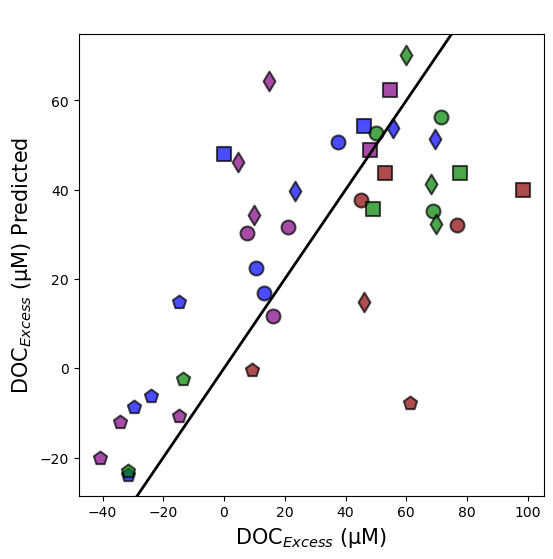

In [87]:

df_OM['DOC_excess_pred'] = np.exp( 7.7325 + -15.0275 * df_OM['pw_flux_doc'] + 13.9519  * df_OM['doc_tdn_seds_over_water_5cm'] + 11.1495 * df_OM['pw_flux_doc'] * df_OM['doc_tdn_seds_over_water_5cm'] ) 

#df_OM = df_OM[df_OM['flux_dic_log'] >= 0 ]

color_map = {
    'GOM2021': 'darkred',
    'GOM21FA': 'blue',
    'GOM22SP': 'green',
    'GOM22SU': 'purple'
}

marker_map = {
    'Slope': 'p',
    'Distal Shelf': 'o',
    'Proximal Shelf': 's',
    'Hypoxic Shelf': 'd'
}

label_map = {
    'GOM2021': 'Summer 2021',
    'GOM21FA': 'Fall 2021',
    'GOM22SP': 'Spring 2022',
    'GOM22SU': 'Summer 2022'
}

def xyplotcolor_cat_color(df):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    model = LinearRegression()
    sub = df.dropna(subset=[x_var, y_var])
    data = sub[[x_var, y_var, z_var, 'rgn', 'sal', 'code']]
    subcat = data['Campaign'].tolist()
    subrgn = data['rgn'].tolist()

    X = data[[x_var]]
    y = data[y_var]
    model.fit(X, y)
    score = model.score(X, y)
    
    for campaign in data[z_var].unique():
        for region in data['rgn'].unique():
            subset = data[(data[z_var] == campaign) & (data['rgn'] == region)]
            sns.scatterplot(
                x=subset[x_var], 
                y=subset[y_var], 
                marker=marker_map.get(region, 'o'), 
                color=color_map.get(campaign, 'grey'), 
                label=f"{label_map.get(campaign, campaign)} ({region})",
                s=100, 
                edgecolor= 'black', 
                linewidth=1.5, alpha = 0.7, 
                ax=axes, 
                legend=False,)
    
    axes.set_xlabel(x_var_lab, size=15)
    axes.set_ylabel(y_var_lab, size=15)

    axes.axline((3.5,3.5), (4,4), linewidth=2, color='black', linestyle='-')

    #axes.set_xscale("log")
    #axes.set_yscale("log")
    axes.set_title(titel, size=15)
    
    #plt.savefig(f'../Dissertation_projects/Figures/CTD_profiles/{save_name}.png')
    plt.show()

x_var = 'aou_ceq_doc_diff'
x_var_lab = r'DOC$_{Excess}$ (µM)'

y_var = 'pred'
y_var_lab = r'DOC$_{Excess}$ (µM) Predicted'


z_var = 'Campaign'
#z_var_lab = 'Campaign'
#z_var_color = cmo.thermal

#titel = "Water Column "
#save_name = 'sal_temp_doc_wc'
#xyplotcolor_cat_color(data_wc)

titel = " "
save_name = 'final_fig_maybe'
xyplotcolor_cat_color(df_OM)

In [88]:
import statsmodels.formula.api as smf

# Define the formula for the LMM (fixed effect for pw_flux_doc)
formula = 'aou_ceq_doc_diff ~ np.log(pw_flux_doc)'

# Random intercepts for both 'rgn' and 'Campaign'
# We combine 'rgn' and 'Campaign' into one "grouping" variable in the MixedLM
lmm = smf.mixedlm(formula, df_OM, groups=df_OM['rgn'], 
                  re_formula="pw_flux_doc")  # Only random intercept for 'rgn'

# Fit the model
result = lmm.fit()

# Print the summary of the model fit
print(result.summary())


ValueError: Shape mismatch between endog/exog and extra 2d arrays given to model.

In [ ]:
import statsmodels.formula.api as smf

# Define the formula for the LMM (fixed effect for pw_flux_doc)
formula = 'aou_ceq_doc_diff ~ pw_flux_doc'

# Fit the model with two random effects for 'rgn' and 'Campaign'
# Specify the groups for 'Campaign' while keeping 'rgn' for the random effects
lmm = smf.mixedlm(formula, df_OM, 
                  groups=df_OM['rgn'], 
                  re_formula="1 + C(Campaign)")  # Random intercepts for both 'rgn' and 'Campaign'

# Fit the model
result = lmm.fit()

# Print the summary of the model fit
print(result.summary())
